
**First things first** - please go to 'File' and select 'Save a copy in Drive' so that you have your own version of this activity set up and ready to use.
Remember to update the portfolio index link to your own work once completed!

# Applying supervised learning to predict student dropout rate

In this project, we will examine student data and use supervised learning techniques to predict whether a student will drop out. In the education sector, retaining students is vital for the institution's financial stability and for students’ academic success and personal development. A high dropout rate can lead to significant revenue loss, diminished institutional reputation, and lower overall student satisfaction.
<br></br>

## **Business context**
Study Group specialises in providing educational services and resources to students and professionals across various fields. The company's primary focus is on enhancing learning experiences through a range of services, including online courses, tutoring, and educational consulting. By leveraging cutting-edge technology and a team of experienced educators, Study Group aims to bridge the gap between traditional learning methods and the evolving needs of today's learners.

Study Group serves its university partners by establishing strategic partnerships to enhance the universities’ global reach and diversity. It supports the universities in their efforts to attract international students, thereby enriching the cultural and academic landscape of their campuses. It works closely with university faculty and staff to ensure that the universities are prepared and equipped to welcome and support a growing international student body. Its partnership with universities also offers international students a seamless transition into their chosen academic environment. Study Group runs several International Study Centres across the UK and Dublin in partnership with universities with the aim of preparing a pipeline of talented international students from diverse backgrounds for degree study. These centres help international students adapt to the academic, cultural, and social aspects of studying abroad. This is achieved by improving conversational and subject-specific language skills and academic readiness before students progress to a full degree programme at university.

Through its comprehensive suite of services, it supports learners and universities at every stage of their educational journey, from high school to postgraduate studies. Its approach is tailored to meet the unique needs of each learner, offering personalised learning paths and flexible scheduling options to accommodate various learning styles and commitments.

Study Group's services are designed to be accessible and affordable, making quality education a reality for many individuals. By focusing on the integration of technology and personalised learning, the company aims to empower learners to achieve their full potential and succeed in their academic and professional pursuits. Study Group is at the forefront of transforming how people learn and grow through its dedication to innovation and excellence.
Study Group has provided you a course-level data set.

<br></br>

## **Objective**
By the end of this project, we will have developed the skills and knowledge to apply advanced machine learning techniques to create a predictive model for student dropout. This project will involve comprehensive data exploration, preprocessing, and feature engineering to ensure high-quality input for the models. We will employ and compare multiple predictive algorithms - XGBoost and neural network-based model, to determine the most effective model for predicting student dropout.

In the Notebook, We will:
- explore the data set
- preprocess the data and conduct feature engineering
- predict dropout using XGBoost, and neural network-based model
- Identify the most important predictors of dropout.
<br></br>

By completing this project, you will be able to provide evidence that you can:
- develop accurate predictions across diverse organisational scenarios by building and testing advanced machine learning models
- inform data-driven decision-making with advanced machine learning algorithms and models
- propose and present effective solutions to organisational problems using data preprocessing, model selection, and insightful analysis techniques.
<br></br>

## **Project guidance**

Data preparation
1. Import the required libraries and data set with the provided URL.
  - Data set drive: https://drive.google.com/drive/folders/130AVMFxTOtRiC7GOl7QmSo0I7B0iChv5
2. Read the course-level csv file and make it available as a dataframe.

3. From the dataframe, remove the following columns:

columns= ['BookingId','BookingType', 'LeadSource', 'DiscountType',
                                                    'Nationality', 'HomeCountry',
                                                    'HomeState',
                                                    'HomeCity',
                                                    'PresentCount',
                                                    'LateCount', 'AuthorisedAbsenceCount','ArrivedDate','NonCompletionReason',
                                                    'TerminationDate',
                                                    'CourseFirstIntakeDate', 'CourseStartDate','CourseEndDate',
                                                    'AcademicYear', 'CourseName',
                                                    'LearnerCode', 'ProgressionDegree',
                                                    'EligibleToProgress',
                                                    'AssessedModules',
                                                    'PassedModules',
                                                    'FailedModules',
                                                    'AttendancePercentage',
                                                    'ContactHours']

From here on, you will perform the rest of the actvities mentioned in the rubric with the smaller set of features obtained after performing the above step.

General Instructions that apply throughout this project activity:
  - Use the standard scaler to scale your numeric input features.
  - Split the data into train and test sets. Apply 80-20 split.
  - Print accuracy, confusion matrix, precision, recall and AUC on the test set
    for all your models.
  - Compare the performance (on the test set) obtained from the non-optimised
    model with the best performing model. Record your observations. What differences do you see and which metrics are improved or not improved?
<br></br>


In [1]:
# Import the relevant libraries.
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam, RMSprop
import matplotlib.pyplot as plt

In [2]:
# Load the Course 2 data set.
import os
import pandas as pd
# Install the gdown library if not installed
!pip install gdown
import gdown

# Load the Course 2 data set.
# Use gdown to download the file from Google Drive
url = 'https://drive.google.com/uc?id=1rKxv26grdaO6KuN8ZGQX5C-eZ0N6o_hg&export=download'  # Update with the correct file ID
output = 'CourseLevelDatasetVersion2.csv'
gdown.download(url, output, quiet=False)

# Read the downloaded CSV file into a pandas DataFrame
student_df = pd.read_csv(output, delimiter=',')

Downloading...
From: https://drive.google.com/uc?id=1rKxv26grdaO6KuN8ZGQX5C-eZ0N6o_hg&export=download
To: /content/CourseLevelDatasetVersion2.csv
100%|██████████| 9.01M/9.01M [00:00<00:00, 38.8MB/s]


In [3]:
student_df.head()

,CentreName,AcademicYear,LearnerCode,BookingId,BookingType,LeadSource,DiscountType,DateofBirth,Gender,Nationality,...,CreditWeightedAverage,ProgressionDegree,ProgressionUniversity,EligibleToProgress,PresentCount,LateCount,AuthorisedAbsenceCount,UnauthorisedAbsenceCount,ContactHours,AttendancePercentage
0,ISC_Aberdeen,2019/20,2284932,31261386,Agent,Standard Agent Booking,NaN,13/01/1998,Male,Chinese,...,75.0,Msc Econ Accounting and Investment Management,University of Aberdeen,Yes,NaN,NaN,NaN,NaN,NaN,NaN
1,ISC_Aberdeen,2019/20,2399500,31979379,Agent,Standard Agent Booking,NaN,12/02/1998,Male,Chinese,...,73.0,BSc Biological Sciences,University of Aberdeen,Yes,80.0,0.0,93.0,5.0,215.0,97.0
2,ISC_Aberdeen,2019/20,2424946,27491184,Agent,Standard Agent Booking,NaN,07/04/2000,Male,Chinese,...,66.0,MA Finance,University of Aberdeen,Yes,88.0,0.0,92.0,6.0,226.0,97.0
3,ISC_Aberdeen,2019/20,2426583,28689190,Agent,Standard Agent Booking,NaN,18/05/1999,Male,Chinese,...,71.0,MA Business Management,University of Aberdeen,Yes,164.0,12.0,67.0,15.0,399.0,94.0
4,ISC_Aberdeen,2019/20,2434674,35141670,Agent,Standard Agent Booking,NaN,19/04/1996,Male,Chinese,...,60.0,MSc International Business Management,University of Aberdeen,Yes,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
student_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25059 entries, 0 to 25058
Data columns (total 36 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CentreName                25059 non-null  object 
 1   AcademicYear              25059 non-null  object 
 2   LearnerCode               25059 non-null  int64  
 3   BookingId                 25059 non-null  int64  
 4   BookingType               25059 non-null  object 
 5   LeadSource                25059 non-null  object 
 6   DiscountType              7595 non-null   object 
 7   DateofBirth               25059 non-null  object 
 8   Gender                    25059 non-null  object 
 9   Nationality               25059 non-null  object 
 10  HomeCountry               24713 non-null  object 
 11  HomeState                 8925 non-null   object 
 12  HomeCity                  21611 non-null  object 
 13  CourseLevel               25059 non-null  object 
 14  Course

In [5]:
print(student_df.shape)

(25059, 36)


In [6]:
student_df.isnull().sum()

,0
CentreName,0
AcademicYear,0
LearnerCode,0
BookingId,0
BookingType,0
LeadSource,0
DiscountType,17464
DateofBirth,0
Gender,0
Nationality,0


Note that most of the rows having null values in at least one column. If we delete all such rows, the number of rows in the dataset drastically reduces to 176. Hence we have decided to delete rows having null values only AFTER we have removed the irrelevant columns that have been advised to be deleted in project guidance above.

We drop some features as advised in the project guidance.

In [7]:
df = student_df.drop(['BookingId','BookingType', 'LeadSource',
                      'DiscountType', 'Nationality', 'HomeCountry',
                      'HomeState', 'HomeCity', 'PresentCount', 'LateCount',
                      'AuthorisedAbsenceCount','ArrivedDate',
                      'NonCompletionReason', 'TerminationDate',
                      'CourseFirstIntakeDate', 'CourseStartDate',
                      'CourseEndDate', 'AcademicYear', 'CourseName',
                      'LearnerCode', 'ProgressionDegree',
                      'EligibleToProgress', 'AssessedModules',
                      'PassedModules', 'FailedModules',
                      'AttendancePercentage', 'ContactHours'], axis=1)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25059 entries, 0 to 25058
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CentreName                25059 non-null  object 
 1   DateofBirth               25059 non-null  object 
 2   Gender                    25059 non-null  object 
 3   CourseLevel               25059 non-null  object 
 4   IsFirstIntake             25059 non-null  bool   
 5   CompletedCourse           25059 non-null  object 
 6   CreditWeightedAverage     22763 non-null  float64
 7   ProgressionUniversity     25059 non-null  object 
 8   UnauthorisedAbsenceCount  24851 non-null  float64
dtypes: bool(1), float64(2), object(6)
memory usage: 1.6+ MB


In [9]:
df.shape

(25059, 9)

In [10]:
df.isnull().sum()

,0
CentreName,0
DateofBirth,0
Gender,0
CourseLevel,0
IsFirstIntake,0
CompletedCourse,0
CreditWeightedAverage,2296
ProgressionUniversity,0
UnauthorisedAbsenceCount,208


In [11]:
df = df.dropna().reset_index(drop=True)
print(df.shape)
df.info()

(22686, 9)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22686 entries, 0 to 22685
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CentreName                22686 non-null  object 
 1   DateofBirth               22686 non-null  object 
 2   Gender                    22686 non-null  object 
 3   CourseLevel               22686 non-null  object 
 4   IsFirstIntake             22686 non-null  bool   
 5   CompletedCourse           22686 non-null  object 
 6   CreditWeightedAverage     22686 non-null  float64
 7   ProgressionUniversity     22686 non-null  object 
 8   UnauthorisedAbsenceCount  22686 non-null  float64
dtypes: bool(1), float64(2), object(6)
memory usage: 1.4+ MB


Note that after removing some irrelevant features, and then dropping the rows having null values, the dataset has now 22686 rows. So, we adopt this order of operations otherwise a small of number of rows (as small as 176) will make the problem quite meaningless.

#3. An Analysis for Feature Engineering

In [12]:
FEdf = df.copy()
FEdf['CentreName'].value_counts()

,count
CentreName,
ISC_Sheffield,5814
ISC_Durham,2470
ISC_Leeds,2061
ISC_Sussex,2033
ISC_Huddersfield,1593
ISC_Kingston,1289
ISC_Lancaster,1071
ISC_Surrey,969
ISC_RHUL,899


1. This informs us that the feature **CentreName** would need OneHotEncoding (OHE). In this attempt we do not group the values of the CentreName feature as this may compromise accuracy of our results.

### One Hot Encoding for the CentreName feature:

In [14]:
from sklearn.preprocessing import OneHotEncoder
# Initialise OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)
# Apply one-hot encoding to the categorical columns
one_hot_encoded = encoder.fit_transform(FEdf[['CentreName']])
# Create a DataFrame with the one-hot encoded columns
one_hot_df = pd.DataFrame.from_records(one_hot_encoded,
                          columns=encoder.get_feature_names_out())
# Concatenate the on-hot encoded dataframe with the original dataframe
FEdf = pd.concat([FEdf, one_hot_df], axis=1)
# Drop the original categorical columns
FEdf = FEdf.drop('CentreName', axis=1)
FEdf.head(10)

,DateofBirth,Gender,CourseLevel,IsFirstIntake,CompletedCourse,CreditWeightedAverage,ProgressionUniversity,UnauthorisedAbsenceCount,CentreName_ISC_Aberdeen,CentreName_ISC_Cardiff,...,CentreName_ISC_Leeds,CentreName_ISC_Lincoln,CentreName_ISC_London,CentreName_ISC_Online,CentreName_ISC_RHUL,CentreName_ISC_Sheffield,CentreName_ISC_Strathclyde,CentreName_ISC_Surrey,CentreName_ISC_Sussex,CentreName_ISC_Teesside
0,12/02/1998,Male,Foundation,False,Yes,73.0,University of Aberdeen,5.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,07/04/2000,Male,International Year Two,False,Yes,66.0,University of Aberdeen,6.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,18/05/1999,Male,International Year Two,True,Yes,71.0,University of Aberdeen,15.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,24/07/2000,Male,International Year Two,True,Yes,78.0,University of Aberdeen,3.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,28/11/2001,Male,Foundation,False,Yes,68.0,University of Aberdeen,25.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,27/08/1999,Female,Foundation,True,Yes,81.0,University of Aberdeen,9.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,25/07/2000,Female,Foundation,True,Yes,83.0,University of Aberdeen,6.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,08/07/2000,Female,International Year Two,False,Yes,74.0,University of Aberdeen,3.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,28/09/2001,Male,Foundation,True,Yes,82.0,University of Aberdeen,36.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,22/04/1999,Male,Foundation,True,Yes,87.0,University of Aberdeen,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [15]:
FEdf.shape

(22686, 27)

2. The **DateofBirth** feature will be more useful in this business context when it is transformed into the **Age** feature.

In [16]:
# First the 'Customer_BirthDate' needs to changed into the format '%d%b%Y'.
# Then the 'Age' variable is added which calculates the record of number of days
# from today back to cistomer's day of birth.
from datetime import datetime
FEdf['DateofBirth'] = pd.to_datetime(FEdf['DateofBirth'], format='%d/%m/%Y')
FEdf['Age'] = (pd.to_datetime('today') -
                   FEdf['DateofBirth']).dt.days/365.25
# Drop the variable 'Customer_BirthDate' now.
FEdf = FEdf.drop(['DateofBirth'], axis=1)
print(FEdf.shape)
FEdf.head()

(22686, 27)


,Gender,CourseLevel,IsFirstIntake,CompletedCourse,CreditWeightedAverage,ProgressionUniversity,UnauthorisedAbsenceCount,CentreName_ISC_Aberdeen,CentreName_ISC_Cardiff,CentreName_ISC_Dublin,...,CentreName_ISC_Lincoln,CentreName_ISC_London,CentreName_ISC_Online,CentreName_ISC_RHUL,CentreName_ISC_Sheffield,CentreName_ISC_Strathclyde,CentreName_ISC_Surrey,CentreName_ISC_Sussex,CentreName_ISC_Teesside,Age
0,Male,Foundation,False,Yes,73.0,University of Aberdeen,5.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,26.735113
1,Male,International Year Two,False,Yes,66.0,University of Aberdeen,6.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.585900
2,Male,International Year Two,True,Yes,71.0,University of Aberdeen,15.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25.475702
3,Male,International Year Two,True,Yes,78.0,University of Aberdeen,3.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.290212
4,Male,Foundation,False,Yes,68.0,University of Aberdeen,25.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.943190


In [17]:
FEdf['Gender'].value_counts()

,count
Gender,
Male,13775
Female,8911


3. The **Gender** feature can just replace values of 1 for Male and 0 for Female.

In [18]:
FEdf['Gender'] = FEdf['Gender'].map({'Male': 1,'Female': 0})

In [19]:
FEdf.head()

,Gender,CourseLevel,IsFirstIntake,CompletedCourse,CreditWeightedAverage,ProgressionUniversity,UnauthorisedAbsenceCount,CentreName_ISC_Aberdeen,CentreName_ISC_Cardiff,CentreName_ISC_Dublin,...,CentreName_ISC_Lincoln,CentreName_ISC_London,CentreName_ISC_Online,CentreName_ISC_RHUL,CentreName_ISC_Sheffield,CentreName_ISC_Strathclyde,CentreName_ISC_Surrey,CentreName_ISC_Sussex,CentreName_ISC_Teesside,Age
0,1,Foundation,False,Yes,73.0,University of Aberdeen,5.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,26.735113
1,1,International Year Two,False,Yes,66.0,University of Aberdeen,6.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.585900
2,1,International Year Two,True,Yes,71.0,University of Aberdeen,15.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25.475702
3,1,International Year Two,True,Yes,78.0,University of Aberdeen,3.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.290212
4,1,Foundation,False,Yes,68.0,University of Aberdeen,25.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.943190


In [20]:
FEdf.shape

(22686, 27)

In [21]:
FEdf['CourseLevel'].value_counts()

,count
CourseLevel,
Foundation,13234
Pre-Masters,5636
International Year One,3775
International Year Two,41


4. As the project guideline suggests One Hot Encoding (OHE) for the categorical feature, the feature **CourseLevel** should also be encoded through OHE. However, this feature could be encoded as having values 0, 1, 2, 3 for the four course levels, which can help avoid sparsity in data set and possibly avoid some potential problems in model learning.

In [22]:
from sklearn.preprocessing import OneHotEncoder
# Initialise OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)
# Apply one-hot encoding to the categorical columns
one_hot_encoded = encoder.fit_transform(FEdf[['CourseLevel']])
# Create a DataFrame with the one-hot encoded columns
one_hot_df = pd.DataFrame.from_records(one_hot_encoded,
                          columns=encoder.get_feature_names_out())
# Concatenate the on-hot encoded dataframe with the original dataframe
FEdf = pd.concat([FEdf, one_hot_df], axis=1)
# Drop the original categorical columns
FEdf = FEdf.drop('CourseLevel', axis=1)
FEdf.head(10)

,Gender,IsFirstIntake,CompletedCourse,CreditWeightedAverage,ProgressionUniversity,UnauthorisedAbsenceCount,CentreName_ISC_Aberdeen,CentreName_ISC_Cardiff,CentreName_ISC_Dublin,CentreName_ISC_Durham,...,CentreName_ISC_Sheffield,CentreName_ISC_Strathclyde,CentreName_ISC_Surrey,CentreName_ISC_Sussex,CentreName_ISC_Teesside,Age,CourseLevel_Foundation,CourseLevel_International Year One,CourseLevel_International Year Two,CourseLevel_Pre-Masters
0,1,False,Yes,73.0,University of Aberdeen,5.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,26.735113,1.0,0.0,0.0,0.0
1,1,False,Yes,66.0,University of Aberdeen,6.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,24.585900,0.0,0.0,1.0,0.0
2,1,True,Yes,71.0,University of Aberdeen,15.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,25.475702,0.0,0.0,1.0,0.0
3,1,True,Yes,78.0,University of Aberdeen,3.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,24.290212,0.0,0.0,1.0,0.0
4,1,False,Yes,68.0,University of Aberdeen,25.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,22.943190,1.0,0.0,0.0,0.0
5,0,True,Yes,81.0,University of Aberdeen,9.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,25.199179,1.0,0.0,0.0,0.0
6,0,True,Yes,83.0,University of Aberdeen,6.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,24.287474,1.0,0.0,0.0,0.0
7,0,False,Yes,74.0,University of Aberdeen,3.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,24.334018,0.0,0.0,1.0,0.0
8,1,True,Yes,82.0,University of Aberdeen,36.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,23.110198,1.0,0.0,0.0,0.0
9,1,True,Yes,87.0,University of Aberdeen,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,25.546886,1.0,0.0,0.0,0.0


In [24]:
FEdf.shape

(22686, 30)

In [25]:
df['IsFirstIntake'].value_counts()

,count
IsFirstIntake,
False,19914
True,2772


5. The **IsFirstIntake** feature will only need to replace False with 0 and True by 1.

In [26]:
FEdf['IsFirstIntake'] = FEdf['IsFirstIntake'].map({False: 0, True: 1})

In [27]:
FEdf.shape

(22686, 30)

In [28]:
FEdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22686 entries, 0 to 22685
Data columns (total 30 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Gender                              22686 non-null  int64  
 1   IsFirstIntake                       22686 non-null  int64  
 2   CompletedCourse                     22686 non-null  object 
 3   CreditWeightedAverage               22686 non-null  float64
 4   ProgressionUniversity               22686 non-null  object 
 5   UnauthorisedAbsenceCount            22686 non-null  float64
 6   CentreName_ISC_Aberdeen             22686 non-null  float64
 7   CentreName_ISC_Cardiff              22686 non-null  float64
 8   CentreName_ISC_Dublin               22686 non-null  float64
 9   CentreName_ISC_Durham               22686 non-null  float64
 10  CentreName_ISC_Holland              22686 non-null  float64
 11  CentreName_ISC_Huddersfield         22686

In [29]:
FEdf['CompletedCourse'].value_counts()

,count
CompletedCourse,
Yes,21242
No,1444


6. We can conveniently rename the feature **CompletedCourse** as **DropOut** so that a Yes answer to **CompletedCourse** will be binary coded to 0 in **DropOut**, meaning the student did not drop out. Likewise, a No value of **CompletedCourse** will be binary coded as 1 in **DropOut** (did not complete the course).

In [30]:
# Rename the 'CompletedCourse' column and update the DataFrame 'FEdf'
FEdf = FEdf.rename(columns={'CompletedCourse': 'DropOut'})
FEdf['DropOut'] = FEdf['DropOut'].map({'Yes': 0, 'No': 1})

In [31]:
FEdf.head()

,Gender,IsFirstIntake,DropOut,CreditWeightedAverage,ProgressionUniversity,UnauthorisedAbsenceCount,CentreName_ISC_Aberdeen,CentreName_ISC_Cardiff,CentreName_ISC_Dublin,CentreName_ISC_Durham,...,CentreName_ISC_Sheffield,CentreName_ISC_Strathclyde,CentreName_ISC_Surrey,CentreName_ISC_Sussex,CentreName_ISC_Teesside,Age,CourseLevel_Foundation,CourseLevel_International Year One,CourseLevel_International Year Two,CourseLevel_Pre-Masters
0,1,0,0,73.0,University of Aberdeen,5.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,26.735113,1.0,0.0,0.0,0.0
1,1,0,0,66.0,University of Aberdeen,6.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,24.585900,0.0,0.0,1.0,0.0
2,1,1,0,71.0,University of Aberdeen,15.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,25.475702,0.0,0.0,1.0,0.0
3,1,1,0,78.0,University of Aberdeen,3.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,24.290212,0.0,0.0,1.0,0.0
4,1,0,0,68.0,University of Aberdeen,25.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,22.943190,1.0,0.0,0.0,0.0


In [32]:
FEdf.shape

(22686, 30)

In [33]:
FEdf['ProgressionUniversity'].value_counts()

,count
ProgressionUniversity,
University of Sheffield International College,5814
Durham University,2463
University of Sussex,2033
University of Huddersfield,1593
University of Leeds,1545
Kingston University London,1289
Lancaster University,1102
University of Surrey,969
Royal Holloway,901


8. The **ProgressionUniversity** feature will not have some of its values grouped, similar to the case of **CentreName**.

In [34]:
from sklearn.preprocessing import OneHotEncoder
# Initialise OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)
# Apply one-hot encoding to the categorical columns
one_hot_encoded = encoder.fit_transform(FEdf[['ProgressionUniversity']])
# Create a DataFrame with the one-hot encoded columns
one_hot_df = pd.DataFrame.from_records(one_hot_encoded,
                          columns=encoder.get_feature_names_out())
# Concatenate the on-hot encoded dataframe with the original dataframe
FEdf = pd.concat([FEdf, one_hot_df], axis=1)
# Drop the original categorical columns
FEdf = FEdf.drop('ProgressionUniversity', axis=1)
FEdf.head(10)

,Gender,IsFirstIntake,DropOut,CreditWeightedAverage,UnauthorisedAbsenceCount,CentreName_ISC_Aberdeen,CentreName_ISC_Cardiff,CentreName_ISC_Dublin,CentreName_ISC_Durham,CentreName_ISC_Holland,...,ProgressionUniversity_University College Dublin,ProgressionUniversity_University of Aberdeen,ProgressionUniversity_University of Huddersfield,ProgressionUniversity_University of Leeds,ProgressionUniversity_University of Lincoln,ProgressionUniversity_University of Sheffield International College,ProgressionUniversity_University of Strathclyde,ProgressionUniversity_University of Surrey,ProgressionUniversity_University of Sussex,ProgressionUniversity_VU Amsterdam
0,1,0,0,73.0,5.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,0,0,66.0,6.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1,1,0,71.0,15.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1,1,0,78.0,3.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,0,0,68.0,25.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0,1,0,81.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0,1,0,83.0,6.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0,0,0,74.0,3.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,1,1,0,82.0,36.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,1,1,0,87.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [35]:
FEdf.shape

(22686, 68)

In [36]:
FEdf.isnull().sum()
FEdf.isnull().sum().sum()

0

In [37]:
FEdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22686 entries, 0 to 22685
Data columns (total 68 columns):
 #   Column                                                                                              Non-Null Count  Dtype  
---  ------                                                                                              --------------  -----  
 0   Gender                                                                                              22686 non-null  int64  
 1   IsFirstIntake                                                                                       22686 non-null  int64  
 2   DropOut                                                                                             22686 non-null  int64  
 3   CreditWeightedAverage                                                                               22686 non-null  float64
 4   UnauthorisedAbsenceCount                                                                            22686 non-nu

The data set now contains 69 features, with the features **CredtiWeightedAverage**, **UnauthorisedAbsenceCount** and **Age** being the three original numerical features.

The feature **DropOut** is the target feature.

We now obtain some Descriptive statistics and scaling of numerical data.

In [38]:
numFEdf = FEdf[['Age', 'CreditWeightedAverage', 'UnauthorisedAbsenceCount']]
numFEdf.head()

,Age,CreditWeightedAverage,UnauthorisedAbsenceCount
0,26.688569,73.0,5.0
1,24.539357,66.0,6.0
2,25.429158,71.0,15.0
3,24.243669,78.0,3.0
4,22.896646,68.0,25.0


In [39]:
numFEdf.shape

(22686, 3)

In [40]:
numFEdf.describe()

,Age,CreditWeightedAverage,UnauthorisedAbsenceCount
count,22686.000000,22686.000000,22686.000000
mean,24.287350,62.794940,37.692498
std,3.190437,19.324465,37.176733
min,18.699521,0.000000,0.000000
25%,22.078029,60.000000,11.000000
50%,23.698836,67.000000,27.000000
75%,26.067077,74.000000,52.000000
max,62.272416,98.000000,343.000000


In [41]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

scaled_numFEdf = scaler.fit_transform(numFEdf)
scaled_numFEdf = pd.DataFrame(scaled_numFEdf, columns=numFEdf.columns)
scaled_numFEdf.head()

,Age,CreditWeightedAverage,UnauthorisedAbsenceCount
0,0.752647,0.528102,-0.879400
1,0.078990,0.165859,-0.852501
2,0.357892,0.424604,-0.610409
3,-0.013692,0.786847,-0.933198
4,-0.435907,0.269357,-0.341417


In [42]:
Scaled_numFEdf = pd.concat([scaled_numFEdf, FEdf[['DropOut']]], axis=1)
Scaled_numFEdf.head()

,Age,CreditWeightedAverage,UnauthorisedAbsenceCount,DropOut
0,0.752647,0.528102,-0.879400,0
1,0.078990,0.165859,-0.852501,0
2,0.357892,0.424604,-0.610409,0
3,-0.013692,0.786847,-0.933198,0
4,-0.435907,0.269357,-0.341417,0


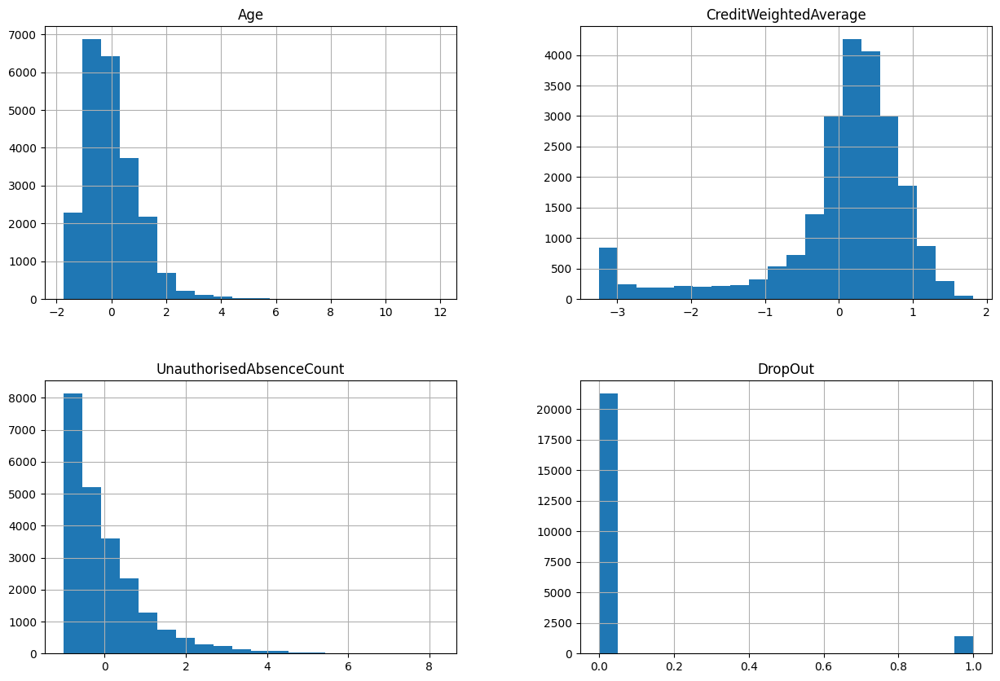

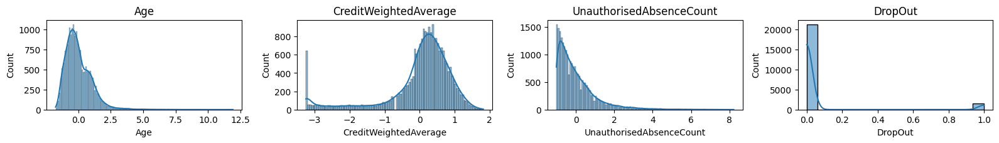

In [42]:
###############
## Data Distributions
###############
import matplotlib.pyplot as plt
import seaborn as sns

# # Histograms
Scaled_numFEdf.hist(bins=20, figsize=(15, 10))
plt.show()

# Visualizing distributions of features
plt.figure(figsize=(20, 10))
for i, col in enumerate(Scaled_numFEdf.columns):
    plt.subplot(5, 5, i+1)
    sns.histplot(Scaled_numFEdf[col], kde=True)
    plt.title(col)
    plt.tight_layout()

The histograms depict right skew for **Age** and **UnauthorisedAbsenceCount**, and left skew for **CreditWeightedAverage**.

Clearly, there is *imbalance* in the data set between the observations with **DropOut** value 0 (**CompletedCourse** = 'Yes', very high) and the ones with **DropOut** value as 1 (**CompletedCourse** = 'No', very low).

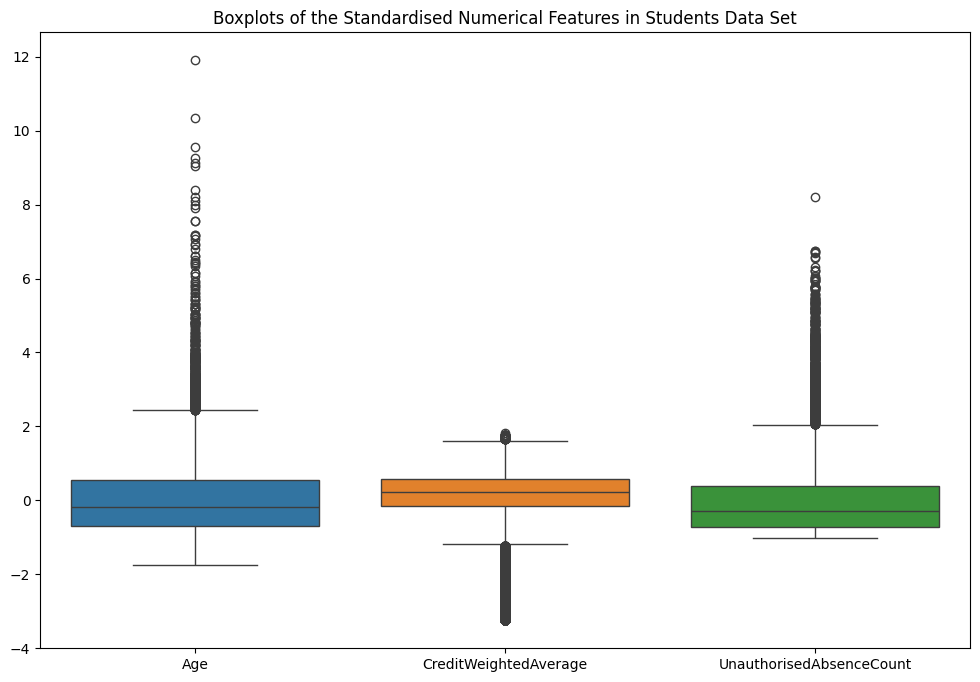

In [43]:
# Check for outliers
plt.figure(figsize=(12, 8))
sns.boxplot(data=Scaled_numFEdf[['Age', 'CreditWeightedAverage',
                                 'UnauthorisedAbsenceCount']])
plt.title('Boxplots of the Standardised Numerical Features in Students Data Set')
plt.show()

The above boxplots depict considerable outliers. The outliers in **Age** show some students of mature age, whereas the outliers in **UnauthorisedAbsenceCount** depict that some student have been absent for unusual amount of time. It would be interesting to see how these features correlate with the **DropOut** feature values.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

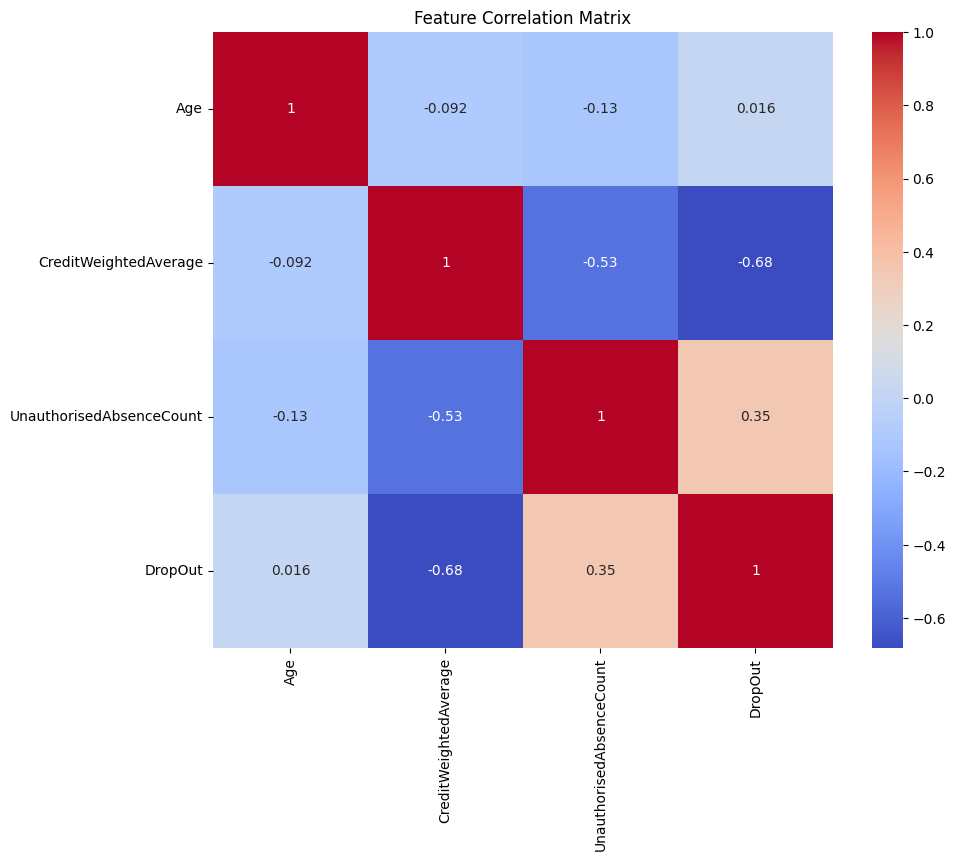

In [45]:
# Correlation analysis
from google.colab import files
plt.figure(figsize=(10, 8))
sns.heatmap(Scaled_numFEdf.corr(), annot=True, cmap='coolwarm')
plt.title('Feature Correlation Matrix')
plt.savefig("heatmap.jpg")
files.download("heatmap.jpg")
plt.show()

The correlation heatmap shows a considerable negative correlation of **CreditWeightedAverage** with **DropOut** and also with **UnauthorisedAbsenceCount**. It is understandable that students with higher credit weighted average will be less probable to drop out. Similarly, a high unauthorised absence count can be expected to result in low credit weighted average. This is supported by a positive correlation between **unauthorisedAbsenceCount** and the **DropOut** variables. However, this correlation is not strong, as there may be other reasons for drop out.

<Figure size 1200x1000 with 0 Axes>

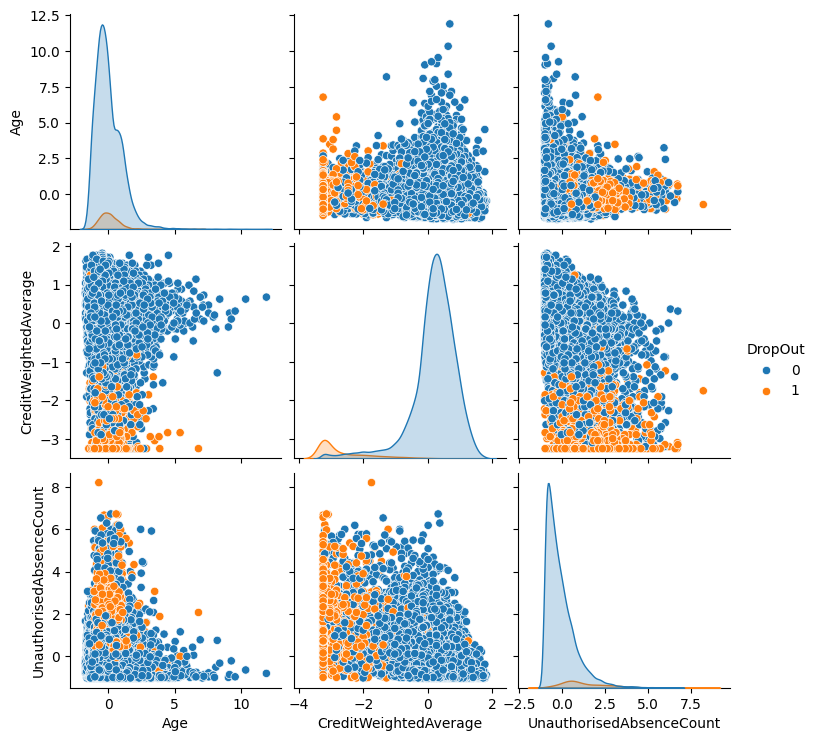

In [46]:
plt.figure(figsize=(12, 10))
sns.pairplot(Scaled_numFEdf, hue='DropOut')
plt.show()

The pairplots with **DropOut** as hue also supports what we have concluded from correlation heatmap. The concentration of **DropOut**s is higher in the region with low **CreditWeightedAverage** score. There are some higher **UnauthoisedAbsenceCount** scores for younger ages for **DropOut**s. The drop-outs are more concentrated for lower **CreditWeightedAverage** scores, for lower and higher **UnauthorisedAbsenceCount** values.

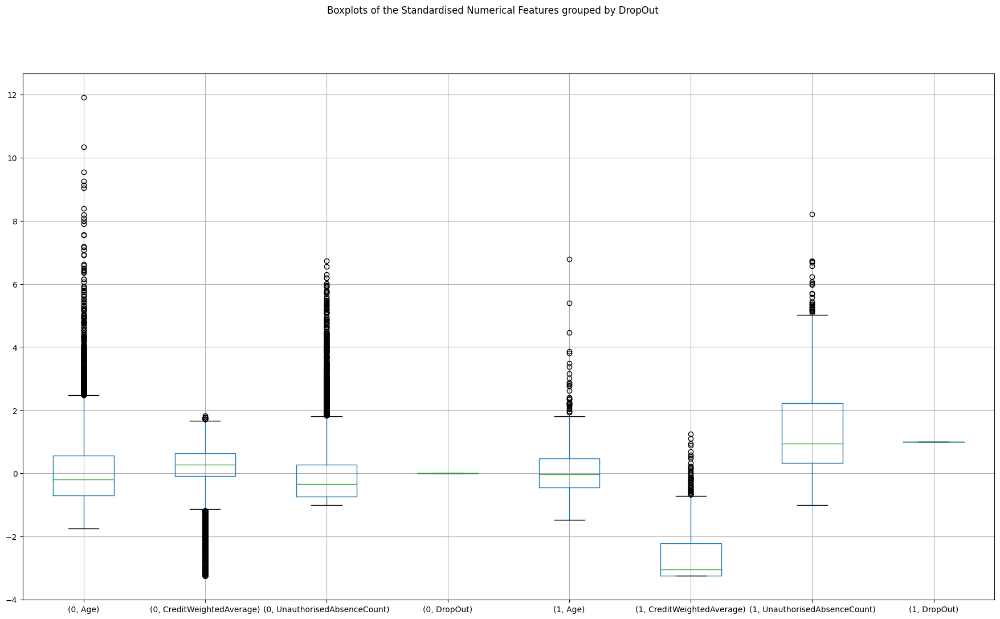

In [47]:
plt.figure(figsize=(22, 12))
Scaled_numFEdf.groupby('DropOut').boxplot(subplots=False)
plt.suptitle('Boxplots of the Standardised Numerical Features grouped by DropOut')
plt.show()

The boxplots of Age, CreditWeightedAverage and UnauthorisedAbsenceCount - grouped by the target variable DropOut depict the same trend as the pairplots with hue as DropOut.

# Defining a Neural Network Model
We now embark upon defining and training a neural network model to obtain the best accuracy for the given data. For this, we'll split data BEFORE standardizing its numerical feature. The advantage is that when we split data, we'll attempt stratifying it to remove the effects of imbalance between the input variables and the target variable **DropOut**. Scaling after splitting will remove the effects that remain within data when we have scaled before splitting. We use the method of Demo 3.3.4 to train_test_split data.

The dataframe FEdf contains all the 25 features including the target feature **DropOut**. Let us first separate the input and output features.

In [38]:
X = FEdf.drop('DropOut', axis=1)
y = FEdf['DropOut']


We allocate $80\%$ of data for training using stratify=y option and random_state=42, and the rest of the $20\%$ data to test the model after it has completed training.

X_test = $0.2 * 22686 = 4538$

Remaining: $22686 - 4538 = 18148$

X-valid = $0.1 * 18149 = 1815$

X_train = $18148 - 1815 = 16333$

We now split and then scale (standardise) the training, test and validation data:

In [39]:
# Standardise the features.
# Convert X into Series data
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y,
                                                    test_size=0.2,
                                                    random_state=42, stratify=y)
X_train, X_valid, y_train, y_valid = train_test_split(X_train_full,
                                                  y_train_full, train_size=0.9)
print(X_train.shape)
print(X_valid.shape)
print(X_test.shape)

# Standardise the data.
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_valid = scaler.transform(X_valid)
X_test = scaler.transform(X_test)

(16333, 67)
(1815, 67)
(4538, 67)


In [40]:
from sklearn import metrics
from sklearn.metrics import accuracy_score, precision_score
from sklearn.metrics import recall_score, f1_score
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
from sklearn.metrics import roc_curve, auc, roc_auc_score
from keras import metrics
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping
from keras.regularizers import l2

# Models with Adam and RMSProp Optimisation without Hyperparameter Tuning

In [41]:
# Define the model architecture.
def create_model(optimizer='adam'):
    model = keras.Sequential([
        layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
        layers.Dropout(0.5),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(1, activation='sigmoid')
    ])
    model.compile(loss='binary_crossentropy',
                  optimizer=optimizer,
                  metrics=['accuracy'])
    return model

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Adam Optimiser:
Accuracy: 0.9689290436315557
Precision: 0.8217391304347826
Recall: 0.6539792387543253
F1 Score: 0.7283236994219653


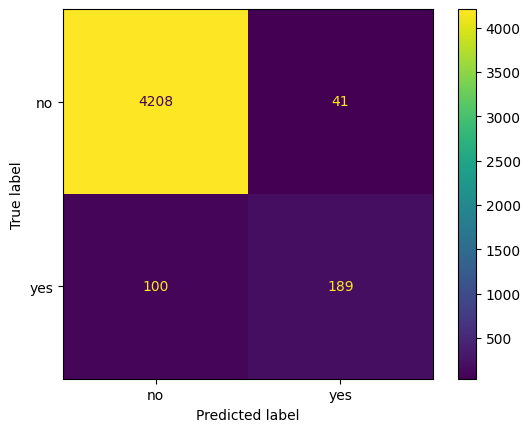

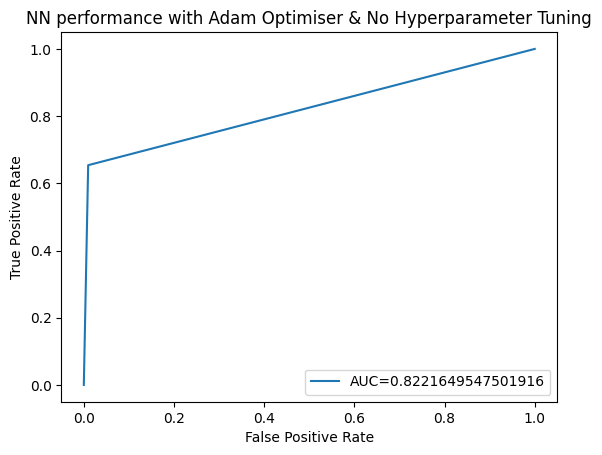

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_9 (Dense)                      │ (None, 64)                  │           4,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,577 (33.50 KB)

 Trainable params: 8,577 (33.50 KB)

 Non-trainable params: 0 (0.00 B)

142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

RMSProp Optimiser:
Accuracy: 0.9722344645218158
Precision: 0.7900355871886121
Recall: 0.7681660899653979
F1 Score: 0.7789473684210526


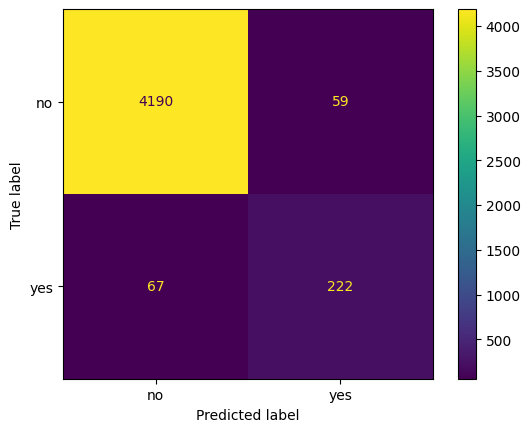

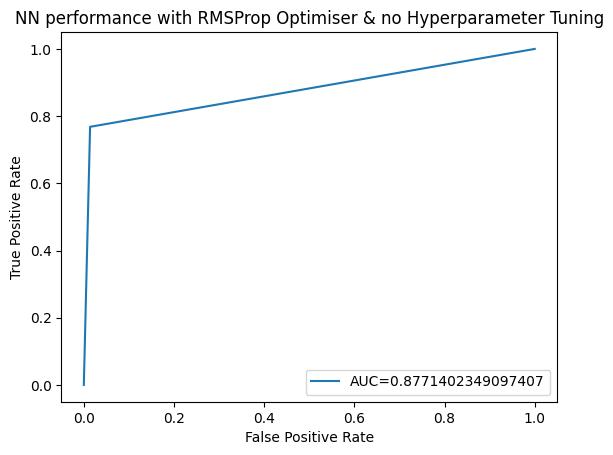

,Optimiser,Accuracy,Precision,Recall,F1 Score
0,Adam,0.968929,0.821739,0.653979,0.728324
1,RMSProp,0.972234,0.790036,0.768166,0.778947


In [43]:
# Train the model with an Adam optimiser.
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
adam_model = create_model(optimizer='adam')
adam_model.summary
adam_history = adam_model.fit(X_train, y_train, epochs=10, batch_size=16,
                              validation_data=(X_valid, y_valid), verbose=0)
y_pred = (adam_model.predict(X_test) > 0.5).astype(int)
adam_accuracy = accuracy_score(y_test, y_pred)
adam_prec = precision_score(y_test, y_pred)
adam_recall = recall_score(y_test, y_pred)
adam_f1 = f1_score(y_test, y_pred)
print('Adam Optimiser:')
print('Accuracy:', adam_accuracy)
print('Precision:', adam_prec)
print('Recall:', adam_recall)
print('F1 Score:', adam_f1)

cm = confusion_matrix(y_test, y_pred)
cfmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["no","yes"])
cfmd.plot()
plt.show()
fpr, tpr, _ = roc_curve(y_test,  y_pred)
auc = roc_auc_score(y_test, y_pred)

#create ROC curve
plt.plot(fpr,tpr, label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title("NN performance with Adam Optimiser & No Hyperparameter Tuning")
plt.legend(loc=4)
plt.show()
# Train the model with an RMSProp optimiser.
rmsprop_model = create_model(optimizer='rmsprop')
rmsprop_model.summary()
rmsprop_history = rmsprop_model.fit(X_train, y_train, epochs=10,
                                    batch_size=16,
                                    validation_data=(X_valid, y_valid),
                                    verbose=0)
y_pred = (rmsprop_model.predict(X_test) > 0.5).astype(int)
rmsprop_accuracy = accuracy_score(y_test, y_pred)
rmsprop_prec = precision_score(y_test, y_pred)
rmsprop_recall = recall_score(y_test, y_pred)
rmsprop_f1 = f1_score(y_test, y_pred)
print('\nRMSProp Optimiser:')
print('Accuracy:', rmsprop_accuracy)
print('Precision:', rmsprop_prec)
print('Recall:', rmsprop_recall)
print('F1 Score:', rmsprop_f1)
cm = confusion_matrix(y_test, y_pred)
cfmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["no","yes"])
cfmd.plot()
plt.show()
fpr, tpr, _ = roc_curve(y_test,  y_pred)
auc = roc_auc_score(y_test, y_pred)

#create ROC curve
plt.plot(fpr,tpr, label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title("NN performance with RMSProp Optimiser & no Hyperparameter Tuning")
plt.legend(loc=4)
plt.show()

# We convert these results into a dataframe
cmdata = {'Optimiser': ['Adam', 'RMSProp'],
          'Accuracy': [adam_accuracy, rmsprop_accuracy],
          'Precision': [adam_prec, rmsprop_prec],
          'Recall': [adam_recall, rmsprop_recall],
          'F1 Score': [adam_f1, rmsprop_f1]}
cmdf = pd.DataFrame(cmdata)
cmdf

In [55]:
cmdf.to_latex()

'\\begin{tabular}{llrrrr}\n\\toprule\n & Optimiser & Accuracy & Precision & Recall & F1 Score \\\\\n\\midrule\n0 & Adam & 0.972234 & 0.802974 & 0.747405 & 0.774194 \\\\\n1 & RMSProp & 0.972014 & 0.804511 & 0.740484 & 0.771171 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [57]:
# Evaluate the models.
adam_test_loss, adam_test_acc = adam_model.evaluate(X_test, y_test, verbose=0)
rmsprop_test_loss, rmsprop_test_acc = rmsprop_model.evaluate(X_test, y_test, verbose=0)

print('Adam optimizer:')
print('Test loss:', adam_test_loss)
print('Test accuracy:', adam_test_acc)

print('\nRMSprop optimizer:')
print('Test loss:', rmsprop_test_loss)
print('Test accuracy:', rmsprop_test_acc)

adam_train_loss, adam_train_acc = adam_model.evaluate(X_train, y_train, verbose=0)
rmsprop_train_loss, rmsprop_train_acc = rmsprop_model.evaluate(X_train, y_train, verbose=0)

print('\nAdam optimizer:')
print('Training loss:', adam_train_loss)
print('Training accuracy:', adam_train_acc)

print('\nRMSprop optimizer:')
print('Training loss:', rmsprop_train_loss)
print('Training accuracy:', rmsprop_train_acc)

adam_valid_loss, adam_valid_acc = adam_model.evaluate(X_valid, y_valid, verbose=0)
rmsprop_valid_loss, rmsprop_valid_acc = rmsprop_model.evaluate(X_valid, y_valid, verbose=0)

print('\nAdam optimizer:')
print('Validation loss:', adam_valid_loss)
print('Validation accuracy:', adam_valid_acc)

print('\nRMSprop optimizer:')
print('Validation loss:', rmsprop_valid_loss)
print('Validation accuracy:', rmsprop_valid_acc)

Adam optimizer:
Test loss: 0.06886564940214157
Test accuracy: 0.9722344875335693

RMSprop optimizer:
Test loss: 0.08570773154497147
Test accuracy: 0.9720141291618347

Adam optimizer:
Training loss: 0.06745078414678574
Training accuracy: 0.9739178419113159

RMSprop optimizer:
Training loss: 0.08209358900785446
Training accuracy: 0.9742239713668823

Adam optimizer:
Validation loss: 0.08622514456510544
Validation accuracy: 0.9641873240470886

RMSprop optimizer:
Validation loss: 0.11595642566680908
Validation accuracy: 0.9641873240470886


The RMSProp optimiser's accuracy is slightly higher than Adam's. However, the loss for RMSProp is greater than that of Adam.

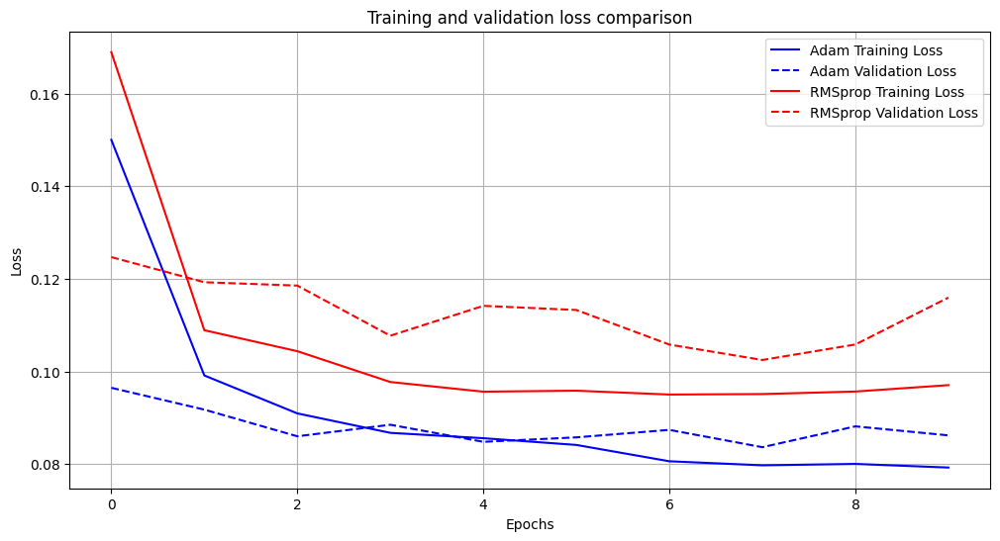

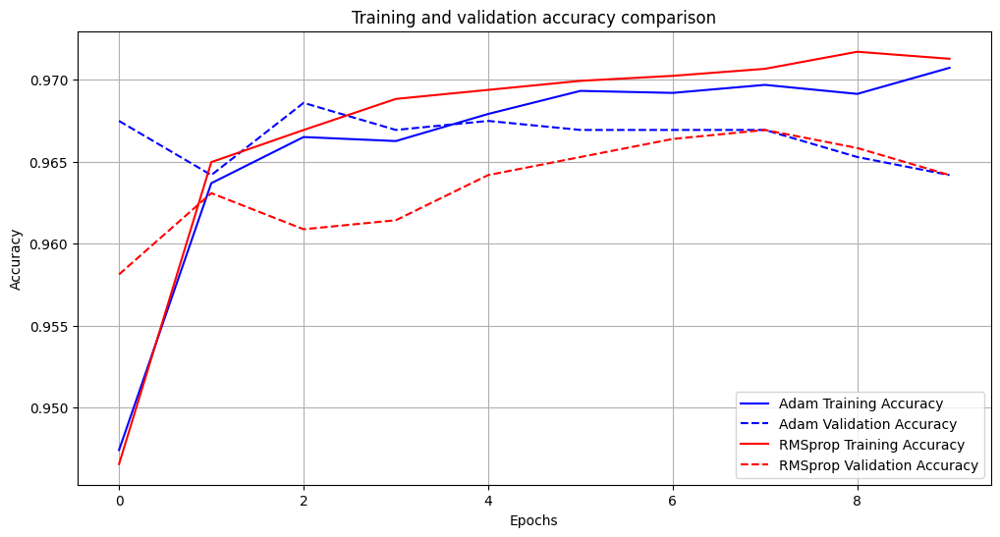

In [58]:
# Import Matplotlib for visualisation.
import matplotlib.pyplot as plt

# Plot loss
plt.figure(figsize=(12, 6))
plt.plot(adam_history.history['loss'], label='Adam Training Loss', color='blue')
plt.plot(adam_history.history['val_loss'], label='Adam Validation Loss', color='blue', linestyle='--')
plt.plot(rmsprop_history.history['loss'], label='RMSprop Training Loss', color='red')
plt.plot(rmsprop_history.history['val_loss'], label='RMSprop Validation Loss', color='red', linestyle='--')
plt.title('Training and validation loss comparison')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Plot accuracy.
plt.figure(figsize=(12, 6))
plt.plot(adam_history.history['accuracy'], label='Adam Training Accuracy', color='blue')
plt.plot(adam_history.history['val_accuracy'], label='Adam Validation Accuracy', color='blue', linestyle='--')
plt.plot(rmsprop_history.history['accuracy'], label='RMSprop Training Accuracy', color='red')
plt.plot(rmsprop_history.history['val_accuracy'], label='RMSprop Validation Accuracy', color='red', linestyle='--')
plt.title('Training and validation accuracy comparison')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

Validation losses for both Adam and RMSProp remain lower than training losses. However, validation accuracies have been higher than training accuracies.

# Model with Adam Optimisation, various configurations and Early Stopping Criterion

In [60]:
# Define neural network models of different complexities.
def create_model3(optimiser='Adam', num_hidden_layers=1, num_neurons=64,
                  regularization=None):
    model = Sequential()
    model.add(Dense(64, activation='relu', input_shape=(X_train.shape[1],),
              kernel_regularizer=l2(regularization) if regularization else None))
    for _ in range(num_hidden_layers):
        model.add(Dense(num_neurons, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer=optimiser,
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    return model

# Define model configurations.
adam_model_configs = [
    {"optimiser":'Adam', "num_hidden_layers":1, "num_neurons": 1, "regularization":0.005},
    {"optimiser":'Adam', "num_hidden_layers":1, "num_neurons": 1, "regularization":0.01},
    {"optimiser":'Adam', "num_hidden_layers":1, "num_neurons": 1, "regularization":0.05},
    {"optimiser":'Adam', "num_hidden_layers":1, "num_neurons": 32, "regularization":0.005},
    {"optimiser":'Adam', "num_hidden_layers":1, "num_neurons": 32, "regularization":0.01},
    {"optimiser":'Adam', "num_hidden_layers":1, "num_neurons": 32, "regularization":0.05},
    {"optimiser":'Adam', "num_hidden_layers":2, "num_neurons": 64, "regularization":0.005},
    {"optimiser":'Adam', "num_hidden_layers":2, "num_neurons": 64, "regularization":0.01},
    {"optimiser":'Adam', "num_hidden_layers":2, "num_neurons": 64, "regularization":0.05},
    {"optimiser":'Adam', "num_hidden_layers":3, "num_neurons": 128, "regularization":0.005},
    {"optimiser":'Adam', "num_hidden_layers":3, "num_neurons": 128, "regularization":0.01},
    {"optimiser":'Adam', "num_hidden_layers":3, "num_neurons": 128, "regularization":0.05}
]

{'optimiser': 'Adam', 'num_hidden_layers': 1, 'num_neurons': 1, 'regularization': 0.005}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9376 - loss: 0.5600 - val_accuracy: 0.9364 - val_loss: 0.1343
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9344 - loss: 0.1275 - val_accuracy: 0.9364 - val_loss: 0.1019
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9343 - loss: 0.1064 - val_accuracy: 0.9761 - val_loss: 0.0939
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9707 - loss: 0.0997 - val_accuracy: 0.9774 - val_loss: 0.0912
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9644 - loss: 0.1057 - val_accuracy: 0.9755 - val_loss: 0.0918
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9722 - loss: 0.0924
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9721 - loss: 0.0914
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


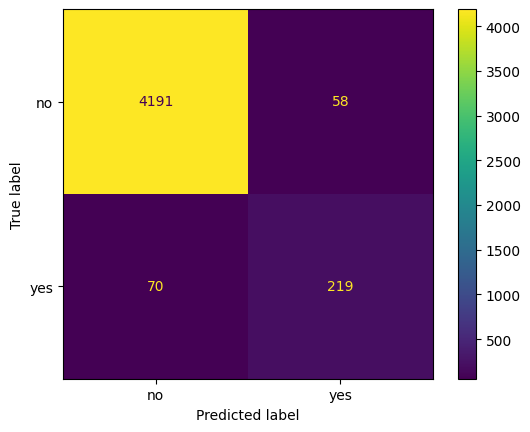

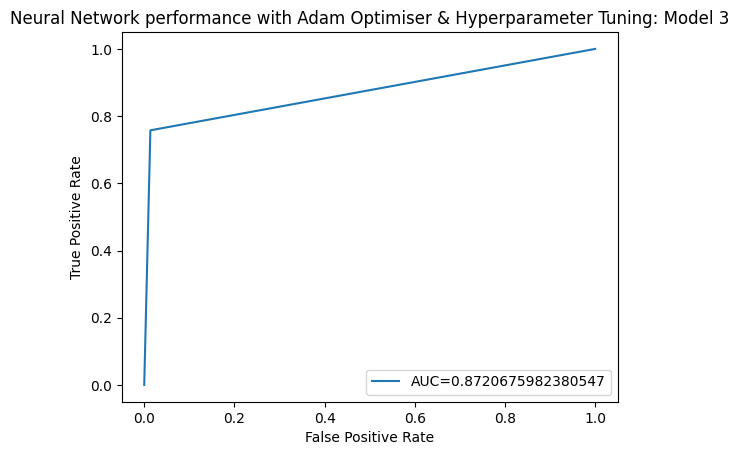

{'optimiser': 'Adam', 'num_hidden_layers': 1, 'num_neurons': 1, 'regularization': 0.01}
Epoch 1/50


<ipython-input-61-5d8b5c16c70c>:42: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  adam_cmdf = pd.concat([adam_cmdf, pd.DataFrame([new_row])])
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8068 - loss: 0.8890 - val_accuracy: 0.9364 - val_loss: 0.5294
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9371 - loss: 0.4988 - val_accuracy: 0.9364 - val_loss: 0.4218
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9369 - loss: 0.4017 - val_accuracy: 0.9364 - val_loss: 0.3527
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9380 - loss: 0.3381 - val_accuracy: 0.9364 - val_loss: 0.3086
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9349 - loss: 0.3029 - val_accuracy: 0.9364 - val_loss: 0.2803
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9328 - loss: 0.2813 - val_accuracy: 0.9364 - val_loss: 0.2624
Epoch 7/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9334 - loss: 0.2649 - val_accuracy: 0.9364 - val_loss: 0.2513
Epoch 8/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9368 - loss: 0.2484 - val_accuracy: 0.9364 - val_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


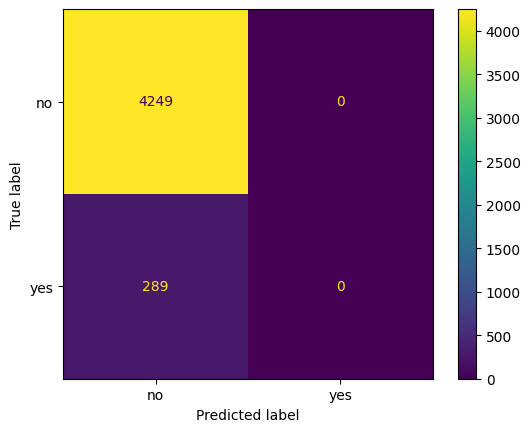

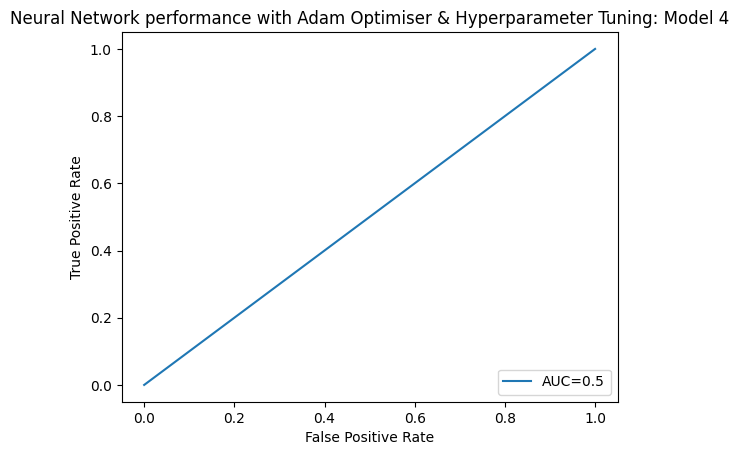

{'optimiser': 'Adam', 'num_hidden_layers': 1, 'num_neurons': 1, 'regularization': 0.05}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9378 - loss: 1.5188 - val_accuracy: 0.9364 - val_loss: 0.1178
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9389 - loss: 0.1170 - val_accuracy: 0.9364 - val_loss: 0.1130
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9510 - loss: 0.1156 - val_accuracy: 0.9694 - val_loss: 0.1087
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9656 - loss: 0.1109 - val_accuracy: 0.9718 - val_loss: 0.1022
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9682 - loss: 0.1086 - val_accuracy: 0.9725 - val_loss: 0.1019
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9691 - loss: 0.1023 - val_accuracy: 0.9682 - val_loss: 0.1084
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9702 - loss: 0.1031
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9706 - loss: 0.0996
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


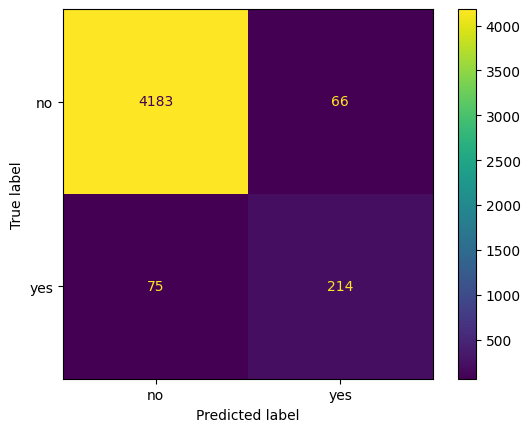

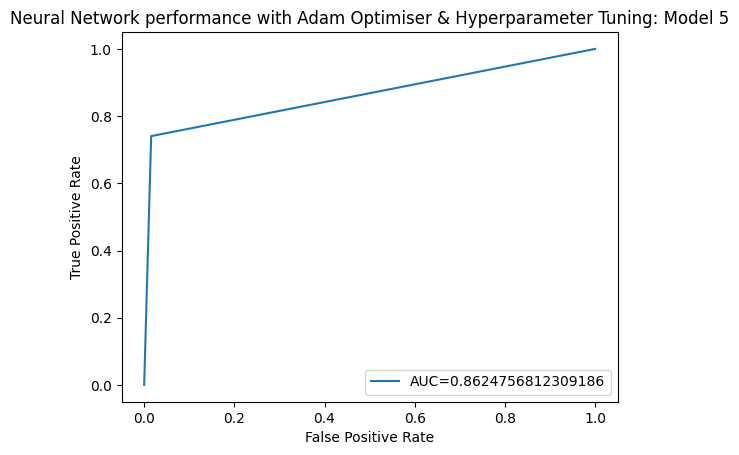

{'optimiser': 'Adam', 'num_hidden_layers': 1, 'num_neurons': 32, 'regularization': 0.005}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9370 - loss: 0.3901 - val_accuracy: 0.9755 - val_loss: 0.1169
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9692 - loss: 0.1143 - val_accuracy: 0.9767 - val_loss: 0.0952
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9685 - loss: 0.0997 - val_accuracy: 0.9761 - val_loss: 0.0847
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9704 - loss: 0.0900 - val_accuracy: 0.9774 - val_loss: 0.0761
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9682 - loss: 0.0854 - val_accuracy: 0.9761 - val_loss: 0.0760
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9727 - loss: 0.0838 - val_accuracy: 0.9767 - val_loss: 0.0733
Epoch 7/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9726 - loss: 0.0805 - val_accuracy: 0.9774 - val_loss: 0.0716
Epoch 8/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9737 - loss: 0.0799 - val_accuracy: 0.9786 - val_

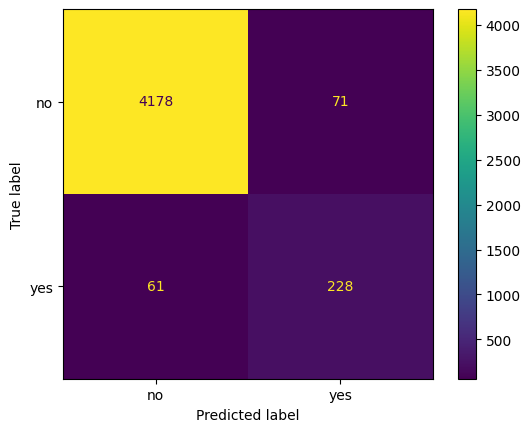

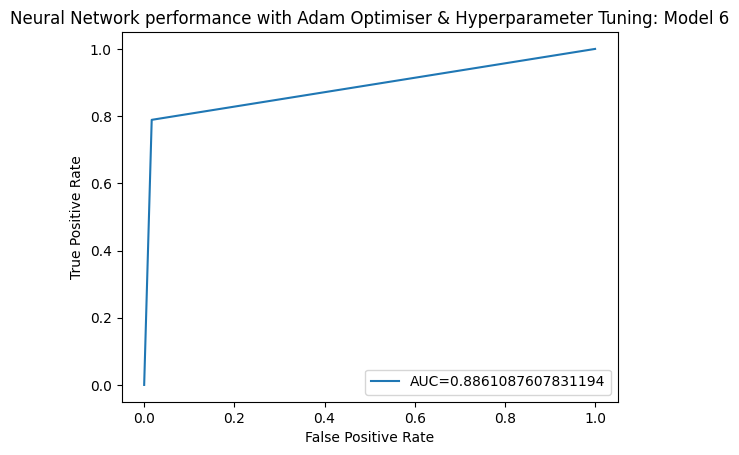

{'optimiser': 'Adam', 'num_hidden_layers': 1, 'num_neurons': 32, 'regularization': 0.01}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9044 - loss: 0.5579 - val_accuracy: 0.9749 - val_loss: 0.1087
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9691 - loss: 0.1116 - val_accuracy: 0.9755 - val_loss: 0.0842
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9710 - loss: 0.0909 - val_accuracy: 0.9780 - val_loss: 0.0778
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9682 - loss: 0.0921 - val_accuracy: 0.9737 - val_loss: 0.0754
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9693 - loss: 0.0886 - val_accuracy: 0.9761 - val_loss: 0.0742
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9707 - loss: 0.0865 - val_accuracy: 0.9743 - val_loss: 0.0753
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9731 - loss: 0.0774
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9711 - loss: 0.0816
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


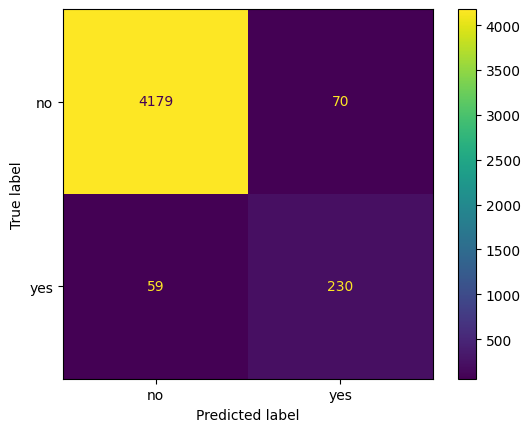

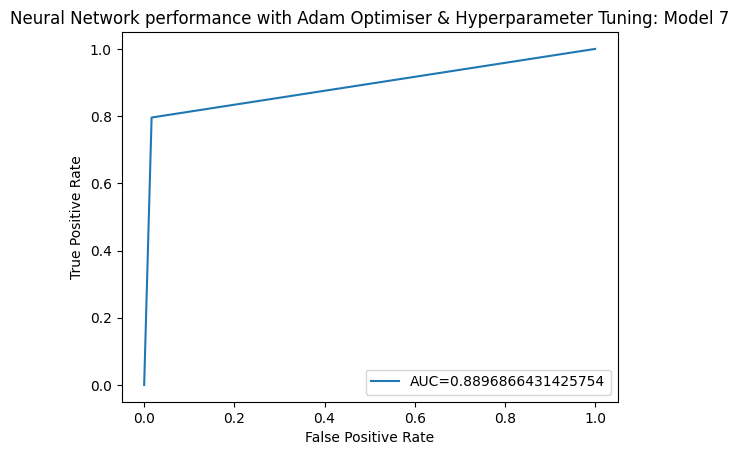

{'optimiser': 'Adam', 'num_hidden_layers': 1, 'num_neurons': 32, 'regularization': 0.05}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8336 - loss: 1.6520 - val_accuracy: 0.9731 - val_loss: 0.0960
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9663 - loss: 0.1037 - val_accuracy: 0.9688 - val_loss: 0.0985
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9710 - loss: 0.1026
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9697 - loss: 0.1000
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


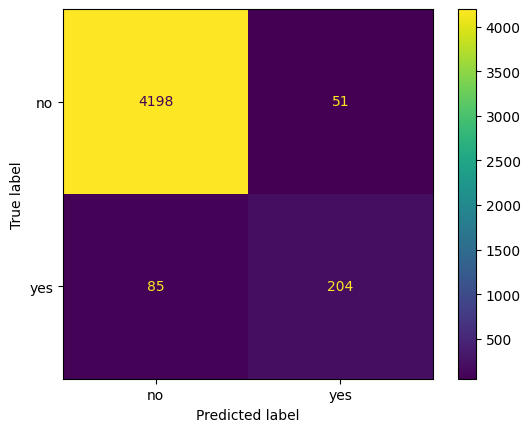

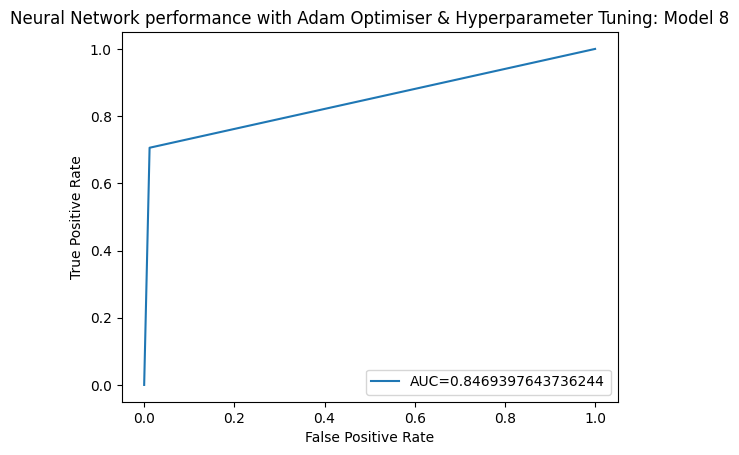

{'optimiser': 'Adam', 'num_hidden_layers': 2, 'num_neurons': 64, 'regularization': 0.005}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9473 - loss: 0.3487 - val_accuracy: 0.9749 - val_loss: 0.1158
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9678 - loss: 0.1210 - val_accuracy: 0.9767 - val_loss: 0.0883
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9687 - loss: 0.0989 - val_accuracy: 0.9706 - val_loss: 0.0864
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9670 - loss: 0.1000 - val_accuracy: 0.9767 - val_loss: 0.0727
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9709 - loss: 0.0884 - val_accuracy: 0.9767 - val_loss: 0.0769
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9735 - loss: 0.0800
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9713 - loss: 0.0814
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


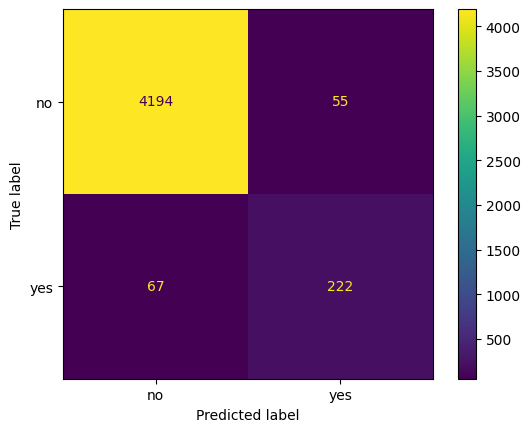

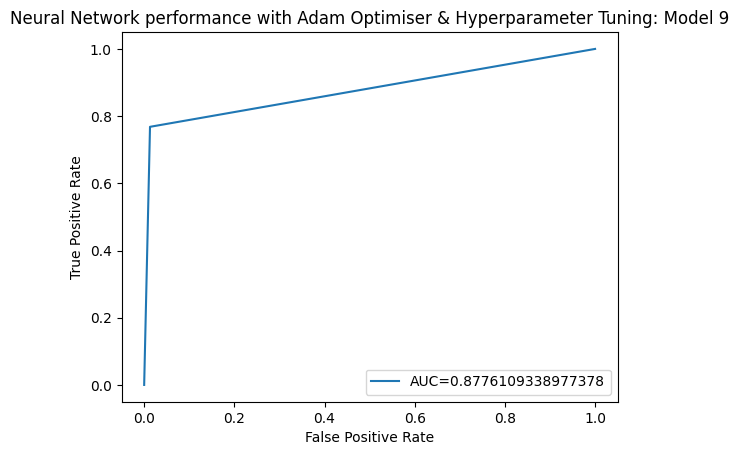

{'optimiser': 'Adam', 'num_hidden_layers': 2, 'num_neurons': 64, 'regularization': 0.01}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.9240 - loss: 0.5016 - val_accuracy: 0.9755 - val_loss: 0.1105
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9669 - loss: 0.1167 - val_accuracy: 0.9749 - val_loss: 0.0842
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9683 - loss: 0.1010 - val_accuracy: 0.9737 - val_loss: 0.0817
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9725 - loss: 0.0875 - val_accuracy: 0.9774 - val_loss: 0.0784
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9695 - loss: 0.0898 - val_accuracy: 0.9780 - val_loss: 0.0765
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9718 - loss: 0.0819 - val_accuracy: 0.9755 - val_loss: 0.0754
Epoch 7/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9724 - loss: 0.0769 - val_accuracy: 0.9780 - val_loss: 0.0786
511/511 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9710 - loss: 0.0813
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

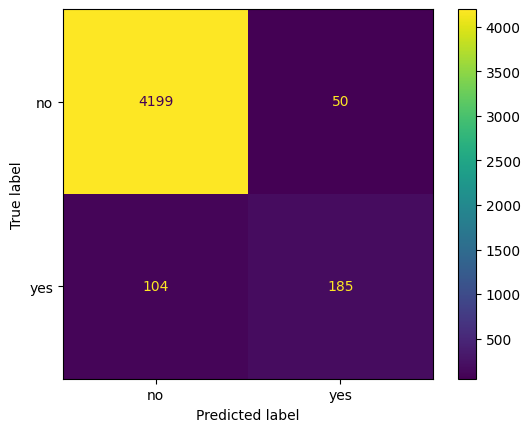

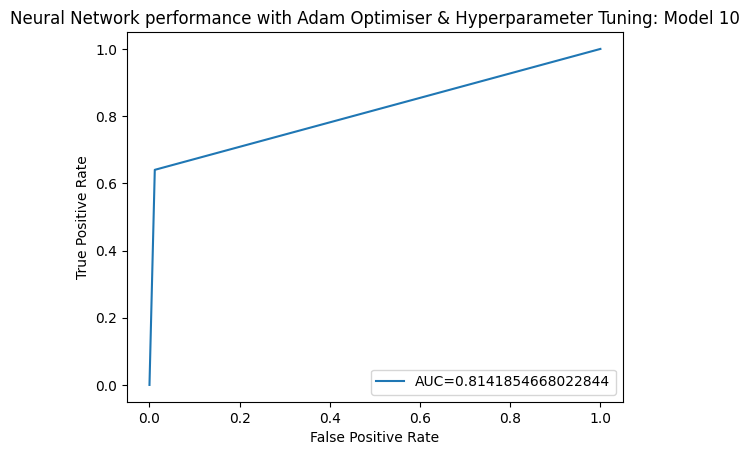

{'optimiser': 'Adam', 'num_hidden_layers': 2, 'num_neurons': 64, 'regularization': 0.05}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9435 - loss: 1.4116 - val_accuracy: 0.9700 - val_loss: 0.1037
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9656 - loss: 0.1064 - val_accuracy: 0.9676 - val_loss: 0.0866
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9667 - loss: 0.0986 - val_accuracy: 0.9743 - val_loss: 0.0819
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9698 - loss: 0.0918 - val_accuracy: 0.9725 - val_loss: 0.0812
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9674 - loss: 0.0916 - val_accuracy: 0.9761 - val_loss: 0.0753
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9685 - loss: 0.0896 - val_accuracy: 0.9700 - val_loss: 0.0871
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9706 - loss: 0.0877
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9688 - loss: 0.0867
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


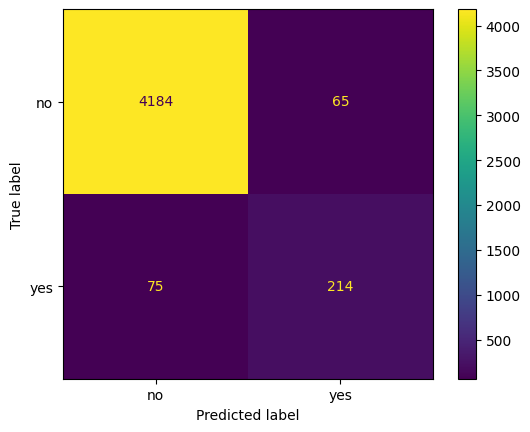

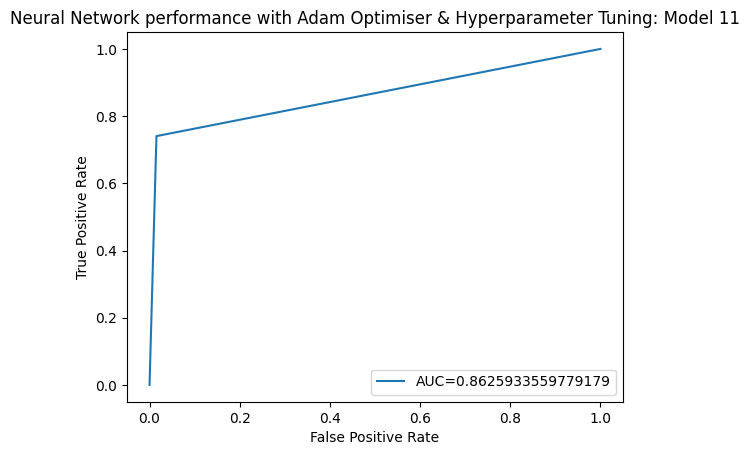

{'optimiser': 'Adam', 'num_hidden_layers': 3, 'num_neurons': 128, 'regularization': 0.005}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.9430 - loss: 0.3347 - val_accuracy: 0.9712 - val_loss: 0.1212
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9674 - loss: 0.1224 - val_accuracy: 0.9761 - val_loss: 0.0925
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9726 - loss: 0.0958 - val_accuracy: 0.9755 - val_loss: 0.0815
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9715 - loss: 0.0946 - val_accuracy: 0.9737 - val_loss: 0.0809
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9703 - loss: 0.0903 - val_accuracy: 0.9718 - val_loss: 0.0794
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9714 - loss: 0.0842 - val_accuracy: 0.9767 - val_loss: 0.0765
Epoch 7/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9715 - loss: 0.0820 - val_accuracy: 0.9743 - val_loss: 0.0733
Epoch 8/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9727 - loss: 0.0779 - val_accuracy: 0.9737 - val_

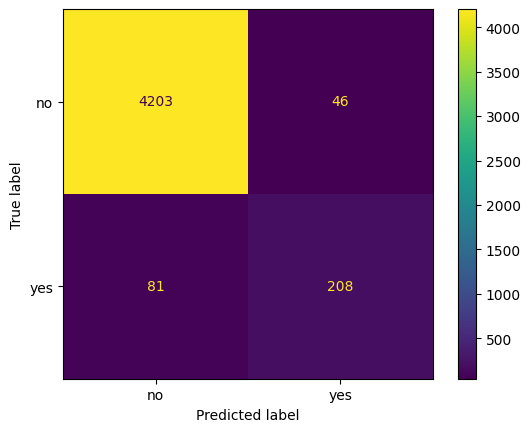

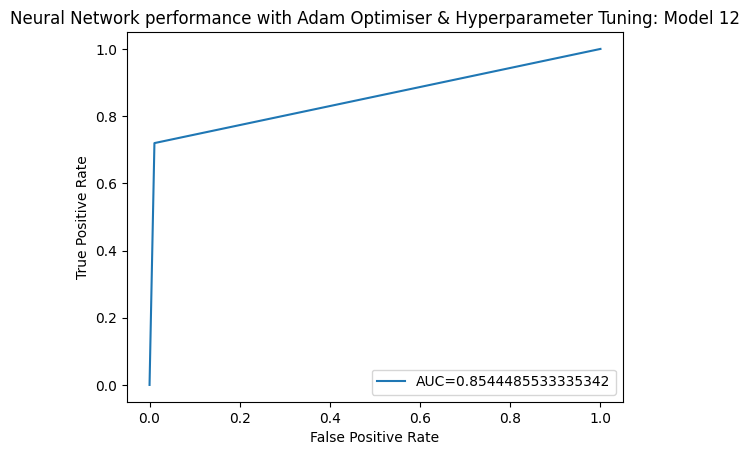

{'optimiser': 'Adam', 'num_hidden_layers': 3, 'num_neurons': 128, 'regularization': 0.01}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9402 - loss: 0.4536 - val_accuracy: 0.9676 - val_loss: 0.1351
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9691 - loss: 0.1155 - val_accuracy: 0.9755 - val_loss: 0.0920
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9700 - loss: 0.1005 - val_accuracy: 0.9755 - val_loss: 0.0878
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9722 - loss: 0.0904 - val_accuracy: 0.9731 - val_loss: 0.0838
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9715 - loss: 0.0855 - val_accuracy: 0.9718 - val_loss: 0.0769
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9716 - loss: 0.0803 - val_accuracy: 0.9755 - val_loss: 0.0762
Epoch 7/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9689 - loss: 0.0846 - val_accuracy: 0.9786 - val_loss: 0.0699
Epoch 8/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9722 - loss: 0.0812 - val_accuracy: 0.9737 - val_

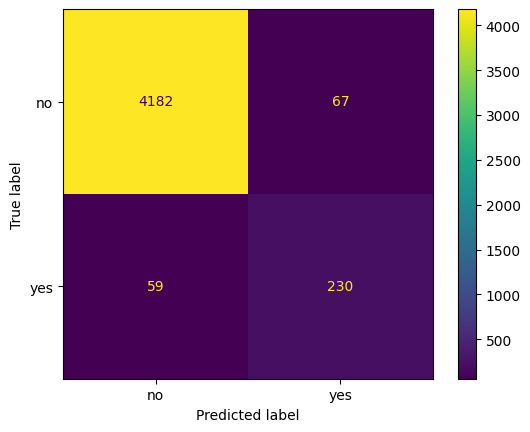

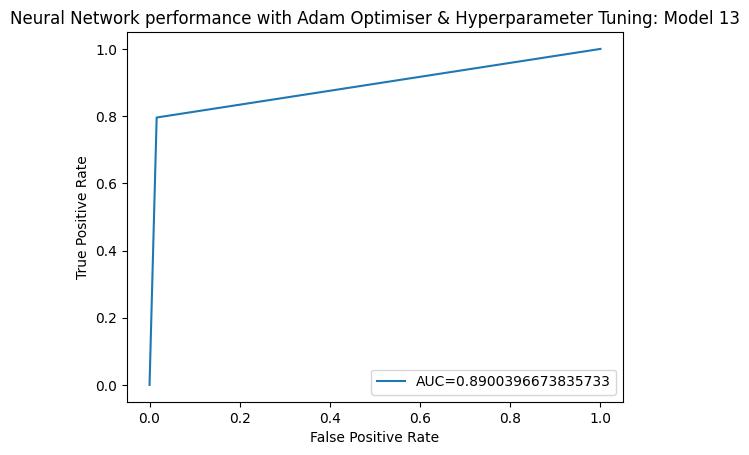

{'optimiser': 'Adam', 'num_hidden_layers': 3, 'num_neurons': 128, 'regularization': 0.05}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9397 - loss: 1.4250 - val_accuracy: 0.9682 - val_loss: 0.1165
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9672 - loss: 0.1112 - val_accuracy: 0.9718 - val_loss: 0.0869
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9697 - loss: 0.0920 - val_accuracy: 0.9749 - val_loss: 0.0836
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9703 - loss: 0.0887 - val_accuracy: 0.9731 - val_loss: 0.0818
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9726 - loss: 0.0863 - val_accuracy: 0.9749 - val_loss: 0.0763
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9718 - loss: 0.0854 - val_accuracy: 0.9749 - val_loss: 0.0806
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9700 - loss: 0.0824
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9715 - loss: 0.0838
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


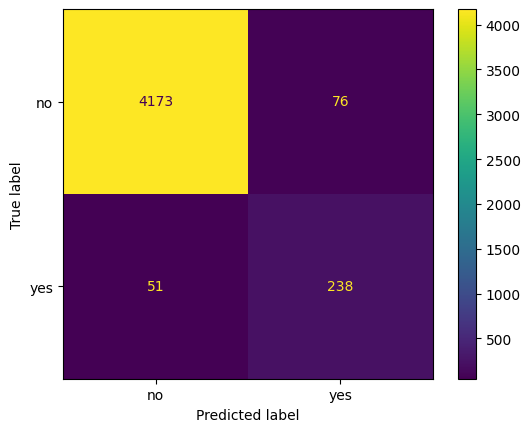

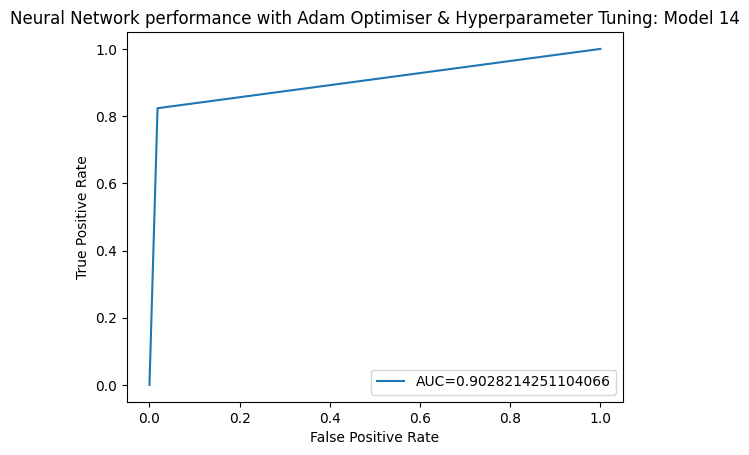

In [61]:
adam_cmdf = pd.DataFrame(columns=['Optimiser', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])
# Train and evaluate each model.
adam_results = []
count = 3
for config in adam_model_configs:
    print(config)
    model1 = create_model3(**config)
    early_stopping_callback = EarlyStopping(monitor='val_loss', patience=1,
                                            restore_best_weights=True)
    history = model1.fit(X_train, y_train, epochs=50, batch_size=32,
                        validation_split=0.1,  verbose=1,
                        callbacks=[early_stopping_callback])
    train_loss, train_accuracy = model1.evaluate(X_train, y_train, verbose=1)
    test_loss, test_accuracy = model1.evaluate(X_test, y_test, verbose=1)

    y_pred = (model1.predict(X_test) > 0.5).astype(int)
    adam_accuracy = accuracy_score(y_test, y_pred)
    adam_prec = precision_score(y_test, y_pred)
    adam_recall = recall_score(y_test, y_pred)
    adam_f1 = f1_score(y_test, y_pred)
    # Display confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    cfmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["no","yes"])
    cfmd.plot()
    plt.show()
    fpr, tpr, _ = roc_curve(y_test,  y_pred)
    auc = roc_auc_score(y_test, y_pred)

    #create ROC curve
    plt.plot(fpr,tpr, label="AUC="+str(auc))
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.title("Neural Network performance with Adam Optimiser & Hyperparameter Tuning: Model "+str(count))
    plt.legend(loc=4)
    plt.show()

    new_row = {'Optimiser': 'Adam',
               'Accuracy': adam_accuracy,
               'Precision': adam_prec,
               'Recall': adam_recall,
               'F1 Score': adam_f1}
    adam_cmdf = pd.concat([adam_cmdf, pd.DataFrame([new_row])])
    adam_cmdf = adam_cmdf.reset_index(drop=True)
    adam_results.append({
        "config": config,
        "train_loss": train_loss,
        "train_accuracy": train_accuracy,
        "test_loss": test_loss,
        "test_accuracy": test_accuracy,
        "history": history
    })
    count += 1

In [62]:
adam_cmdf.head(15)

,Optimiser,Accuracy,Precision,Recall,F1 Score
0,Adam,0.971794,0.790614,0.757785,0.773852
1,Adam,0.936316,0.000000,0.000000,0.000000
2,Adam,0.968929,0.764286,0.740484,0.752197
3,Adam,0.970912,0.762542,0.788927,0.775510
4,Adam,0.971573,0.766667,0.795848,0.780985
5,Adam,0.970031,0.800000,0.705882,0.750000
6,Adam,0.973116,0.801444,0.768166,0.784452
7,Adam,0.966064,0.787234,0.640138,0.706107
8,Adam,0.969149,0.767025,0.740484,0.753521
9,Adam,0.972014,0.818898,0.719723,0.766114


In [65]:
adam_cmdf.to_latex()

'\\begin{tabular}{llrrrr}\n\\toprule\n & Optimiser & Accuracy & Precision & Recall & F1 Score \\\\\n\\midrule\n0 & Adam & 0.971794 & 0.790614 & 0.757785 & 0.773852 \\\\\n1 & Adam & 0.936316 & 0.000000 & 0.000000 & 0.000000 \\\\\n2 & Adam & 0.968929 & 0.764286 & 0.740484 & 0.752197 \\\\\n3 & Adam & 0.970912 & 0.762542 & 0.788927 & 0.775510 \\\\\n4 & Adam & 0.971573 & 0.766667 & 0.795848 & 0.780985 \\\\\n5 & Adam & 0.970031 & 0.800000 & 0.705882 & 0.750000 \\\\\n6 & Adam & 0.973116 & 0.801444 & 0.768166 & 0.784452 \\\\\n7 & Adam & 0.966064 & 0.787234 & 0.640138 & 0.706107 \\\\\n8 & Adam & 0.969149 & 0.767025 & 0.740484 & 0.753521 \\\\\n9 & Adam & 0.972014 & 0.818898 & 0.719723 & 0.766114 \\\\\n10 & Adam & 0.972234 & 0.774411 & 0.795848 & 0.784983 \\\\\n11 & Adam & 0.972014 & 0.757962 & 0.823529 & 0.789386 \\\\\n\\bottomrule\n\\end{tabular}\n'

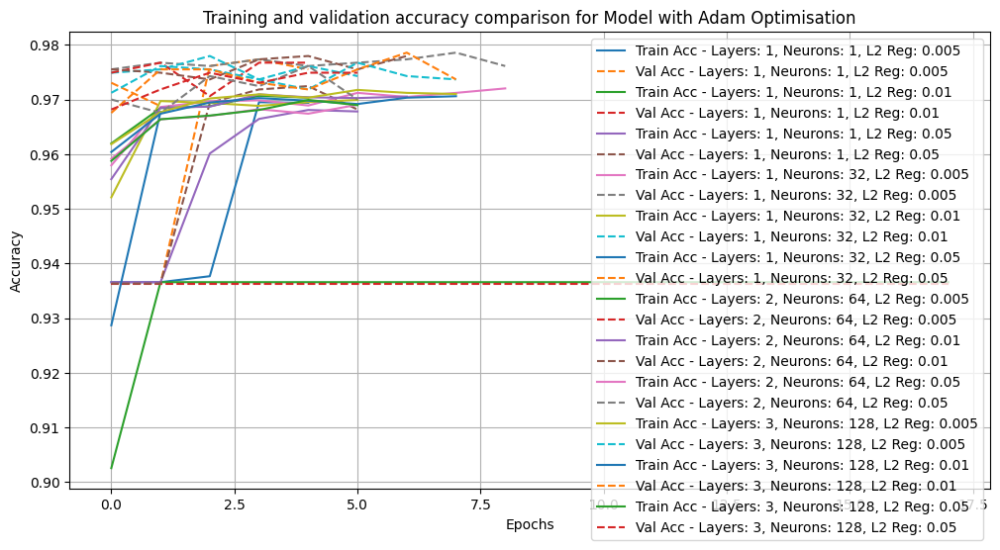

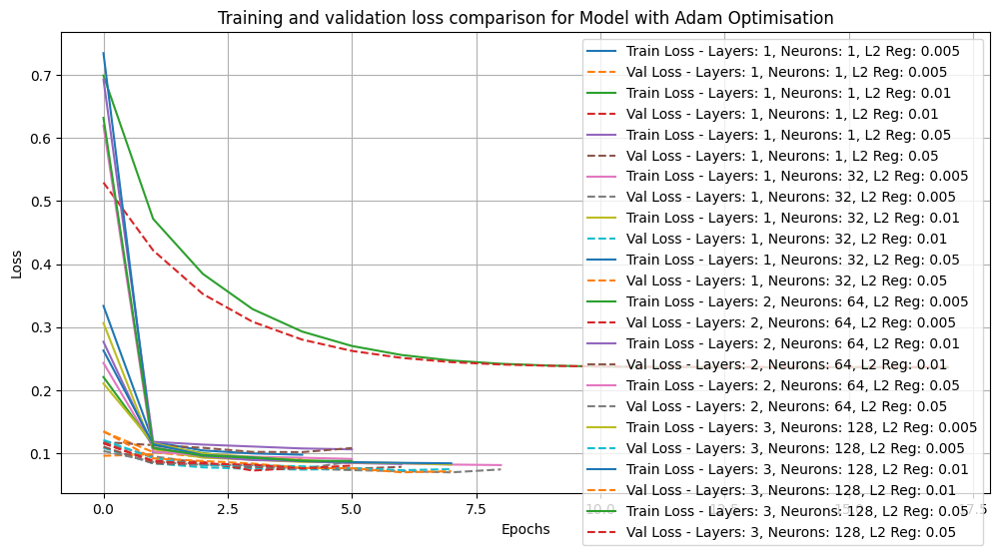

In [64]:
# Plot train/validation accuracy.
import google.colab.files as files
plt.figure(figsize=(12, 6))
for result in adam_results:
    config_str = f"Layers: {result['config']['num_hidden_layers']}, Neurons: {result['config']['num_neurons']}, L2 Reg: {result['config']['regularization']}"
    plt.plot(result['history'].history['accuracy'], label=f"Train Acc - {config_str}")
    plt.plot(result['history'].history['val_accuracy'], linestyle='--', label=f"Val Acc - {config_str}")
plt.title('Training and validation accuracy comparison for Model with Adam Optimisation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()
#plt.savefig("AdamAcc_multiconfigs_hype.jpg")
#files.download("AdamAcc_multiconfigs_hype.jpg")

# Plot train/validation loss.
plt.figure(figsize=(12, 6))
for result in adam_results:
    config_str = f"Layers: {result['config']['num_hidden_layers']}, Neurons: {result['config']['num_neurons']}, L2 Reg: {result['config']['regularization']}"
    plt.plot(result['history'].history['loss'], label=f"Train Loss - {config_str}")
    plt.plot(result['history'].history['val_loss'], linestyle='--', label=f"Val Loss - {config_str}")
plt.title('Training and validation loss comparison for Model with Adam Optimisation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()
#plt.savefig("AdamLoss_multiconfigs_hype.jpg")
#files.download("AdamLoss_multiconfigs_hype.jpg")

# Model with RMSProp Optimisation, various configurations and Early Stopping Criterion

{'optimiser': 'RMSProp', 'num_hidden_layers': 1, 'num_neurons': 1, 'regularization': 0.005}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8586 - loss: 0.8162 - val_accuracy: 0.9694 - val_loss: 0.5069
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9709 - loss: 0.4692 - val_accuracy: 0.9749 - val_loss: 0.3628
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9685 - loss: 0.3407 - val_accuracy: 0.9767 - val_loss: 0.2633
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9717 - loss: 0.2468 - val_accuracy: 0.9718 - val_loss: 0.1974
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9719 - loss: 0.1877 - val_accuracy: 0.9749 - val_loss: 0.1493
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9702 - loss: 0.1546 - val_accuracy: 0.9761 - val_loss: 0.1238
Epoch 7/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9702 - loss: 0.1273 - val_accuracy: 0.9749 - val_loss: 0.1075
Epoch 8/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9696 - loss: 0.1127 - val_accuracy: 0.9755 - val_

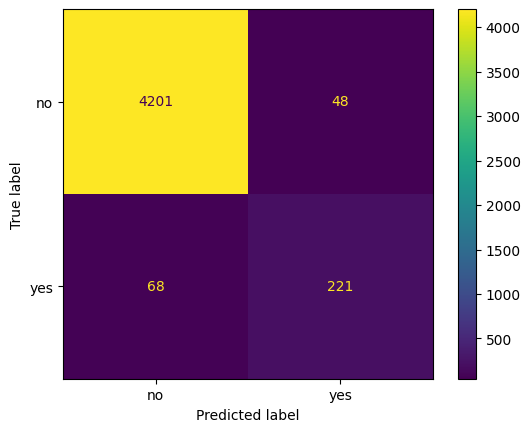

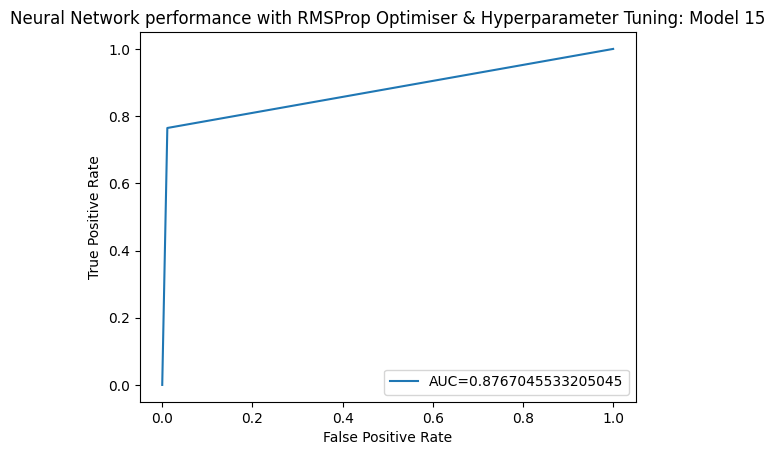

{'optimiser': 'RMSProp', 'num_hidden_layers': 1, 'num_neurons': 1, 'regularization': 0.01}
Epoch 1/50


<ipython-input-66-c54ee8d2879a>:57: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  rmsprop_cmdf = pd.concat([rmsprop_cmdf, pd.DataFrame([new_row])])
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9354 - loss: 0.5371 - val_accuracy: 0.9364 - val_loss: 0.1301
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9532 - loss: 0.1195 - val_accuracy: 0.9767 - val_loss: 0.1019
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9710 - loss: 0.1030 - val_accuracy: 0.9731 - val_loss: 0.1006
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9693 - loss: 0.1082 - val_accuracy: 0.9755 - val_loss: 0.0957
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9693 - loss: 0.1041 - val_accuracy: 0.9780 - val_loss: 0.0942
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9688 - loss: 0.1079 - val_accuracy: 0.9755 - val_loss: 0.0953
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9713 - loss: 0.0993
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9724 - loss: 0.0966
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


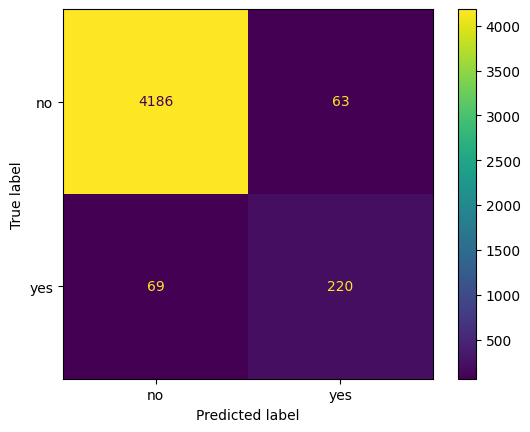

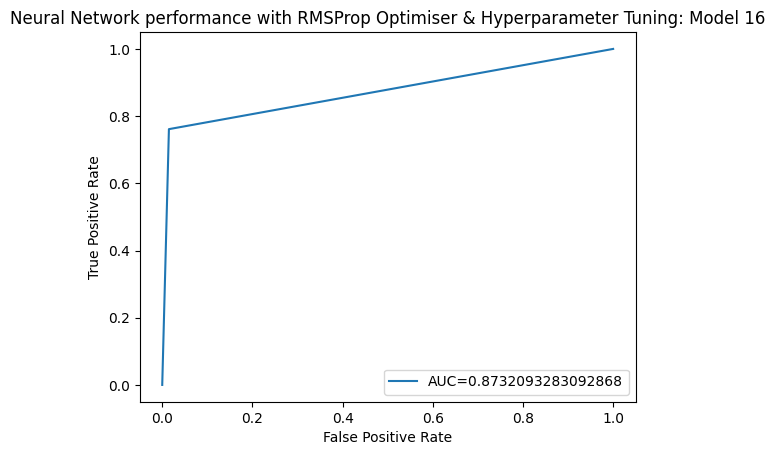

{'optimiser': 'RMSProp', 'num_hidden_layers': 1, 'num_neurons': 1, 'regularization': 0.05}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9399 - loss: 1.3210 - val_accuracy: 0.9364 - val_loss: 0.1121
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9588 - loss: 0.1127 - val_accuracy: 0.9725 - val_loss: 0.1000
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9664 - loss: 0.1126 - val_accuracy: 0.9694 - val_loss: 0.1015
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9706 - loss: 0.1018
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9700 - loss: 0.0972
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


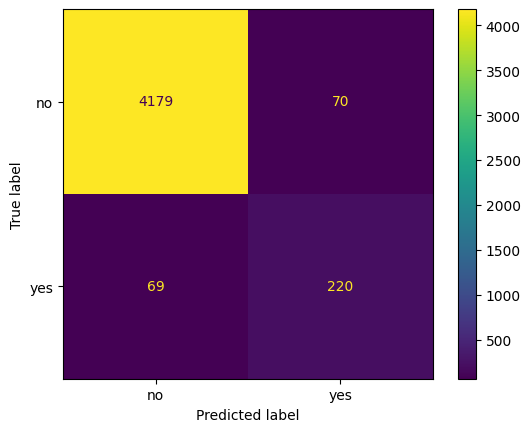

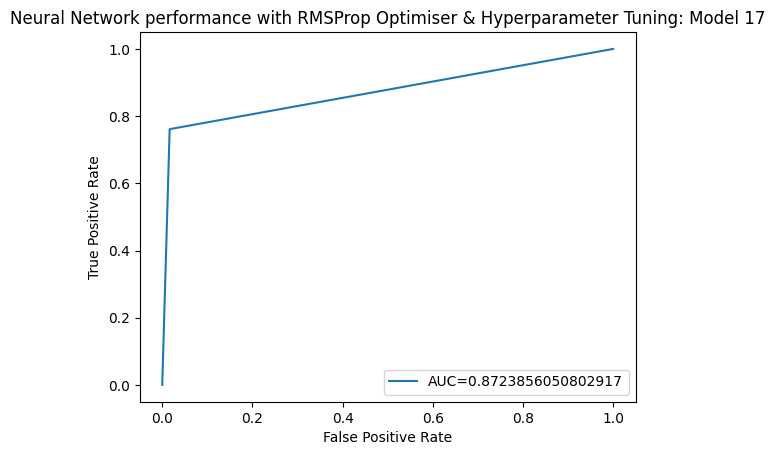

{'optimiser': 'RMSProp', 'num_hidden_layers': 1, 'num_neurons': 32, 'regularization': 0.005}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9415 - loss: 0.3547 - val_accuracy: 0.9755 - val_loss: 0.1057
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9674 - loss: 0.1166 - val_accuracy: 0.9761 - val_loss: 0.0908
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9689 - loss: 0.1020 - val_accuracy: 0.9737 - val_loss: 0.0878
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9698 - loss: 0.0931 - val_accuracy: 0.9780 - val_loss: 0.0840
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9736 - loss: 0.0898 - val_accuracy: 0.9780 - val_loss: 0.0839
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9713 - loss: 0.0930 - val_accuracy: 0.9761 - val_loss: 0.0852
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9732 - loss: 0.0889
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9713 - loss: 0.0927
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


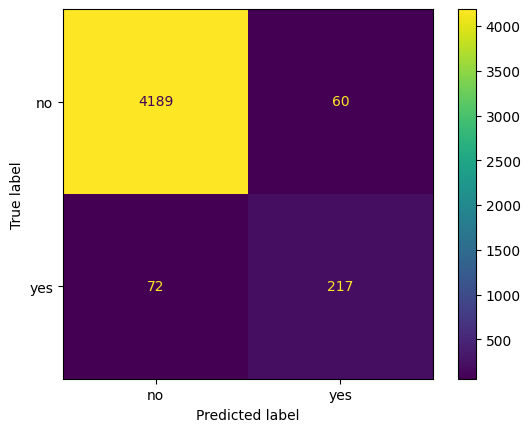

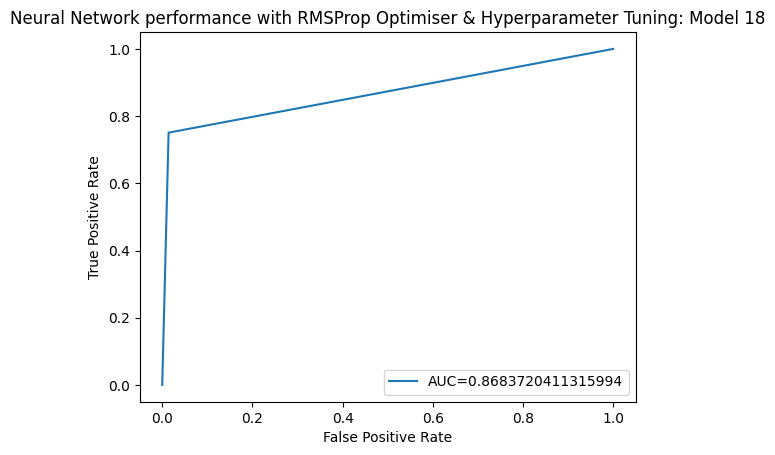

{'optimiser': 'RMSProp', 'num_hidden_layers': 1, 'num_neurons': 32, 'regularization': 0.01}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9321 - loss: 0.4802 - val_accuracy: 0.9755 - val_loss: 0.1096
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9707 - loss: 0.1179 - val_accuracy: 0.9725 - val_loss: 0.0907
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9693 - loss: 0.1023 - val_accuracy: 0.9749 - val_loss: 0.0839
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9677 - loss: 0.0971 - val_accuracy: 0.9774 - val_loss: 0.0787
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9730 - loss: 0.0899 - val_accuracy: 0.9804 - val_loss: 0.0809
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9730 - loss: 0.0889
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9693 - loss: 0.0874
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


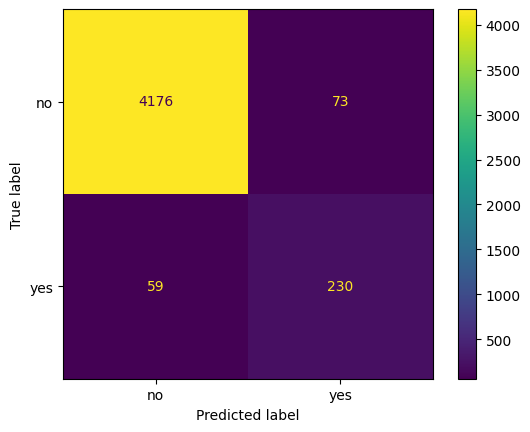

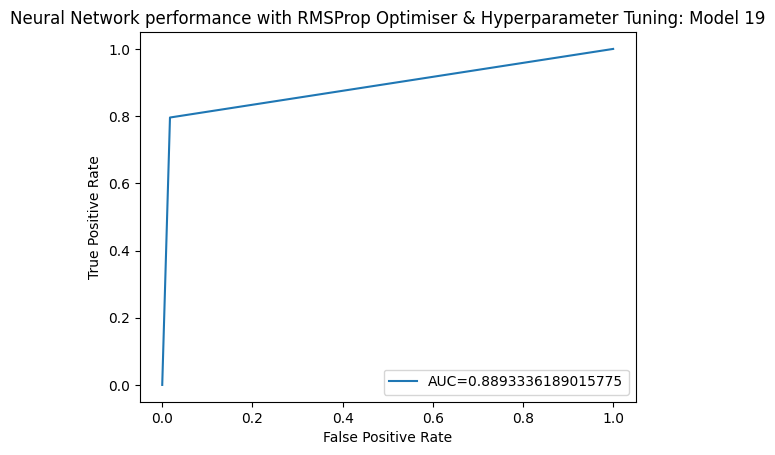

{'optimiser': 'RMSProp', 'num_hidden_layers': 1, 'num_neurons': 32, 'regularization': 0.05}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.9379 - loss: 1.2559 - val_accuracy: 0.9706 - val_loss: 0.0949
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9691 - loss: 0.1000 - val_accuracy: 0.9725 - val_loss: 0.0912
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9700 - loss: 0.0923 - val_accuracy: 0.9718 - val_loss: 0.0885
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9691 - loss: 0.0952 - val_accuracy: 0.9712 - val_loss: 0.0868
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9699 - loss: 0.0904 - val_accuracy: 0.9706 - val_loss: 0.0868
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9662 - loss: 0.0973
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9690 - loss: 0.0943
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


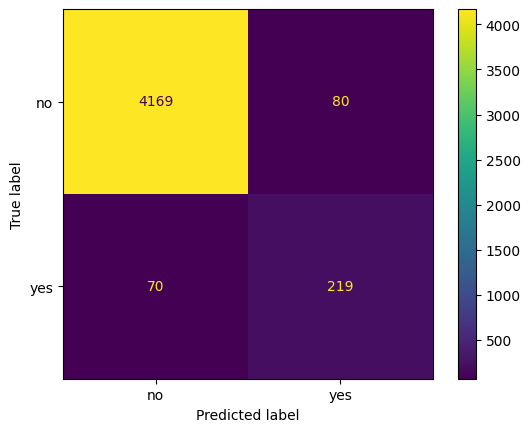

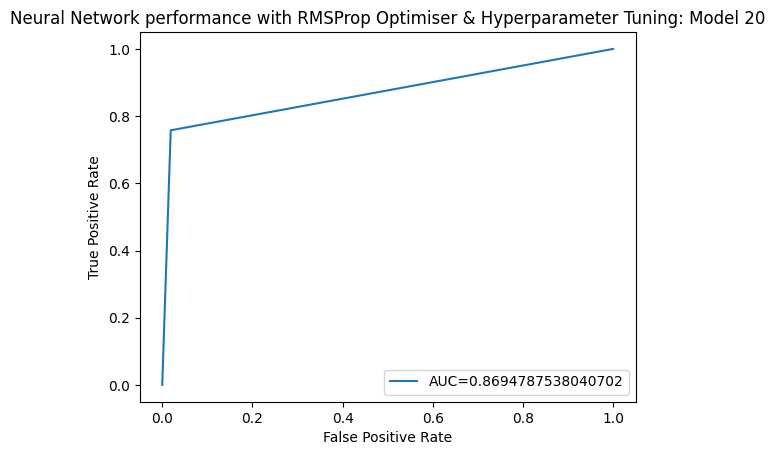

{'optimiser': 'RMSProp', 'num_hidden_layers': 2, 'num_neurons': 64, 'regularization': 0.005}


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9245 - loss: 0.3631 - val_accuracy: 0.9780 - val_loss: 0.1090
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9709 - loss: 0.1170 - val_accuracy: 0.9718 - val_loss: 0.0975
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9702 - loss: 0.1035 - val_accuracy: 0.9761 - val_loss: 0.0882
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9707 - loss: 0.0999 - val_accuracy: 0.9749 - val_loss: 0.0883
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9717 - loss: 0.0944
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9699 - loss: 0.0997
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


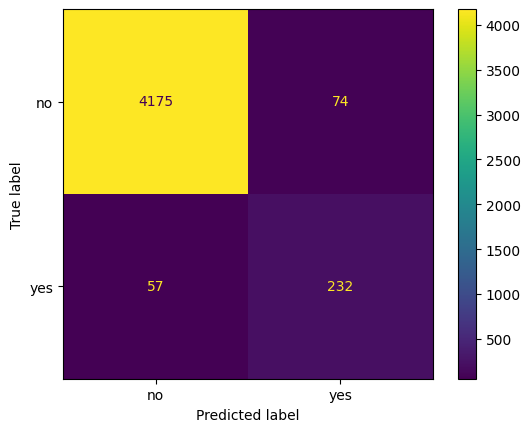

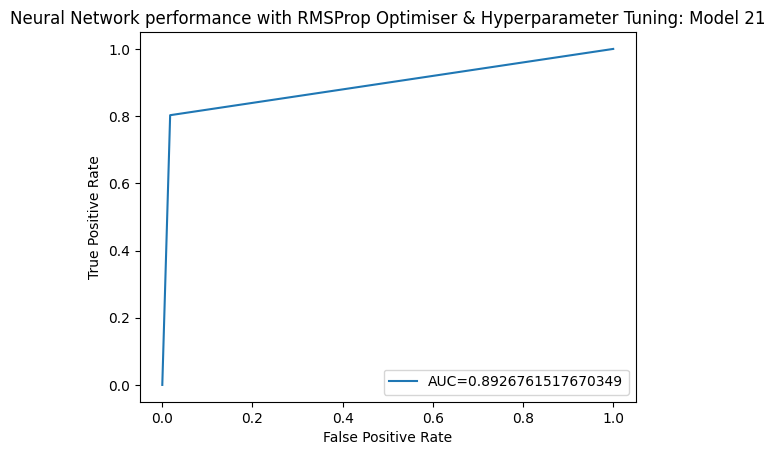

{'optimiser': 'RMSProp', 'num_hidden_layers': 2, 'num_neurons': 64, 'regularization': 0.01}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9456 - loss: 0.4489 - val_accuracy: 0.9761 - val_loss: 0.1058
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9708 - loss: 0.1147 - val_accuracy: 0.9761 - val_loss: 0.0915
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9692 - loss: 0.1024 - val_accuracy: 0.9737 - val_loss: 0.0925
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9732 - loss: 0.0998
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9703 - loss: 0.1046
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


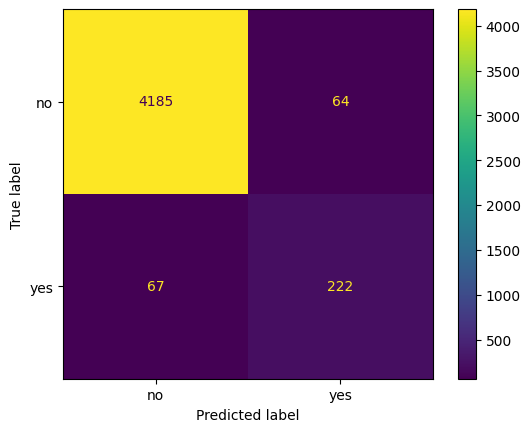

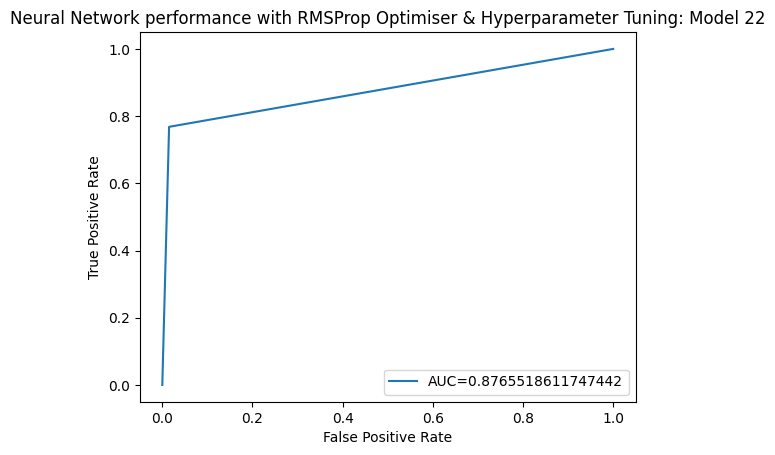

{'optimiser': 'RMSProp', 'num_hidden_layers': 2, 'num_neurons': 64, 'regularization': 0.05}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9461 - loss: 1.2344 - val_accuracy: 0.9743 - val_loss: 0.1019
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9658 - loss: 0.1049 - val_accuracy: 0.9786 - val_loss: 0.0880
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9657 - loss: 0.1027 - val_accuracy: 0.9725 - val_loss: 0.0866
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9687 - loss: 0.0975 - val_accuracy: 0.9700 - val_loss: 0.0975
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9671 - loss: 0.0949
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9692 - loss: 0.0924
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


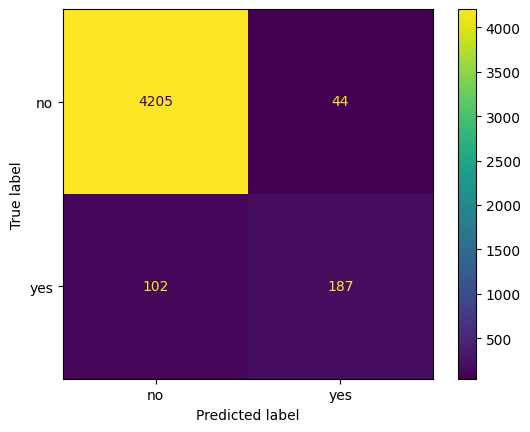

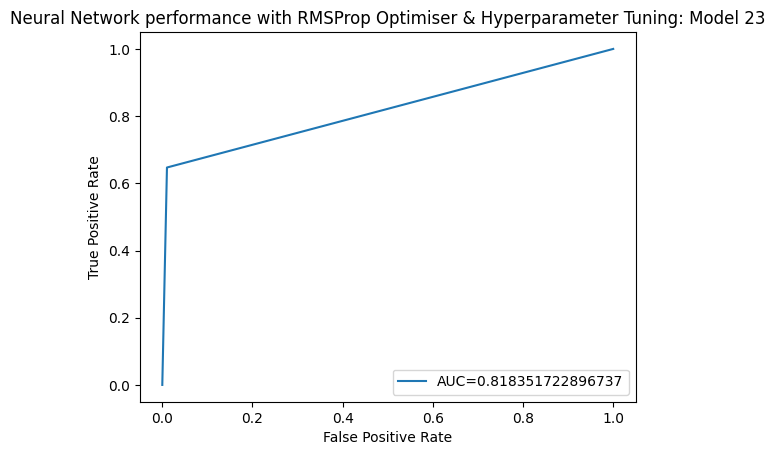

{'optimiser': 'RMSProp', 'num_hidden_layers': 3, 'num_neurons': 128, 'regularization': 0.005}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9506 - loss: 0.2975 - val_accuracy: 0.9688 - val_loss: 0.1243
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9686 - loss: 0.1193 - val_accuracy: 0.9755 - val_loss: 0.0939
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9695 - loss: 0.1118 - val_accuracy: 0.9767 - val_loss: 0.0934
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9692 - loss: 0.1066 - val_accuracy: 0.9755 - val_loss: 0.0909
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9706 - loss: 0.0988 - val_accuracy: 0.9774 - val_loss: 0.0889
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9739 - loss: 0.0951 - val_accuracy: 0.9767 - val_loss: 0.0856
Epoch 7/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9680 - loss: 0.1024 - val_accuracy: 0.9743 - val_loss: 0.0880
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9723 - loss: 0.0912
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

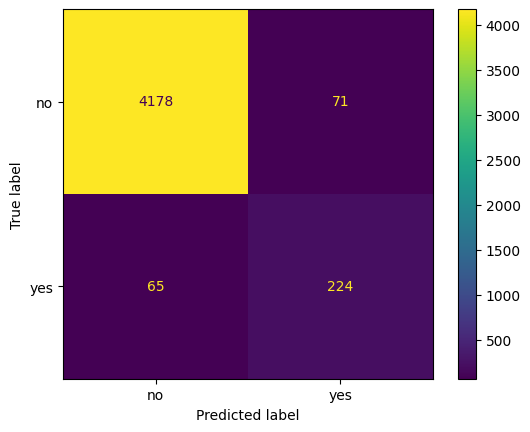

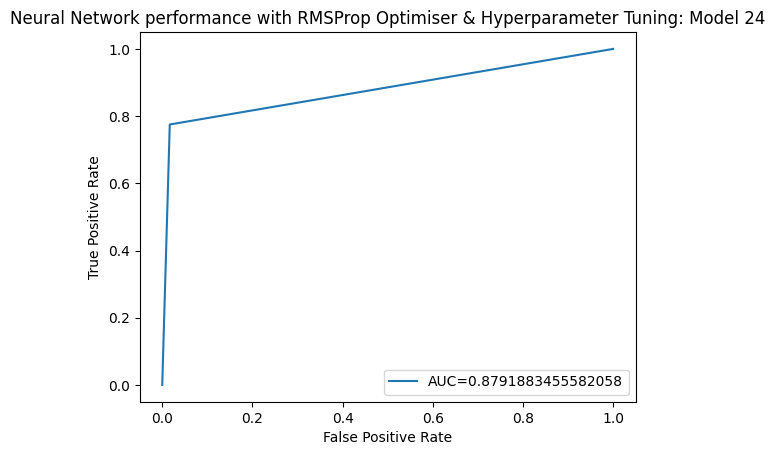

{'optimiser': 'RMSProp', 'num_hidden_layers': 3, 'num_neurons': 128, 'regularization': 0.01}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9454 - loss: 0.4335 - val_accuracy: 0.9725 - val_loss: 0.1181
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9696 - loss: 0.1195 - val_accuracy: 0.9774 - val_loss: 0.0936
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9699 - loss: 0.1092 - val_accuracy: 0.9731 - val_loss: 0.0907
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9701 - loss: 0.1010 - val_accuracy: 0.9749 - val_loss: 0.0894
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9742 - loss: 0.0953 - val_accuracy: 0.9737 - val_loss: 0.0859
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9698 - loss: 0.0964 - val_accuracy: 0.9731 - val_loss: 0.0879
511/511 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9710 - loss: 0.0924
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9677 - loss: 0.0947
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


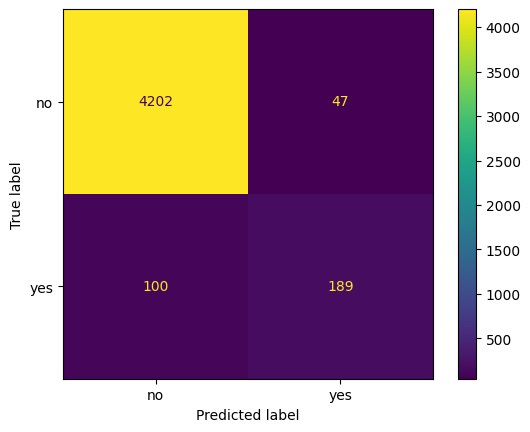

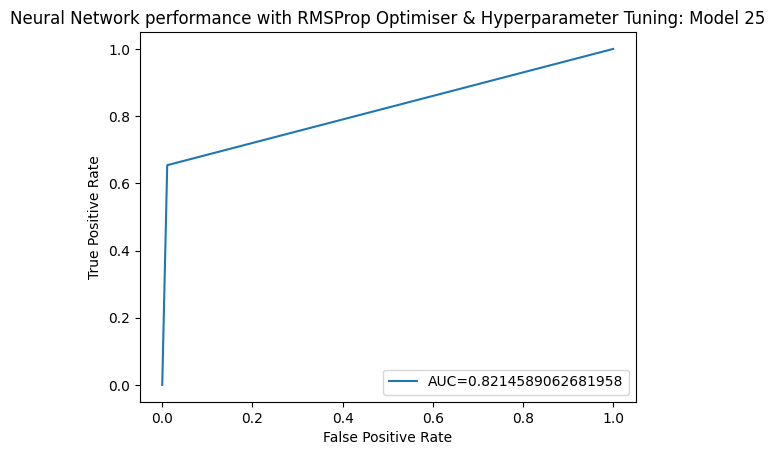

{'optimiser': 'RMSProp', 'num_hidden_layers': 3, 'num_neurons': 128, 'regularization': 0.05}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9564 - loss: 1.2366 - val_accuracy: 0.9639 - val_loss: 0.1338
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9642 - loss: 0.1197 - val_accuracy: 0.9725 - val_loss: 0.0942
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9661 - loss: 0.1047 - val_accuracy: 0.9676 - val_loss: 0.0916
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9686 - loss: 0.1002 - val_accuracy: 0.9761 - val_loss: 0.0826
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9690 - loss: 0.1017 - val_accuracy: 0.9731 - val_loss: 0.0848
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9730 - loss: 0.0923
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9709 - loss: 0.0945
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


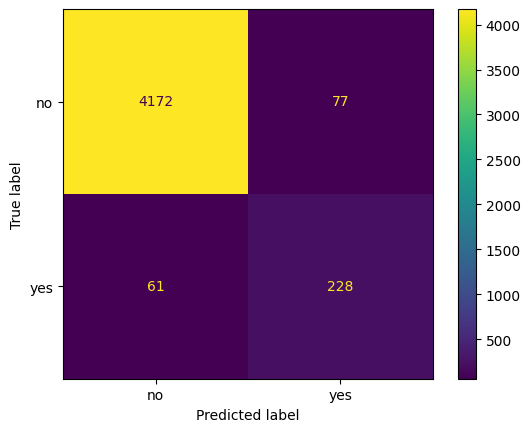

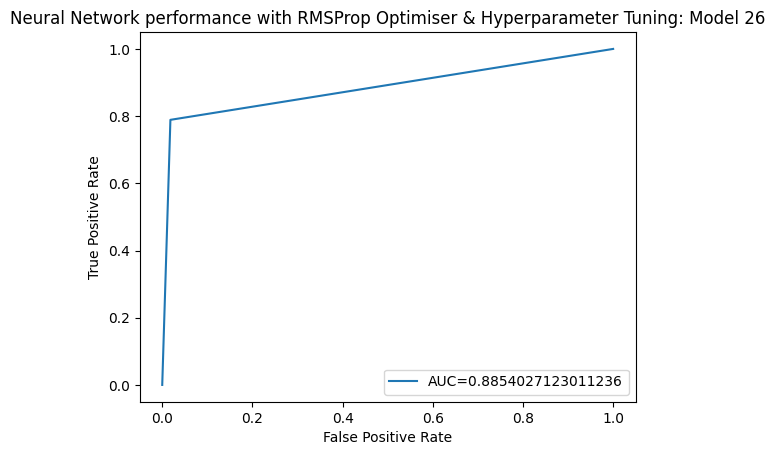

In [66]:
# Define model configurations.
rmsprop_model_configs = [
    {"optimiser":'RMSProp', "num_hidden_layers":1, "num_neurons": 1, "regularization":0.005},
    {"optimiser":'RMSProp', "num_hidden_layers":1, "num_neurons": 1, "regularization":0.01},
    {"optimiser":'RMSProp', "num_hidden_layers":1, "num_neurons": 1, "regularization":0.05},
    {"optimiser":'RMSProp', "num_hidden_layers":1, "num_neurons": 32, "regularization":0.005},
    {"optimiser":'RMSProp', "num_hidden_layers":1, "num_neurons": 32, "regularization":0.01},
    {"optimiser":'RMSProp', "num_hidden_layers":1, "num_neurons": 32, "regularization":0.05},
    {"optimiser":'RMSProp', "num_hidden_layers":2, "num_neurons": 64, "regularization":0.005},
    {"optimiser":'RMSProp', "num_hidden_layers":2, "num_neurons": 64, "regularization":0.01},
    {"optimiser":'RMSProp', "num_hidden_layers":2, "num_neurons": 64, "regularization":0.05},
    {"optimiser":'RMSProp', "num_hidden_layers":3, "num_neurons": 128, "regularization":0.005},
    {"optimiser":'RMSProp', "num_hidden_layers":3, "num_neurons": 128, "regularization":0.01},
    {"optimiser":'RMSProp', "num_hidden_layers":3, "num_neurons": 128, "regularization":0.05}
]

rmsprop_cmdf = pd.DataFrame(columns=['Optimiser', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])
# Train and evaluate each model.
rmsprop_results = []
count = 15
for config in rmsprop_model_configs:
  print(config)
  model2 = create_model3(**config)
  early_stopping_callback = EarlyStopping(monitor='val_loss', patience=1,
                                            restore_best_weights=True)
  history = model2.fit(X_train, y_train, epochs=50, batch_size=32,
                        validation_split=0.1,  verbose=1,
                        callbacks=[early_stopping_callback])
  train_loss, train_accuracy = model2.evaluate(X_train, y_train, verbose=1)
  test_loss, test_accuracy = model2.evaluate(X_test, y_test, verbose=1)

  y_pred = (model2.predict(X_test) > 0.5).astype(int)
  rmsprop_accuracy = accuracy_score(y_test, y_pred)
  rmsprop_prec = precision_score(y_test, y_pred)
  rmsprop_recall = recall_score(y_test, y_pred)
  rmsprop_f1 = f1_score(y_test, y_pred)
  # Display confusion matrix
  cm = confusion_matrix(y_test, y_pred)
  cfmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["no","yes"])
  cfmd.plot()
  plt.show()
  fpr, tpr, _ = roc_curve(y_test,  y_pred)
  auc = roc_auc_score(y_test, y_pred)

  #create ROC curve
  plt.plot(fpr,tpr, label="AUC="+str(auc))
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')
  plt.title("Neural Network performance with RMSProp Optimiser & Hyperparameter Tuning: Model "+str(count))
  plt.legend(loc=4)
  plt.show()
  new_row = {'Optimiser': 'RMSProp',
            'Accuracy': rmsprop_accuracy,
            'Precision': rmsprop_prec,
            'Recall': rmsprop_recall,
            'F1 Score': rmsprop_f1}
  rmsprop_cmdf = pd.concat([rmsprop_cmdf, pd.DataFrame([new_row])])
  rmsprop_cmdf = rmsprop_cmdf.reset_index(drop=True)

  rmsprop_results.append({
        "config": config,
        "train_loss": train_loss,
        "train_accuracy": train_accuracy,
        "test_loss": test_loss,
        "test_accuracy": test_accuracy,
        "history": history
  })
  count += 1

In [67]:
rmsprop_cmdf.head(15)

,Optimiser,Accuracy,Precision,Recall,F1 Score
0,RMSProp,0.974438,0.821561,0.764706,0.792115
1,RMSProp,0.970912,0.777385,0.761246,0.769231
2,RMSProp,0.969370,0.758621,0.761246,0.759931
3,RMSProp,0.970912,0.783394,0.750865,0.766784
4,RMSProp,0.970912,0.759076,0.795848,0.777027
5,RMSProp,0.966946,0.732441,0.757785,0.744898
6,RMSProp,0.971133,0.758170,0.802768,0.779832
7,RMSProp,0.971133,0.776224,0.768166,0.772174
8,RMSProp,0.967827,0.809524,0.647059,0.719231
9,RMSProp,0.970031,0.759322,0.775087,0.767123


In [69]:
rmsprop_cmdf.to_latex()

'\\begin{tabular}{llrrrr}\n\\toprule\n & Optimiser & Accuracy & Precision & Recall & F1 Score \\\\\n\\midrule\n0 & RMSProp & 0.974438 & 0.821561 & 0.764706 & 0.792115 \\\\\n1 & RMSProp & 0.970912 & 0.777385 & 0.761246 & 0.769231 \\\\\n2 & RMSProp & 0.969370 & 0.758621 & 0.761246 & 0.759931 \\\\\n3 & RMSProp & 0.970912 & 0.783394 & 0.750865 & 0.766784 \\\\\n4 & RMSProp & 0.970912 & 0.759076 & 0.795848 & 0.777027 \\\\\n5 & RMSProp & 0.966946 & 0.732441 & 0.757785 & 0.744898 \\\\\n6 & RMSProp & 0.971133 & 0.758170 & 0.802768 & 0.779832 \\\\\n7 & RMSProp & 0.971133 & 0.776224 & 0.768166 & 0.772174 \\\\\n8 & RMSProp & 0.967827 & 0.809524 & 0.647059 & 0.719231 \\\\\n9 & RMSProp & 0.970031 & 0.759322 & 0.775087 & 0.767123 \\\\\n10 & RMSProp & 0.967607 & 0.800847 & 0.653979 & 0.720000 \\\\\n11 & RMSProp & 0.969590 & 0.747541 & 0.788927 & 0.767677 \\\\\n\\bottomrule\n\\end{tabular}\n'

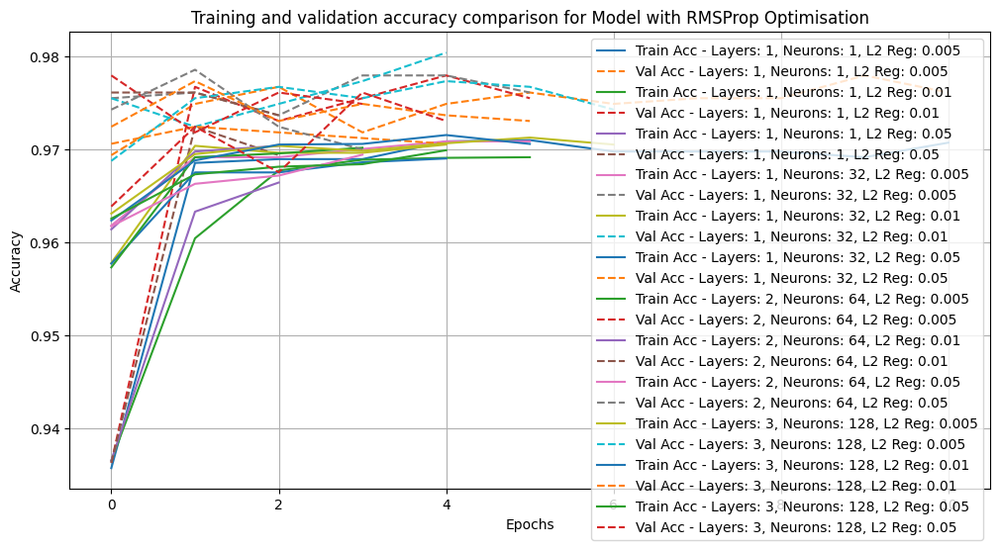

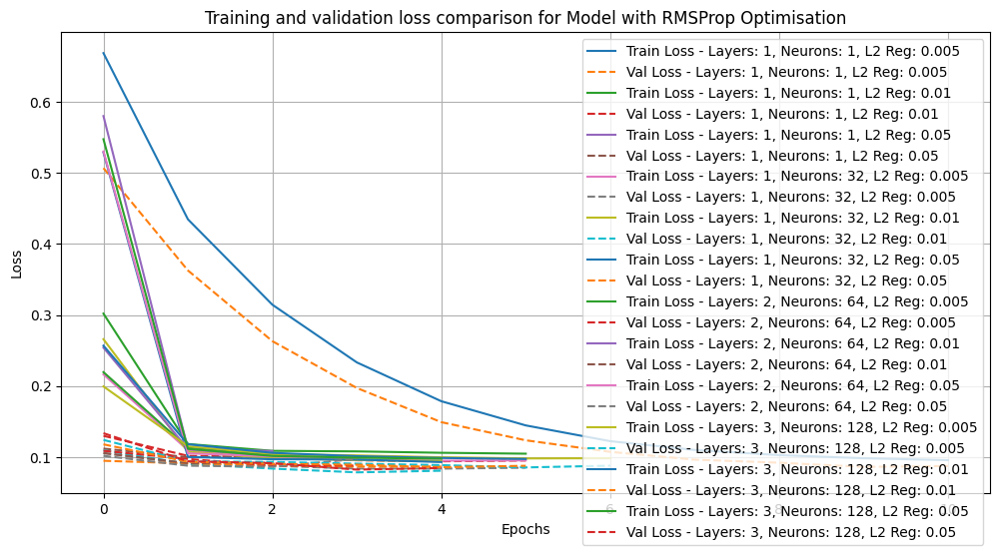

In [70]:
plt.figure(figsize=(12, 6))
for result in rmsprop_results:
    config_str = f"Layers: {result['config']['num_hidden_layers']}, Neurons: {result['config']['num_neurons']}, L2 Reg: {result['config']['regularization']}"
    plt.plot(result['history'].history['accuracy'], label=f"Train Acc - {config_str}")
    plt.plot(result['history'].history['val_accuracy'], linestyle='--', label=f"Val Acc - {config_str}")
plt.title('Training and validation accuracy comparison for Model with RMSProp Optimisation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()
#plt.savefig("RMSPropAcc_multiconfigs_hype.jpg")
#files.download("RMSPropAcc_multiconfigs_hype.jpg")

# Plot train/validation loss.
plt.figure(figsize=(12, 6))
for result in rmsprop_results:
    config_str = f"Layers: {result['config']['num_hidden_layers']}, Neurons: {result['config']['num_neurons']}, L2 Reg: {result['config']['regularization']}"
    plt.plot(result['history'].history['loss'], label=f"Train Loss - {config_str}")
    plt.plot(result['history'].history['val_loss'], linestyle='--', label=f"Val Loss - {config_str}")
plt.title('Training and validation loss comparison for Model with RMSProp Optimisation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()
#plt.savefig("RMSPropLoss_multiconfigs_hype.jpg")
#files.download("RMSPropLoss_multiconfigs_hype.jpg")

# Neural Network Modelling with Additional Features

In [38]:
AddFEdf = student_df.drop(['BookingId','BookingType', 'LeadSource',
                      'DiscountType', 'Nationality', 'HomeCountry',
                      'HomeState', 'HomeCity', 'PresentCount', 'LateCount',
                      'AuthorisedAbsenceCount','ArrivedDate',
                      'NonCompletionReason', 'TerminationDate',
                      'CourseFirstIntakeDate', 'CourseStartDate',
                      'CourseEndDate', 'AcademicYear', 'CourseName',
                      'LearnerCode', 'ProgressionDegree',
                      'EligibleToProgress', 'AssessedModules',
                      'PassedModules', 'FailedModules'], axis=1)

In [39]:
print(AddFEdf.shape)
AddFEdf.head()

(25059, 11)


,CentreName,DateofBirth,Gender,CourseLevel,IsFirstIntake,CompletedCourse,CreditWeightedAverage,ProgressionUniversity,UnauthorisedAbsenceCount,ContactHours,AttendancePercentage
0,ISC_Aberdeen,13/01/1998,Male,Pre-Masters,True,Yes,75.0,University of Aberdeen,NaN,NaN,NaN
1,ISC_Aberdeen,12/02/1998,Male,Foundation,False,Yes,73.0,University of Aberdeen,5.0,215.0,97.0
2,ISC_Aberdeen,07/04/2000,Male,International Year Two,False,Yes,66.0,University of Aberdeen,6.0,226.0,97.0
3,ISC_Aberdeen,18/05/1999,Male,International Year Two,True,Yes,71.0,University of Aberdeen,15.0,399.0,94.0
4,ISC_Aberdeen,19/04/1996,Male,Pre-Masters,True,Yes,60.0,University of Aberdeen,NaN,NaN,NaN


In [40]:
AddFEdf.isnull().sum()

,0
CentreName,0
DateofBirth,0
Gender,0
CourseLevel,0
IsFirstIntake,0
CompletedCourse,0
CreditWeightedAverage,2296
ProgressionUniversity,0
UnauthorisedAbsenceCount,208
ContactHours,208


In [41]:
AddFEdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25059 entries, 0 to 25058
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CentreName                25059 non-null  object 
 1   DateofBirth               25059 non-null  object 
 2   Gender                    25059 non-null  object 
 3   CourseLevel               25059 non-null  object 
 4   IsFirstIntake             25059 non-null  bool   
 5   CompletedCourse           25059 non-null  object 
 6   CreditWeightedAverage     22763 non-null  float64
 7   ProgressionUniversity     25059 non-null  object 
 8   UnauthorisedAbsenceCount  24851 non-null  float64
 9   ContactHours              24851 non-null  float64
 10  AttendancePercentage      24851 non-null  float64
dtypes: bool(1), float64(4), object(6)
memory usage: 1.9+ MB


In [42]:
AddFEdf = AddFEdf.dropna().reset_index(drop=True)
print(AddFEdf.shape)
AddFEdf.head()

(22686, 11)


,CentreName,DateofBirth,Gender,CourseLevel,IsFirstIntake,CompletedCourse,CreditWeightedAverage,ProgressionUniversity,UnauthorisedAbsenceCount,ContactHours,AttendancePercentage
0,ISC_Aberdeen,12/02/1998,Male,Foundation,False,Yes,73.0,University of Aberdeen,5.0,215.0,97.0
1,ISC_Aberdeen,07/04/2000,Male,International Year Two,False,Yes,66.0,University of Aberdeen,6.0,226.0,97.0
2,ISC_Aberdeen,18/05/1999,Male,International Year Two,True,Yes,71.0,University of Aberdeen,15.0,399.0,94.0
3,ISC_Aberdeen,24/07/2000,Male,International Year Two,True,Yes,78.0,University of Aberdeen,3.0,371.0,99.0
4,ISC_Aberdeen,28/11/2001,Male,Foundation,False,Yes,68.0,University of Aberdeen,25.0,214.0,86.0


In [43]:
AddFEdf.isnull().sum()

,0
CentreName,0
DateofBirth,0
Gender,0
CourseLevel,0
IsFirstIntake,0
CompletedCourse,0
CreditWeightedAverage,0
ProgressionUniversity,0
UnauthorisedAbsenceCount,0
ContactHours,0


In [44]:
# Binary coding the 'Gender' feature
AddFEdf['Gender'] = AddFEdf['Gender'].map({'Male': 1,'Female': 0})
# Binary coding the 'IsFirstIntake' feature
AddFEdf['IsFirstIntake'] = AddFEdf['IsFirstIntake'].map({False: 0, True: 1})
# Rename the 'CompletedCourse' column and update the DataFrame 'FEdf'
AddFEdf = AddFEdf.rename(columns={'CompletedCourse': 'DropOut'})
AddFEdf['DropOut'] = AddFEdf['DropOut'].map({'Yes': 0, 'No': 1})
#
# First the 'Customer_BirthDate' needs to changed into the format '%d%b%Y'.
# Then the 'Age' variable is added which calculates the record of number of days
# from today back to cistomer's day of birth.
from datetime import datetime
AddFEdf['DateofBirth'] = pd.to_datetime(AddFEdf['DateofBirth'], format='%d/%m/%Y')
AddFEdf['Age'] = (pd.to_datetime('today') -
                   AddFEdf['DateofBirth']).dt.days/365.25
# Drop the variable 'Customer_BirthDate' now.
AddFEdf = AddFEdf.drop(['DateofBirth'], axis=1)
print(AddFEdf.shape)
AddFEdf.head()

(22686, 11)


,CentreName,Gender,CourseLevel,IsFirstIntake,DropOut,CreditWeightedAverage,ProgressionUniversity,UnauthorisedAbsenceCount,ContactHours,AttendancePercentage,Age
0,ISC_Aberdeen,1,Foundation,0,0,73.0,University of Aberdeen,5.0,215.0,97.0,26.735113
1,ISC_Aberdeen,1,International Year Two,0,0,66.0,University of Aberdeen,6.0,226.0,97.0,24.585900
2,ISC_Aberdeen,1,International Year Two,1,0,71.0,University of Aberdeen,15.0,399.0,94.0,25.475702
3,ISC_Aberdeen,1,International Year Two,1,0,78.0,University of Aberdeen,3.0,371.0,99.0,24.290212
4,ISC_Aberdeen,1,Foundation,0,0,68.0,University of Aberdeen,25.0,214.0,86.0,22.943190


#One-Hot Encoding (OHE) for Categorical Features
## The CentreName Feature

In [45]:
from sklearn.preprocessing import OneHotEncoder
# Initialise OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)
# Apply one-hot encoding to the categorical columns
one_hot_encoded = encoder.fit_transform(AddFEdf[['CentreName']])
# Create a DataFrame with the one-hot encoded columns
one_hot_df = pd.DataFrame.from_records(one_hot_encoded,
                          columns=encoder.get_feature_names_out())
# Concatenate the on-hot encoded dataframe with the original dataframe
AddFEdf = pd.concat([AddFEdf, one_hot_df], axis=1)
# Drop the original categorical columns
AddFEdf = AddFEdf.drop('CentreName', axis=1)
print(AddFEdf.shape)
AddFEdf.head(10)

(22686, 29)


,Gender,CourseLevel,IsFirstIntake,DropOut,CreditWeightedAverage,ProgressionUniversity,UnauthorisedAbsenceCount,ContactHours,AttendancePercentage,Age,...,CentreName_ISC_Leeds,CentreName_ISC_Lincoln,CentreName_ISC_London,CentreName_ISC_Online,CentreName_ISC_RHUL,CentreName_ISC_Sheffield,CentreName_ISC_Strathclyde,CentreName_ISC_Surrey,CentreName_ISC_Sussex,CentreName_ISC_Teesside
0,1,Foundation,0,0,73.0,University of Aberdeen,5.0,215.0,97.0,26.735113,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,International Year Two,0,0,66.0,University of Aberdeen,6.0,226.0,97.0,24.585900,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1,International Year Two,1,0,71.0,University of Aberdeen,15.0,399.0,94.0,25.475702,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1,International Year Two,1,0,78.0,University of Aberdeen,3.0,371.0,99.0,24.290212,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,Foundation,0,0,68.0,University of Aberdeen,25.0,214.0,86.0,22.943190,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0,Foundation,1,0,81.0,University of Aberdeen,9.0,386.0,96.0,25.199179,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0,Foundation,1,0,83.0,University of Aberdeen,6.0,380.0,97.0,24.287474,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0,International Year Two,0,0,74.0,University of Aberdeen,3.0,226.0,98.0,24.334018,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,1,Foundation,1,0,82.0,University of Aberdeen,36.0,376.0,85.0,23.110198,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,1,Foundation,1,0,87.0,University of Aberdeen,1.0,386.0,100.0,25.546886,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## OHE for the CourseLevel Feature

In [46]:
from sklearn.preprocessing import OneHotEncoder
# Initialise OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)
# Apply one-hot encoding to the categorical columns
one_hot_encoded = encoder.fit_transform(AddFEdf[['CourseLevel']])
# Create a DataFrame with the one-hot encoded columns
one_hot_df = pd.DataFrame.from_records(one_hot_encoded,
                          columns=encoder.get_feature_names_out())
# Concatenate the on-hot encoded dataframe with the original dataframe
AddFEdf = pd.concat([AddFEdf, one_hot_df], axis=1)
# Drop the original categorical columns
AddFEdf = AddFEdf.drop('CourseLevel', axis=1)
print(AddFEdf.shape)
AddFEdf.head(10)

(22686, 32)


,Gender,IsFirstIntake,DropOut,CreditWeightedAverage,ProgressionUniversity,UnauthorisedAbsenceCount,ContactHours,AttendancePercentage,Age,CentreName_ISC_Aberdeen,...,CentreName_ISC_RHUL,CentreName_ISC_Sheffield,CentreName_ISC_Strathclyde,CentreName_ISC_Surrey,CentreName_ISC_Sussex,CentreName_ISC_Teesside,CourseLevel_Foundation,CourseLevel_International Year One,CourseLevel_International Year Two,CourseLevel_Pre-Masters
0,1,0,0,73.0,University of Aberdeen,5.0,215.0,97.0,26.735113,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1,0,0,66.0,University of Aberdeen,6.0,226.0,97.0,24.585900,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1,1,0,71.0,University of Aberdeen,15.0,399.0,94.0,25.475702,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1,1,0,78.0,University of Aberdeen,3.0,371.0,99.0,24.290212,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1,0,0,68.0,University of Aberdeen,25.0,214.0,86.0,22.943190,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
5,0,1,0,81.0,University of Aberdeen,9.0,386.0,96.0,25.199179,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6,0,1,0,83.0,University of Aberdeen,6.0,380.0,97.0,24.287474,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,0,0,0,74.0,University of Aberdeen,3.0,226.0,98.0,24.334018,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8,1,1,0,82.0,University of Aberdeen,36.0,376.0,85.0,23.110198,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
9,1,1,0,87.0,University of Aberdeen,1.0,386.0,100.0,25.546886,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


## OHE for the ProgressionUniversity Feature

In [47]:
from sklearn.preprocessing import OneHotEncoder
# Initialise OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)
# Apply one-hot encoding to the categorical columns
one_hot_encoded = encoder.fit_transform(AddFEdf[['ProgressionUniversity']])
# Create a DataFrame with the one-hot encoded columns
one_hot_df = pd.DataFrame.from_records(one_hot_encoded,
                          columns=encoder.get_feature_names_out())
# Concatenate the on-hot encoded dataframe with the original dataframe
AddFEdf = pd.concat([AddFEdf, one_hot_df], axis=1)
# Drop the original categorical columns
AddFEdf = AddFEdf.drop('ProgressionUniversity', axis=1)
print(AddFEdf.shape)
AddFEdf.head(10)

(22686, 70)


,Gender,IsFirstIntake,DropOut,CreditWeightedAverage,UnauthorisedAbsenceCount,ContactHours,AttendancePercentage,Age,CentreName_ISC_Aberdeen,CentreName_ISC_Cardiff,...,ProgressionUniversity_University College Dublin,ProgressionUniversity_University of Aberdeen,ProgressionUniversity_University of Huddersfield,ProgressionUniversity_University of Leeds,ProgressionUniversity_University of Lincoln,ProgressionUniversity_University of Sheffield International College,ProgressionUniversity_University of Strathclyde,ProgressionUniversity_University of Surrey,ProgressionUniversity_University of Sussex,ProgressionUniversity_VU Amsterdam
0,1,0,0,73.0,5.0,215.0,97.0,26.735113,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,0,0,66.0,6.0,226.0,97.0,24.585900,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1,1,0,71.0,15.0,399.0,94.0,25.475702,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1,1,0,78.0,3.0,371.0,99.0,24.290212,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,0,0,68.0,25.0,214.0,86.0,22.943190,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0,1,0,81.0,9.0,386.0,96.0,25.199179,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0,1,0,83.0,6.0,380.0,97.0,24.287474,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0,0,0,74.0,3.0,226.0,98.0,24.334018,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,1,1,0,82.0,36.0,376.0,85.0,23.110198,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,1,1,0,87.0,1.0,386.0,100.0,25.546886,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [48]:
 AddFEdf.isnull().sum()

,0
Gender,0
IsFirstIntake,0
DropOut,0
CreditWeightedAverage,0
UnauthorisedAbsenceCount,0
...,...
ProgressionUniversity_University of Sheffield International College,0
ProgressionUniversity_University of Strathclyde,0
ProgressionUniversity_University of Surrey,0
ProgressionUniversity_University of Sussex,0


In [49]:
 # To make sure that there was no feature with null values
 AddFEdf.isnull().sum().sum()

0

In [50]:
AddFEdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22686 entries, 0 to 22685
Data columns (total 70 columns):
 #   Column                                                                                              Non-Null Count  Dtype  
---  ------                                                                                              --------------  -----  
 0   Gender                                                                                              22686 non-null  int64  
 1   IsFirstIntake                                                                                       22686 non-null  int64  
 2   DropOut                                                                                             22686 non-null  int64  
 3   CreditWeightedAverage                                                                               22686 non-null  float64
 4   UnauthorisedAbsenceCount                                                                            22686 non-nu

We have now 70 features because in OHE of the categorical features, we have not grouped any values into a group at all. Out of these we have five numerical features: **CreditWeightedAverage**, **UnauthorisedAbsenceCount**, **ContactHours**, **AttendancePercentage** and **Age**. We also have the **DropOut** feature which is the target feature.

In [22]:
numAddFEdf = AddFEdf[['CreditWeightedAverage', 'UnauthorisedAbsenceCount',
                      'ContactHours', 'AttendancePercentage', 'Age']]
print(numAddFEdf.shape)
numAddFEdf.head()

(22686, 5)


,CreditWeightedAverage,UnauthorisedAbsenceCount,ContactHours,AttendancePercentage,Age
0,73.0,5.0,215.0,97.0,26.721424
1,66.0,6.0,226.0,97.0,24.572211
2,71.0,15.0,399.0,94.0,25.462012
3,78.0,3.0,371.0,99.0,24.276523
4,68.0,25.0,214.0,86.0,22.929500


## Scaling applied:

In [23]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

scaled_numAddFEdf = scaler.fit_transform(numAddFEdf)
scaled_numAddFEdf = pd.DataFrame(scaled_numAddFEdf, columns=numAddFEdf.columns)
scaled_numAddFEdf.head()

,CreditWeightedAverage,UnauthorisedAbsenceCount,ContactHours,AttendancePercentage,Age
0,0.528102,-0.879400,-1.685259,0.777768,0.752647
1,0.165859,-0.852501,-1.581919,0.777768,0.078990
2,0.424604,-0.610409,0.043335,0.585770,0.357892
3,0.786847,-0.933198,-0.219712,0.905767,-0.013692
4,0.269357,-0.341417,-1.694654,0.073775,-0.435907


In [24]:
Scaled_numAddFEdf = pd.concat([scaled_numAddFEdf, AddFEdf[['DropOut']]], axis=1)
Scaled_numAddFEdf.head()

,CreditWeightedAverage,UnauthorisedAbsenceCount,ContactHours,AttendancePercentage,Age,DropOut
0,0.528102,-0.879400,-1.685259,0.777768,0.752647,0
1,0.165859,-0.852501,-1.581919,0.777768,0.078990,0
2,0.424604,-0.610409,0.043335,0.585770,0.357892,0
3,0.786847,-0.933198,-0.219712,0.905767,-0.013692,0
4,0.269357,-0.341417,-1.694654,0.073775,-0.435907,0


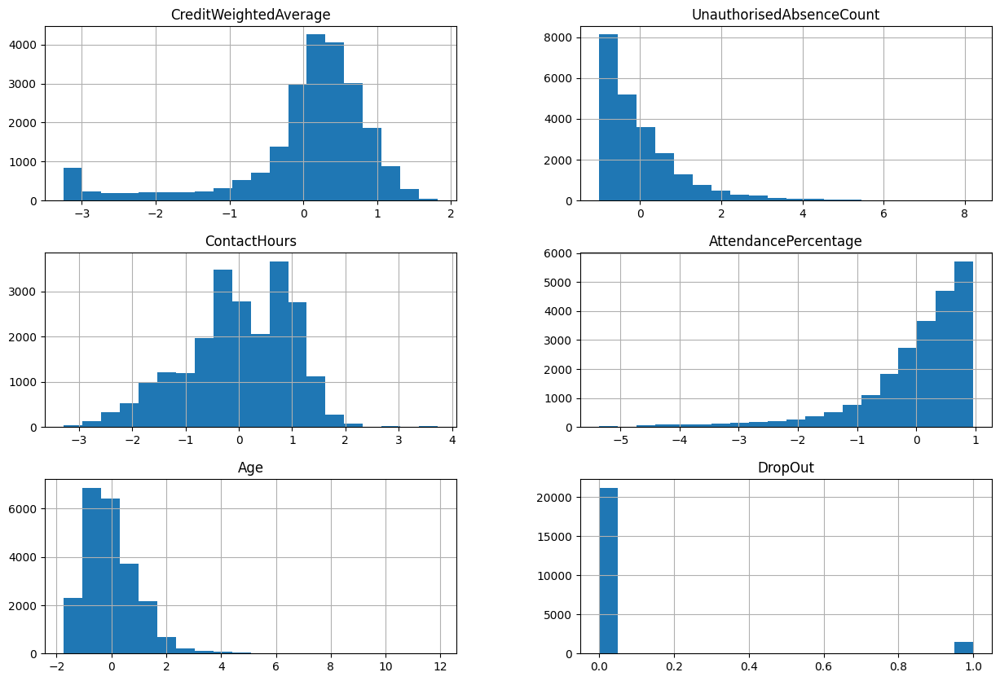

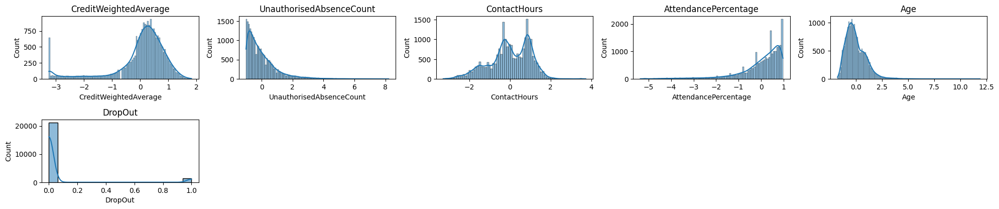

In [25]:
###############
## Data Distributions
###############
import matplotlib.pyplot as plt
import seaborn as sns

# # Histograms
Scaled_numAddFEdf.hist(bins=20, figsize=(15, 10))
plt.show()

# Visualizing distributions of features
plt.figure(figsize=(20, 10))
for i, col in enumerate(Scaled_numAddFEdf.columns):
    plt.subplot(5, 5, i+1)
    sns.histplot(Scaled_numAddFEdf[col], kde=True)
    plt.title(col)
    plt.tight_layout()

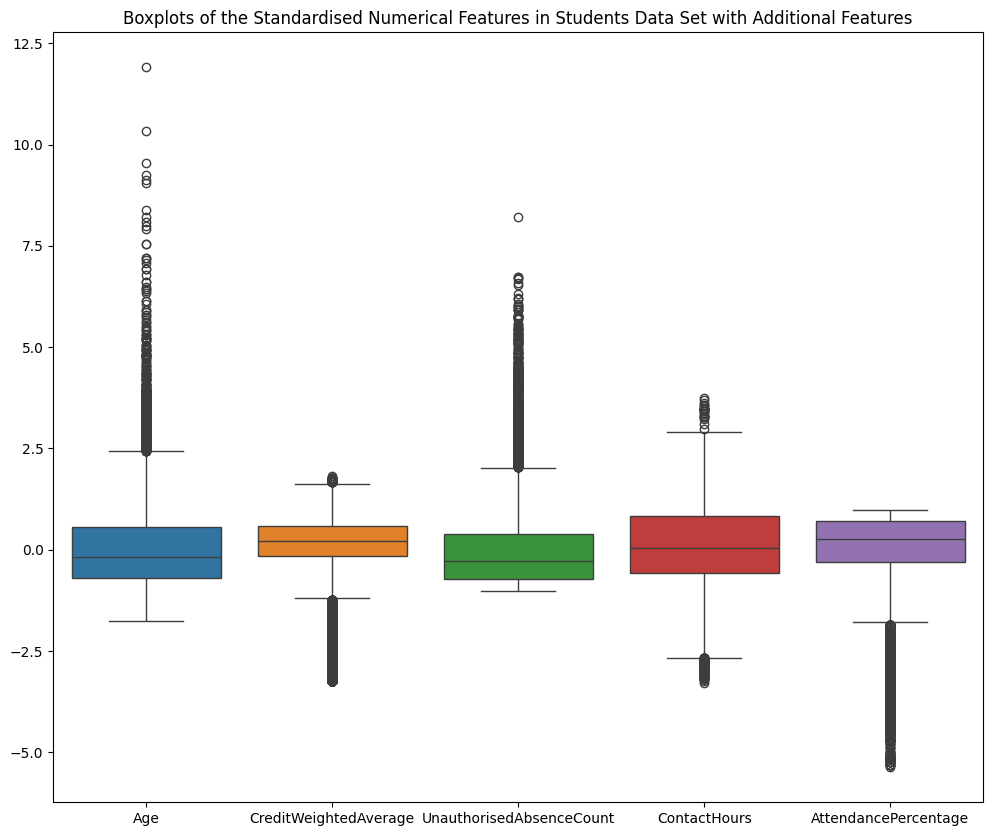

In [26]:
# Check for outliers
plt.figure(figsize=(12, 10))
sns.boxplot(data=Scaled_numAddFEdf[['Age', 'CreditWeightedAverage',
                                 'UnauthorisedAbsenceCount',
                                  'ContactHours', 'AttendancePercentage']])
plt.title('Boxplots of the Standardised Numerical Features in Students Data Set with Additional Features')
plt.show()

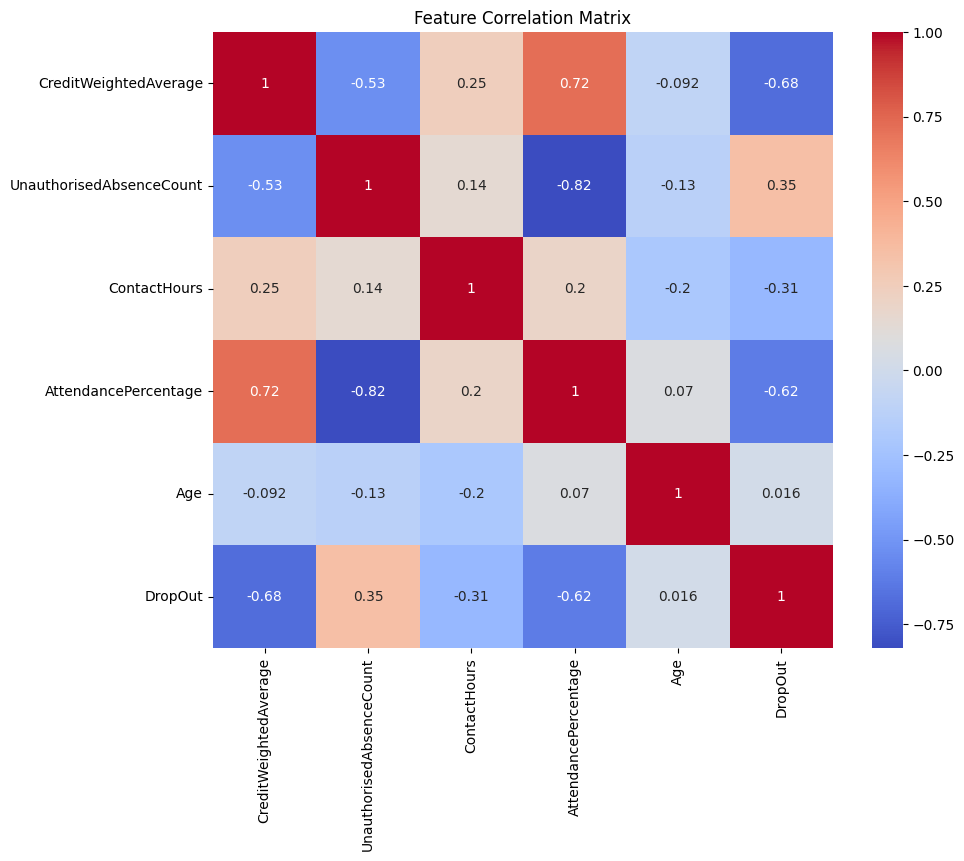

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 640x480 with 0 Axes>

In [28]:
# Correlation analysis
import google.colab.files as files
plt.figure(figsize=(10, 8))
sns.heatmap(Scaled_numAddFEdf.corr(), annot=True, cmap='coolwarm')
plt.title('Feature Correlation Matrix')
plt.show()
plt.savefig("AddedFeatures_CorrelationHeatmap.jpg")
files.download("AddedFeatures_CorrelationHeatmap.jpg")

<Figure size 1200x1000 with 0 Axes>

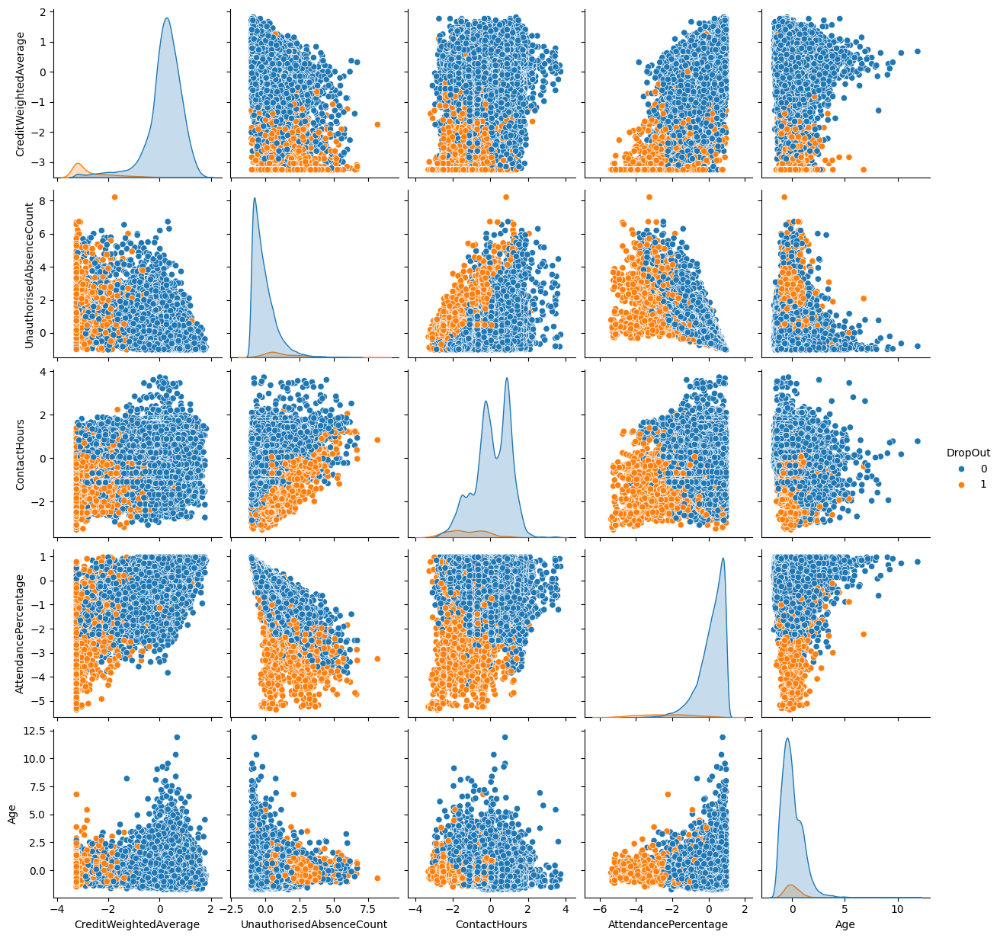

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 640x480 with 0 Axes>

In [29]:
plt.figure(figsize=(12, 10))
sns.pairplot(Scaled_numAddFEdf, hue='DropOut')
plt.show()
plt.savefig("AddedFeatures_pairplots.png")
files.download("AddedFeatures_pairplots.png")

<Figure size 2200x1800 with 0 Axes>

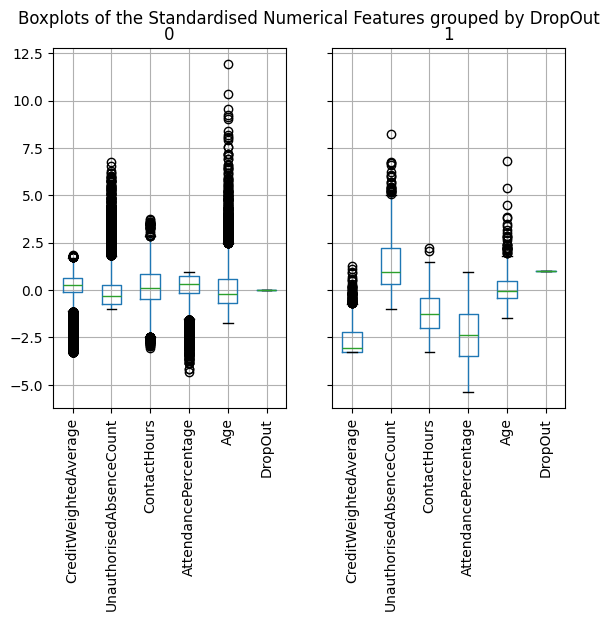

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 640x480 with 0 Axes>

In [30]:
plt.figure(figsize=(22, 18))
Scaled_numAddFEdf.groupby('DropOut').boxplot(subplots=True, rot=90)
plt.suptitle('Boxplots of the Standardised Numerical Features grouped by DropOut')
plt.show()
plt.savefig("AddedFeatures_GroupedBoxplots.jpg")
files.download("AddedFeatures_GroupedBoxplots.jpg")

# Splitting the Unscaled Data, and then Scaling:

In [58]:
X2 = AddFEdf.drop('DropOut', axis=1)
y2 = AddFEdf['DropOut']

In [59]:
# Splitting the unscaled data
X2_train_full, X2_test, y2_train_full, y2_test = train_test_split(X2, y2,
                                                    test_size=0.2,
                                                    random_state=42, stratify=y2)
X2_train, X2_valid, y2_train, y2_valid = train_test_split(X2_train_full,
                                                  y2_train_full, train_size=0.9)
print(X2_train.shape)
print(X2_valid.shape)
print(X2_test.shape)

# Standardise the data.
scaler = StandardScaler()

X2_train = scaler.fit_transform(X2_train)
X2_valid = scaler.transform(X2_valid)
X2_test = scaler.transform(X2_test)

(16333, 69)
(1815, 69)
(4538, 69)


# NN Model with Adam and RMSProp Optimisers without Hyperparameter Tuning
## With Additional Features

In [62]:
from sklearn.metrics import accuracy_score, precision_score
from sklearn.metrics import recall_score, f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, roc_auc_score
from keras import metrics
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping
from keras.regularizers import l2

In [63]:
# Define the model architecture.
def create_model(optimizer='adam'):
    model = keras.Sequential([
        layers.Dense(64, activation='relu', input_shape=(X2_train.shape[1],)),
        layers.Dropout(0.0),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.0),
        layers.Dense(1, activation='sigmoid')
    ])
    model.compile(loss='binary_crossentropy',
                  optimizer=optimizer,
                  metrics=['accuracy'])
    return model

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_18 (Dense)                     │ (None, 64)                  │           4,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,705 (34.00 KB)

 Trainable params: 8,705 (34.00 KB)

 Non-trainable params: 0 (0.00 B)

142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Adam Optimiser:
Accuracy 0.9790656676950198
Precision: 0.8702290076335878
Recall: 0.7889273356401384
F1 Score: 0.8275862068965517


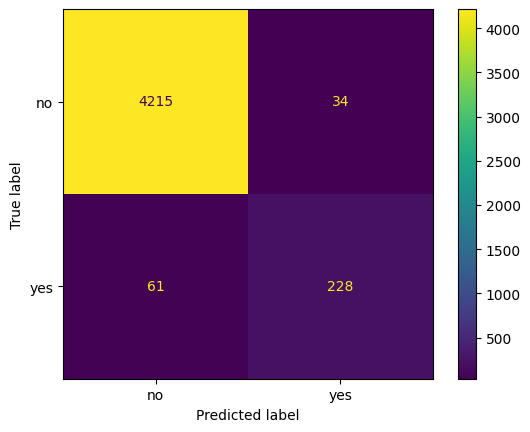

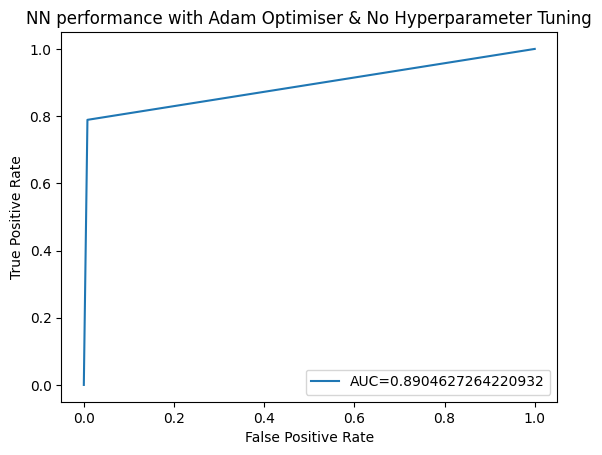

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                     │ (None, 64)                  │           4,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,705 (34.00 KB)

 Trainable params: 8,705 (34.00 KB)

 Non-trainable params: 0 (0.00 B)

142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
RMSProp Optimiser:
Accuracy 0.9788453063023358
Precision: 0.8385964912280702
Recall: 0.8269896193771626
F1 Score: 0.8327526132404182


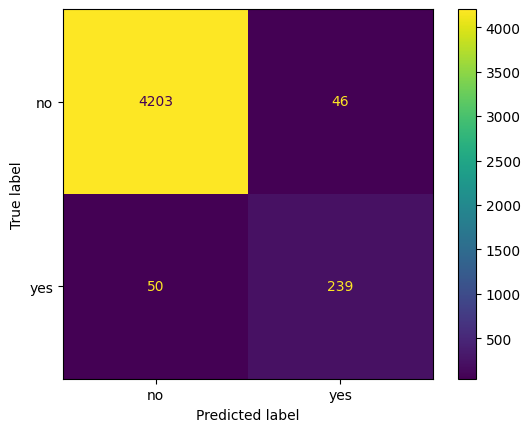

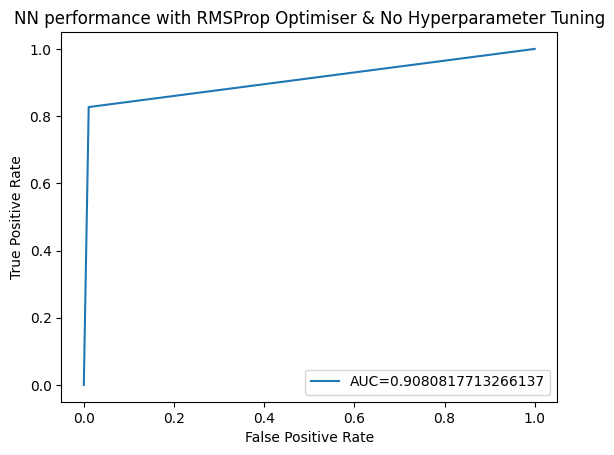

,Optimiser,Accuracy,Precision,Recall,F1 Score
0,Adam,0.979066,0.870229,0.788927,0.827586
1,RMSProp,0.978845,0.838596,0.826990,0.832753


In [65]:
# Train the model with an Adam optimiser.
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
adam_model2 = create_model(optimizer='adam')
adam_model2.summary()
adam_history = adam_model2.fit(X2_train, y2_train, epochs=10, batch_size=16,
                              validation_data=(X2_valid, y2_valid), verbose=0)
y_pred = (adam_model2.predict(X2_test) > 0.5).astype(int)
adam_accuracy = accuracy_score(y2_test, y_pred)
adam_prec = precision_score(y2_test, y_pred)
adam_recall = recall_score(y2_test, y_pred)
adam_f1 = f1_score(y2_test, y_pred)
print('Adam Optimiser:')
print("Accuracy", adam_accuracy)
print('Precision:', adam_prec)
print('Recall:', adam_recall)
print('F1 Score:', adam_f1)

cm = confusion_matrix(y2_test, y_pred)
cfmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["no","yes"])
cfmd.plot()
plt.show()
fpr, tpr, _ = roc_curve(y2_test,  y_pred)
auc = roc_auc_score(y2_test, y_pred)

#create ROC curve
plt.plot(fpr,tpr, label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title("NN performance with Adam Optimiser & No Hyperparameter Tuning")
plt.legend(loc=4)
plt.show()
# Train the model with an RMSProp optimiser.
rmsprop_model2 = create_model(optimizer='rmsprop')
rmsprop_model2.summary()
rmsprop_history = rmsprop_model2.fit(X2_train, y2_train, epochs=10,
                                    batch_size=16,
                                    validation_data=(X2_valid, y2_valid),
                                    verbose=0)
y_pred = (rmsprop_model2.predict(X2_test) > 0.5).astype(int)
rmsprop_accuracy = accuracy_score(y2_test, y_pred)
rmsprop_prec = precision_score(y2_test, y_pred)
rmsprop_recall = recall_score(y2_test, y_pred)
rmsprop_f1 = f1_score(y2_test, y_pred)
print('RMSProp Optimiser:')
print("Accuracy", rmsprop_accuracy)
print('Precision:', rmsprop_prec)
print('Recall:', rmsprop_recall)
print('F1 Score:', rmsprop_f1)

cm = confusion_matrix(y2_test, y_pred)
cfmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["no","yes"])
cfmd.plot()
plt.show()
fpr, tpr, _ = roc_curve(y2_test,  y_pred)
auc = roc_auc_score(y2_test, y_pred)

#create ROC curve
plt.plot(fpr,tpr, label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title("NN performance with RMSProp Optimiser & No Hyperparameter Tuning")
plt.legend(loc=4)
plt.show()
# We convert these results into a dataframe
cmdata = {'Optimiser': ['Adam', 'RMSProp'],
          'Accuracy': [adam_accuracy, rmsprop_accuracy],
          'Precision': [adam_prec, rmsprop_prec],
          'Recall': [adam_recall, rmsprop_recall],
          'F1 Score': [adam_f1, rmsprop_f1]}
cmdf = pd.DataFrame(cmdata)
cmdf

In [66]:
cmdf.to_latex()

'\\begin{tabular}{llrrrr}\n\\toprule\n & Optimiser & Accuracy & Precision & Recall & F1 Score \\\\\n\\midrule\n0 & Adam & 0.979066 & 0.870229 & 0.788927 & 0.827586 \\\\\n1 & RMSProp & 0.978845 & 0.838596 & 0.826990 & 0.832753 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [67]:
# Evaluate the models.
adam_test_loss, adam_test_acc = adam_model2.evaluate(X2_test, y2_test, verbose=0)
rmsprop_test_loss, rmsprop_test_acc = rmsprop_model2.evaluate(X2_test, y2_test, verbose=0)

print('Adam optimizer:')
print('Test loss:', adam_test_loss)
print('Test accuracy:', adam_test_acc)

print('\nRMSprop optimizer:')
print('Test loss:', rmsprop_test_loss)
print('Test accuracy:', rmsprop_test_acc)

adam_train_loss, adam_train_acc = adam_model2.evaluate(X2_train, y2_train, verbose=0)
rmsprop_train_loss, rmsprop_train_acc = rmsprop_model2.evaluate(X2_train, y2_train, verbose=0)

print('\nAdam optimizer:')
print('Training loss:', adam_train_loss)
print('Training accuracy:', adam_train_acc)

print('\nRMSprop optimizer:')
print('Training loss:', rmsprop_train_loss)
print('Training accuracy:', rmsprop_train_acc)

adam_valid_loss, adam_valid_acc = adam_model2.evaluate(X2_valid, y2_valid, verbose=0)
rmsprop_valid_loss, rmsprop_valid_acc = rmsprop_model2.evaluate(X2_valid, y2_valid, verbose=0)

print('\nAdam optimizer:')
print('Validation loss:', adam_valid_loss)
print('Validation accuracy:', adam_valid_acc)

print('\nRMSprop optimizer:')
print('Validation loss:', rmsprop_valid_loss)
print('Validation accuracy:', rmsprop_valid_acc)

Adam optimizer:
Test loss: 0.05228706821799278
Test accuracy: 0.9790656566619873

RMSprop optimizer:
Test loss: 0.055657994002103806
Test accuracy: 0.9788452982902527

Adam optimizer:
Training loss: 0.04356974735856056
Training accuracy: 0.9819996356964111

RMSprop optimizer:
Training loss: 0.049106255173683167
Training accuracy: 0.981509804725647

Adam optimizer:
Validation loss: 0.06398973613977432
Validation accuracy: 0.9779614210128784

RMSprop optimizer:
Validation loss: 0.0758097767829895
Validation accuracy: 0.9785124063491821


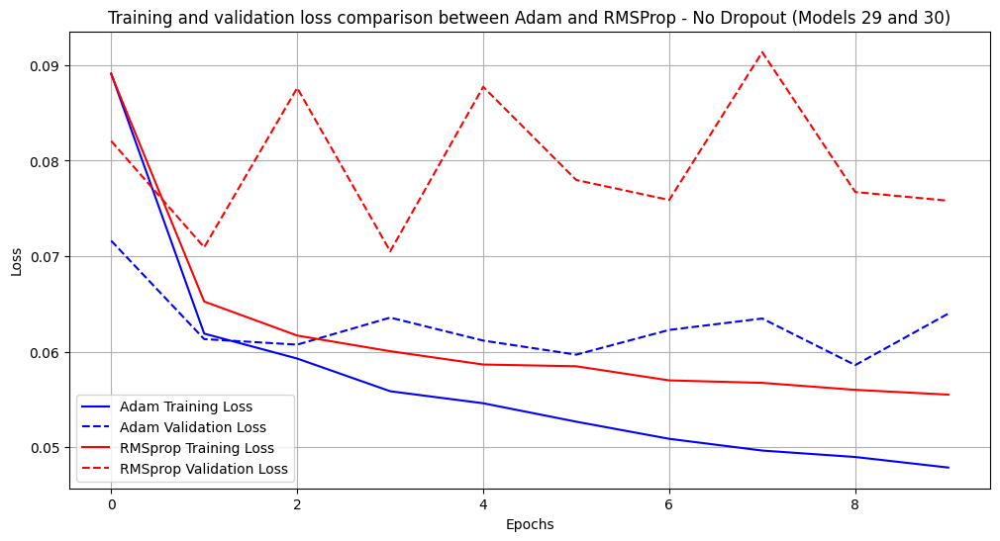

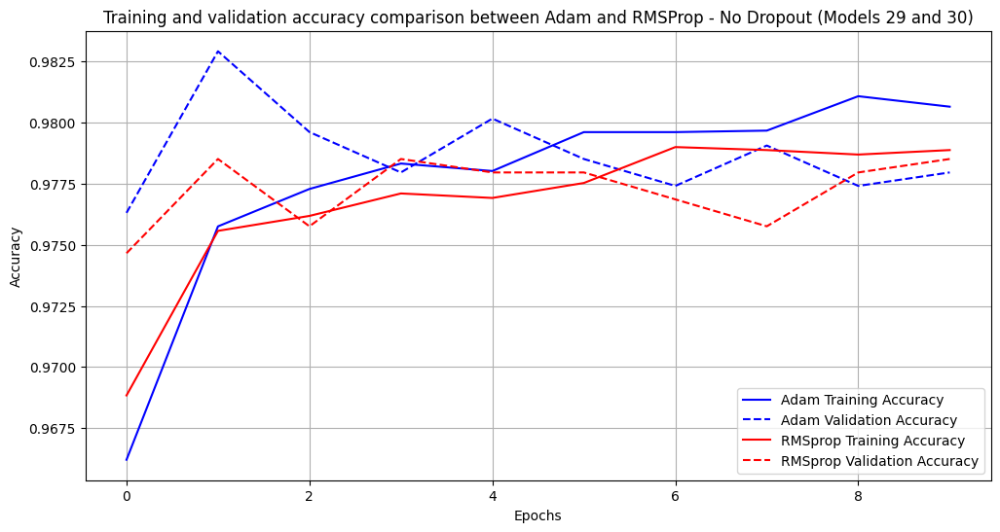

In [69]:
# Import Matplotlib for visualisation.
import matplotlib.pyplot as plt

# Plot loss
plt.figure(figsize=(12, 6))
plt.plot(adam_history.history['loss'], label='Adam Training Loss', color='blue')
plt.plot(adam_history.history['val_loss'], label='Adam Validation Loss', color='blue', linestyle='--')
plt.plot(rmsprop_history.history['loss'], label='RMSprop Training Loss', color='red')
plt.plot(rmsprop_history.history['val_loss'], label='RMSprop Validation Loss', color='red', linestyle='--')
plt.title('Training and validation loss comparison between Adam and RMSProp - No Dropout (Models 29 and 30)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()
#plt.savefig("AddedFeatures_Loss_NoDropout.jpg")
#files.download("AddedFeatures_Loss_NoDropout.jpg")

# Plot accuracy.
plt.figure(figsize=(12, 6))
plt.plot(adam_history.history['accuracy'], label='Adam Training Accuracy', color='blue')
plt.plot(adam_history.history['val_accuracy'], label='Adam Validation Accuracy', color='blue', linestyle='--')
plt.plot(rmsprop_history.history['accuracy'], label='RMSprop Training Accuracy', color='red')
plt.plot(rmsprop_history.history['val_accuracy'], label='RMSprop Validation Accuracy', color='red', linestyle='--')
plt.title('Training and validation accuracy comparison between Adam and RMSProp - No Dropout (Models 29 and 30)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()
#plt.savefig("AddedFeatures_Acc_NoDropout.jpg")
#files.download("AddedFeatures_Acc_NoDropout.jpg")

# Model Configurations with Adam Optimiser & Hyperparameter Tuning

In [70]:
from sklearn.metrics import accuracy_score, precision_score
from sklearn.metrics import recall_score, f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, roc_auc_score
from keras import metrics
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping
from keras.regularizers import l2

In [71]:
# Define neural network models of different complexities.
def create_model4(optimiser='Adam', num_hidden_layers=1, num_neurons=64,
                  regularization=None):
    model = Sequential()
    model.add(Dense(64, activation='relu', input_shape=(X2_train.shape[1],),
              kernel_regularizer=l2(regularization) if regularization else None))
    for _ in range(num_hidden_layers):
        model.add(Dense(num_neurons, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer=optimiser,
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    return model

# Define model configurations.
adam_model_configs = [
    {"optimiser":'Adam', "num_hidden_layers":1, "num_neurons": 1, "regularization":0.005},
    {"optimiser":'Adam', "num_hidden_layers":1, "num_neurons": 1, "regularization":0.01},
    {"optimiser":'Adam', "num_hidden_layers":1, "num_neurons": 1, "regularization":0.05},
    {"optimiser":'Adam', "num_hidden_layers":1, "num_neurons": 32, "regularization":0.005},
    {"optimiser":'Adam', "num_hidden_layers":1, "num_neurons": 32, "regularization":0.01},
    {"optimiser":'Adam', "num_hidden_layers":1, "num_neurons": 32, "regularization":0.05},
    {"optimiser":'Adam', "num_hidden_layers":2, "num_neurons": 64, "regularization":0.005},
    {"optimiser":'Adam', "num_hidden_layers":2, "num_neurons": 64, "regularization":0.01},
    {"optimiser":'Adam', "num_hidden_layers":2, "num_neurons": 64, "regularization":0.05},
    {"optimiser":'Adam', "num_hidden_layers":3, "num_neurons": 128, "regularization":0.005},
    {"optimiser":'Adam', "num_hidden_layers":3, "num_neurons": 128, "regularization":0.01},
    {"optimiser":'Adam', "num_hidden_layers":3, "num_neurons": 128, "regularization":0.05}
]

{'optimiser': 'Adam', 'num_hidden_layers': 1, 'num_neurons': 1, 'regularization': 0.005}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9401 - loss: 0.4215 - val_accuracy: 0.9345 - val_loss: 0.1406
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9443 - loss: 0.1263 - val_accuracy: 0.9774 - val_loss: 0.1062
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9729 - loss: 0.0993 - val_accuracy: 0.9749 - val_loss: 0.0950
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9730 - loss: 0.0918 - val_accuracy: 0.9792 - val_loss: 0.0870
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9756 - loss: 0.0809 - val_accuracy: 0.9780 - val_loss: 0.0824
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9747 - loss: 0.0834 - val_accuracy: 0.9767 - val_loss: 0.0823
Epoch 7/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9733 - loss: 0.0840 - val_accuracy: 0.9761 - val_loss: 0.0790
Epoch 8/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9780 - loss: 0.0714 - val_accuracy: 0.9774 - val_

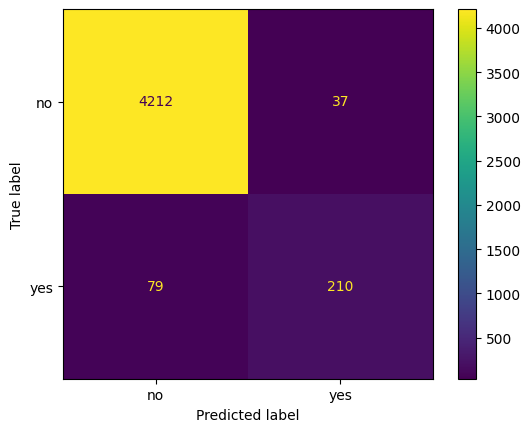

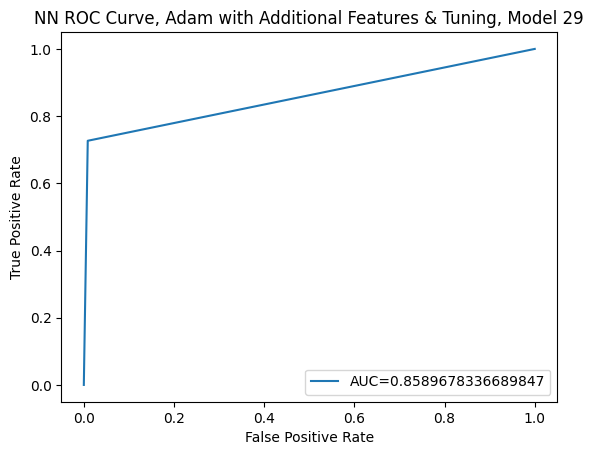

{'optimiser': 'Adam', 'num_hidden_layers': 1, 'num_neurons': 1, 'regularization': 0.01}
Epoch 1/50


<ipython-input-72-520884f8adaa>:46: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  adam_cmdf = pd.concat([adam_cmdf, pd.DataFrame([new_row])])
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9143 - loss: 0.9263 - val_accuracy: 0.9345 - val_loss: 0.5325
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9360 - loss: 0.5005 - val_accuracy: 0.9345 - val_loss: 0.4234
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9380 - loss: 0.4009 - val_accuracy: 0.9345 - val_loss: 0.3548
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9358 - loss: 0.3410 - val_accuracy: 0.9345 - val_loss: 0.3110
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9371 - loss: 0.2994 - val_accuracy: 0.9345 - val_loss: 0.2832
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9382 - loss: 0.2721 - val_accuracy: 0.9345 - val_loss: 0.2657
Epoch 7/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9359 - loss: 0.2601 - val_accuracy: 0.9345 - val_loss: 0.2549
Epoch 8/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9325 - loss: 0.2573 - val_accuracy: 0.9345 - val_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


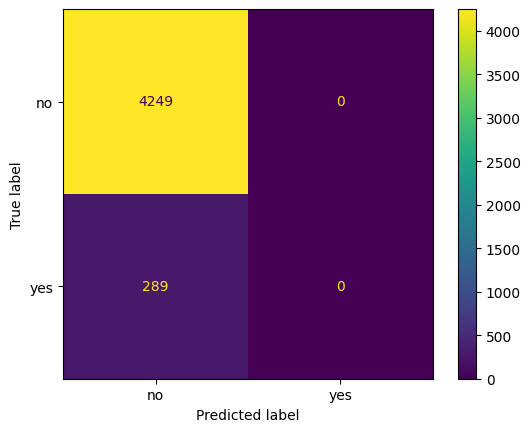

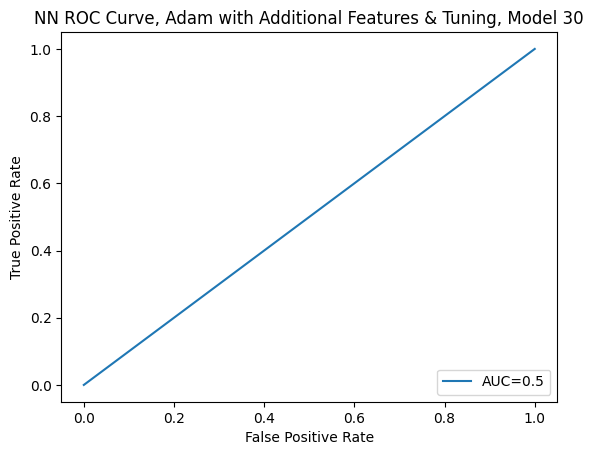

{'optimiser': 'Adam', 'num_hidden_layers': 1, 'num_neurons': 1, 'regularization': 0.05}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8901 - loss: 1.8489 - val_accuracy: 0.9345 - val_loss: 0.5303
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9394 - loss: 0.4975 - val_accuracy: 0.9345 - val_loss: 0.4233
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9388 - loss: 0.4004 - val_accuracy: 0.9345 - val_loss: 0.3547
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9361 - loss: 0.3403 - val_accuracy: 0.9345 - val_loss: 0.3109
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9414 - loss: 0.2930 - val_accuracy: 0.9345 - val_loss: 0.2832
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9410 - loss: 0.2673 - val_accuracy: 0.9345 - val_loss: 0.2658
Epoch 7/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9418 - loss: 0.2488 - val_accuracy: 0.9345 - val_loss: 0.2551
Epoch 8/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9353 - loss: 0.2517 - val_accuracy: 0.9345 - val_

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Adam Optimiser:
Accuracy 0.9363155575143235
Precision: 0.0
Recall: 0.0
F1 Score: 0.0


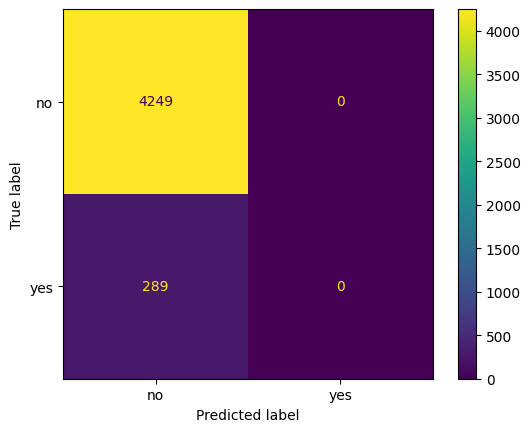

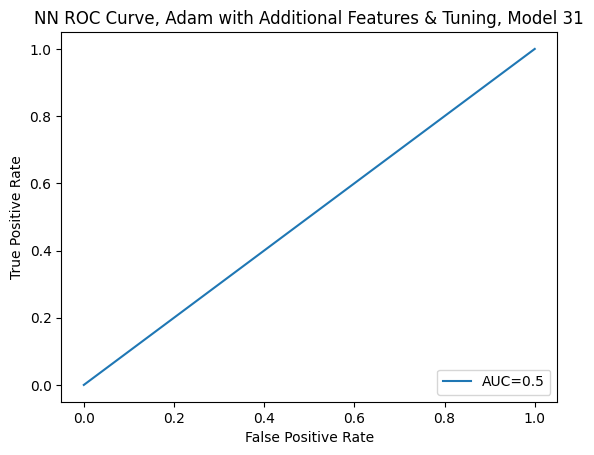

{'optimiser': 'Adam', 'num_hidden_layers': 1, 'num_neurons': 32, 'regularization': 0.005}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.9304 - loss: 0.4161 - val_accuracy: 0.9761 - val_loss: 0.1195
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9769 - loss: 0.1051 - val_accuracy: 0.9774 - val_loss: 0.0864
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9745 - loss: 0.0857 - val_accuracy: 0.9780 - val_loss: 0.0786
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9745 - loss: 0.0747 - val_accuracy: 0.9761 - val_loss: 0.0770
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9743 - loss: 0.0740 - val_accuracy: 0.9786 - val_loss: 0.0695
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9766 - loss: 0.0666 - val_accuracy: 0.9792 - val_loss: 0.0701
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9777 - loss: 0.0675
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9752 - loss: 0.0721
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Adam Optimiser:
Accuracy 0.9766416923754958
Precisio

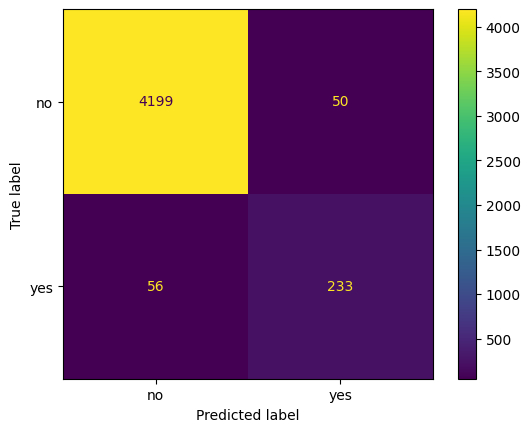

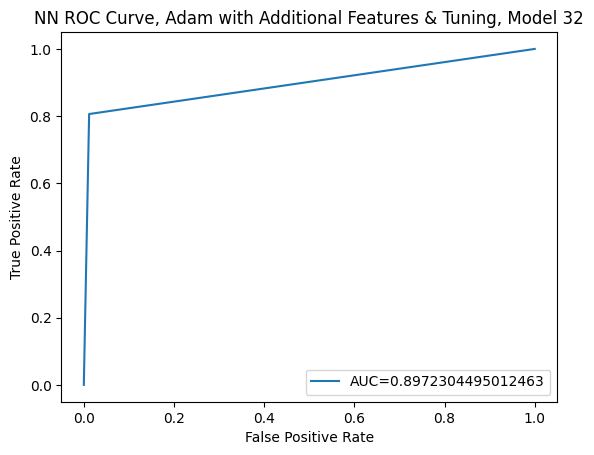

{'optimiser': 'Adam', 'num_hidden_layers': 1, 'num_neurons': 32, 'regularization': 0.01}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8821 - loss: 0.6376 - val_accuracy: 0.9774 - val_loss: 0.1172
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9748 - loss: 0.1067 - val_accuracy: 0.9786 - val_loss: 0.0814
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9748 - loss: 0.0812 - val_accuracy: 0.9761 - val_loss: 0.0834
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9753 - loss: 0.0814
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9763 - loss: 0.0766
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Adam Optimiser:
Accuracy 0.9773027765535478
Precision: 0.8321428571428572
Recall: 0.8062283737024222
F1 Score: 0.8189806678383128


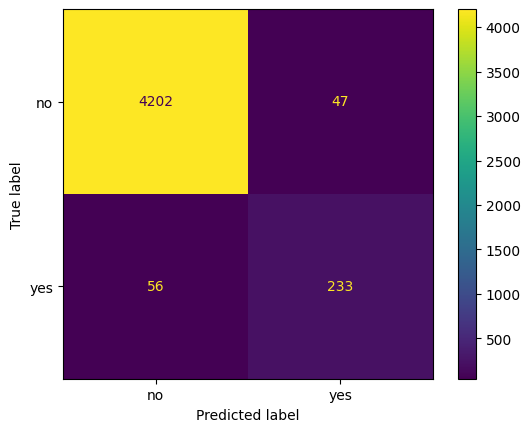

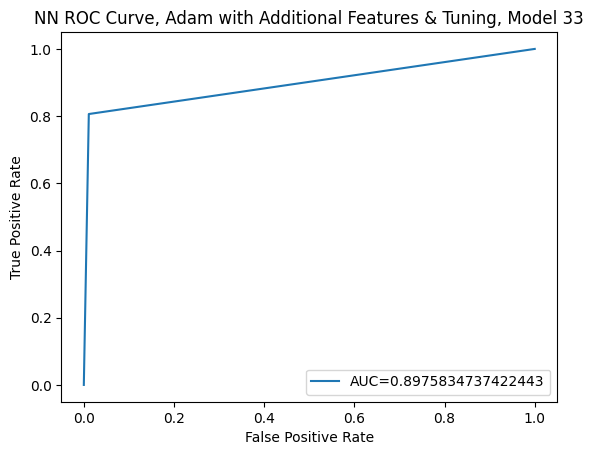

{'optimiser': 'Adam', 'num_hidden_layers': 1, 'num_neurons': 32, 'regularization': 0.05}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8926 - loss: 1.5522 - val_accuracy: 0.9651 - val_loss: 0.1015
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9714 - loss: 0.0966 - val_accuracy: 0.9743 - val_loss: 0.0878
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9728 - loss: 0.0836 - val_accuracy: 0.9651 - val_loss: 0.0952
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9736 - loss: 0.0820
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9748 - loss: 0.0772
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Adam Optimiser:
Accuracy 0.9757602468047598
Precision: 0.8403041825095057
Recall: 0.7647058823529411
F1 Score: 0.8007246376811594


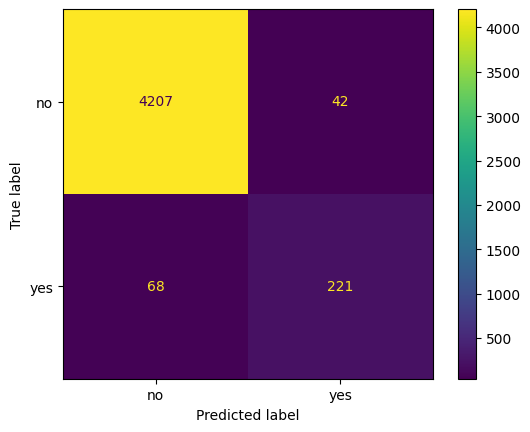

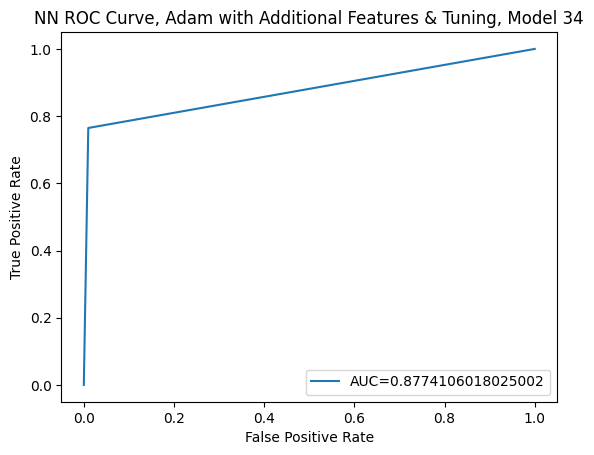

{'optimiser': 'Adam', 'num_hidden_layers': 2, 'num_neurons': 64, 'regularization': 0.005}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.9505 - loss: 0.3485 - val_accuracy: 0.9700 - val_loss: 0.1225
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9767 - loss: 0.1002 - val_accuracy: 0.9774 - val_loss: 0.0857
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9767 - loss: 0.0847 - val_accuracy: 0.9774 - val_loss: 0.0812
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9745 - loss: 0.0789 - val_accuracy: 0.9780 - val_loss: 0.0750
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9773 - loss: 0.0704 - val_accuracy: 0.9810 - val_loss: 0.0726
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9774 - loss: 0.0662 - val_accuracy: 0.9774 - val_loss: 0.0762
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9779 - loss: 0.0646
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9770 - loss: 0.0674
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Adam Optimiser:
Accuracy 0.9792860290877038
Precisio

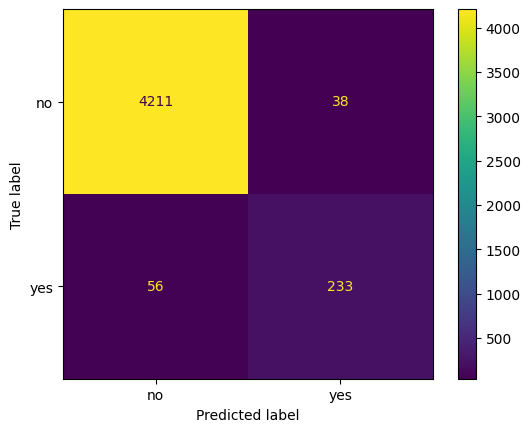

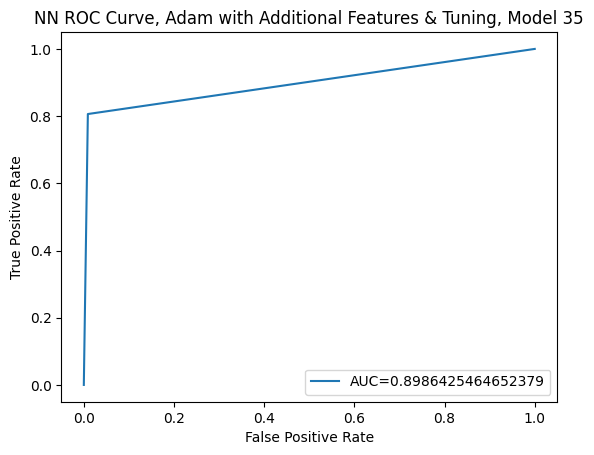

{'optimiser': 'Adam', 'num_hidden_layers': 2, 'num_neurons': 64, 'regularization': 0.01}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9323 - loss: 0.4965 - val_accuracy: 0.9786 - val_loss: 0.1048
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9727 - loss: 0.1006 - val_accuracy: 0.9798 - val_loss: 0.0821
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9717 - loss: 0.0876 - val_accuracy: 0.9749 - val_loss: 0.0848
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9762 - loss: 0.0782
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9765 - loss: 0.0793
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Adam Optimiser:
Accuracy 0.9773027765535478
Precision: 0.8229166666666666
Recall: 0.8200692041522492
F1 Score: 0.8214904679376083


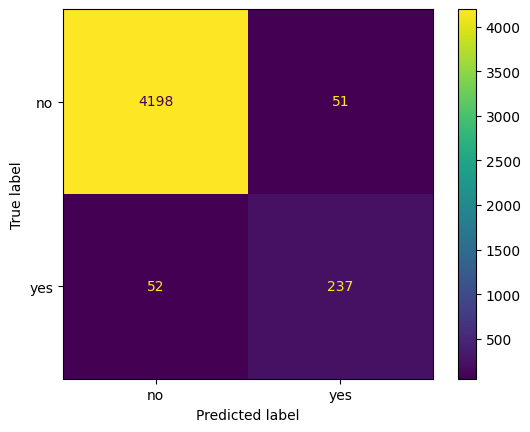

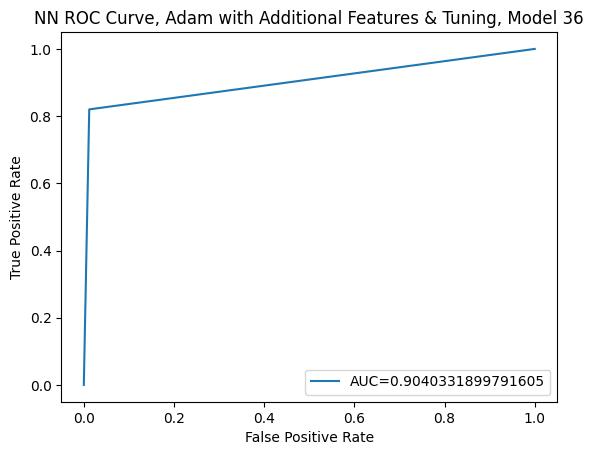

{'optimiser': 'Adam', 'num_hidden_layers': 2, 'num_neurons': 64, 'regularization': 0.05}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9410 - loss: 1.4388 - val_accuracy: 0.9682 - val_loss: 0.0997
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9724 - loss: 0.0926 - val_accuracy: 0.9663 - val_loss: 0.0901
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9724 - loss: 0.0845 - val_accuracy: 0.9786 - val_loss: 0.0767
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9742 - loss: 0.0796 - val_accuracy: 0.9767 - val_loss: 0.0746
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9738 - loss: 0.0758 - val_accuracy: 0.9725 - val_loss: 0.0750
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9758 - loss: 0.0744
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9747 - loss: 0.0693
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Adam Optimiser:
Accuracy 0.9766416923754958
Precision: 0.8401486988847584
Recall: 0.7820069204152249
F1 Score: 0.8100358422939068


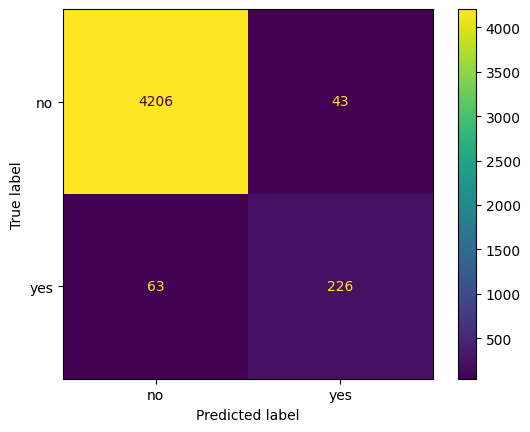

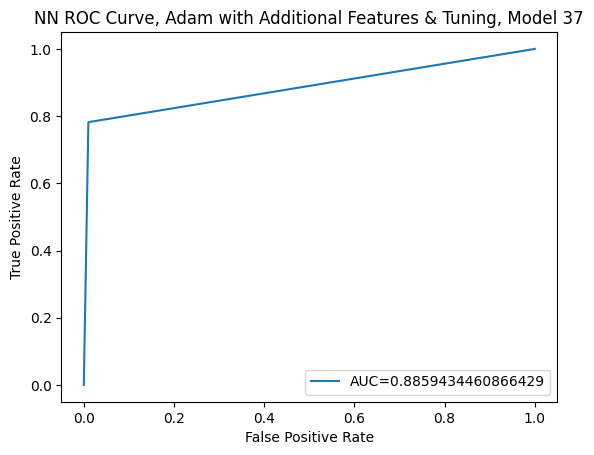

{'optimiser': 'Adam', 'num_hidden_layers': 3, 'num_neurons': 128, 'regularization': 0.005}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9437 - loss: 0.3340 - val_accuracy: 0.9725 - val_loss: 0.1148
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9749 - loss: 0.1040 - val_accuracy: 0.9816 - val_loss: 0.0895
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9762 - loss: 0.0847 - val_accuracy: 0.9767 - val_loss: 0.0848
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9771 - loss: 0.0770 - val_accuracy: 0.9792 - val_loss: 0.0797
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9779 - loss: 0.0693 - val_accuracy: 0.9743 - val_loss: 0.0870
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9765 - loss: 0.0708
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9754 - loss: 0.0734
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Adam Optimiser:
Accuracy 0.9770824151608638
Precision: 0.8135593220338984
Recall: 0.8304498269896193
F1 Score: 0.821917808219178


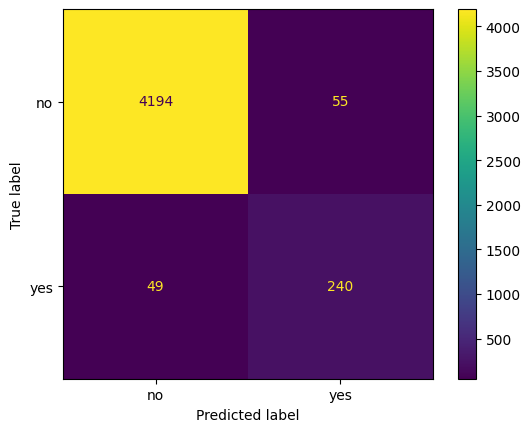

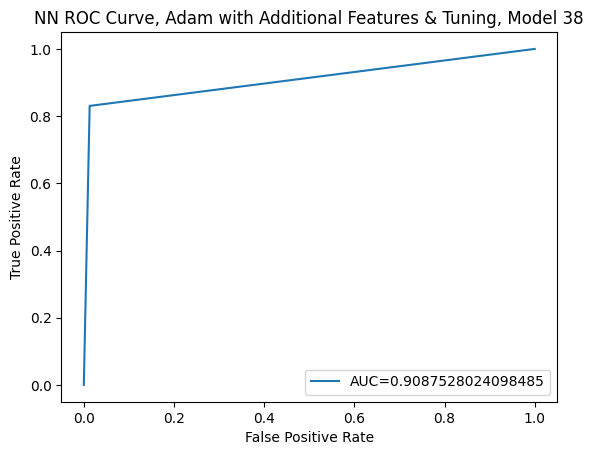

{'optimiser': 'Adam', 'num_hidden_layers': 3, 'num_neurons': 128, 'regularization': 0.01}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9501 - loss: 0.4471 - val_accuracy: 0.9731 - val_loss: 0.1198
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9717 - loss: 0.1070 - val_accuracy: 0.9725 - val_loss: 0.1045
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9754 - loss: 0.0809 - val_accuracy: 0.9743 - val_loss: 0.0822
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9754 - loss: 0.0778 - val_accuracy: 0.9761 - val_loss: 0.0753
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9787 - loss: 0.0712 - val_accuracy: 0.9804 - val_loss: 0.0716
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9753 - loss: 0.0703 - val_accuracy: 0.9761 - val_loss: 0.0785
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9769 - loss: 0.0669
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9750 - loss: 0.0695
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Adam Optimiser:
Accuracy 0.9773027765535478
Precisio

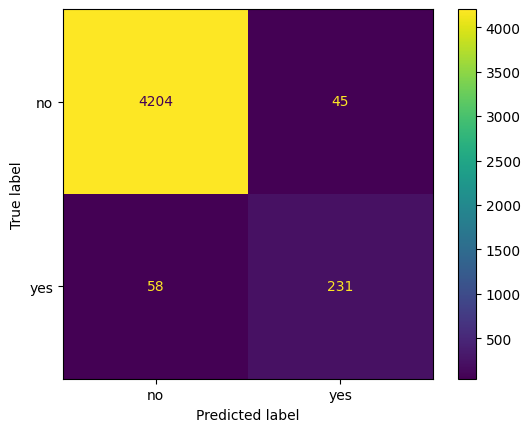

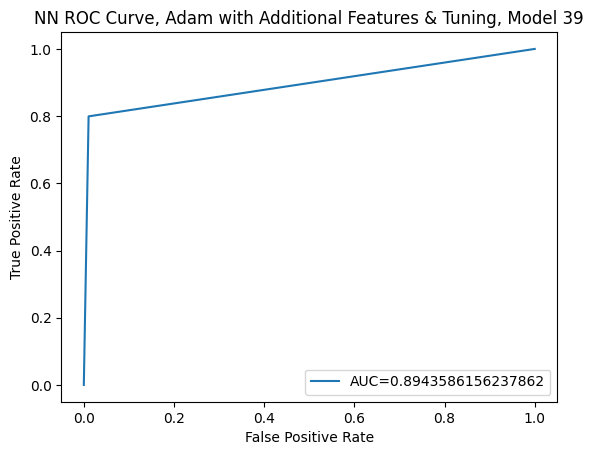

{'optimiser': 'Adam', 'num_hidden_layers': 3, 'num_neurons': 128, 'regularization': 0.05}


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.9512 - loss: 1.3551 - val_accuracy: 0.9743 - val_loss: 0.1038
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9744 - loss: 0.0920 - val_accuracy: 0.9627 - val_loss: 0.1052
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9731 - loss: 0.1034
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9753 - loss: 0.1008
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Adam Optimiser:
Accuracy 0.9731159100925518
Precision: 0.8199233716475096
Recall: 0.740484429065744
F1 Score: 0.7781818181818182


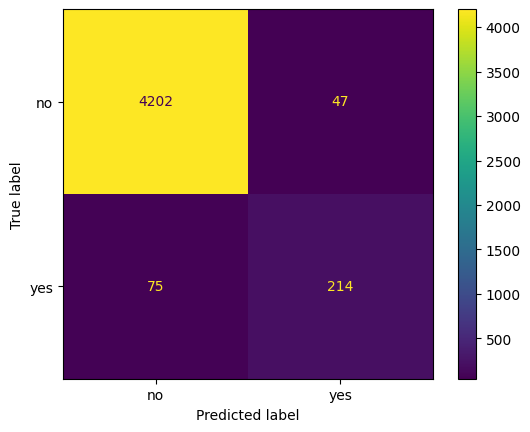

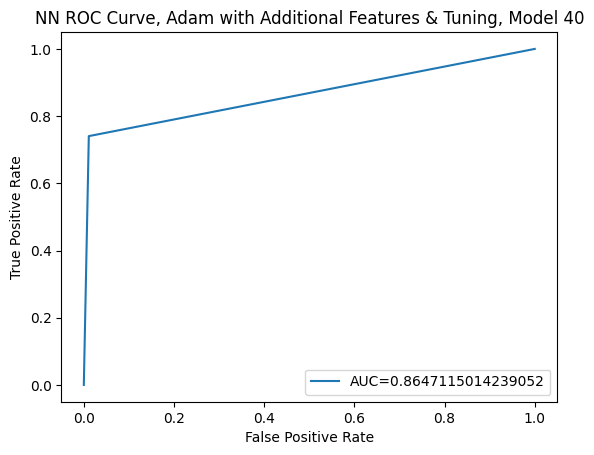

In [72]:
adam_cmdf = pd.DataFrame(columns=['Optimiser', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])
# Train and evaluate each model.
adam_results = []
count = 29
for config in adam_model_configs:
    print(config)
    model1 = create_model4(**config)
    early_stopping_callback = EarlyStopping(monitor='val_loss', patience=1,
                                            restore_best_weights=True)
    history = model1.fit(X2_train, y2_train, epochs=50, batch_size=32,
                        validation_split=0.1,  verbose=1,
                        callbacks=[early_stopping_callback])
    train_loss, train_accuracy = model1.evaluate(X2_train, y2_train, verbose=1)
    test_loss, test_accuracy = model1.evaluate(X2_test, y2_test, verbose=1)

    y_pred = (model1.predict(X2_test) > 0.5).astype(int)
    adam_accuracy = accuracy_score(y2_test, y_pred)
    adam_prec = precision_score(y2_test, y_pred)
    adam_recall = recall_score(y2_test, y_pred)
    adam_f1 = f1_score(y2_test, y_pred)
    print('Adam Optimiser:')
    print("Accuracy", adam_accuracy)
    print('Precision:', adam_prec)
    print('Recall:', adam_recall)
    print('F1 Score:', adam_f1)

    cm = confusion_matrix(y2_test, y_pred)
    cfmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["no","yes"])
    cfmd.plot()
    plt.show()
    fpr, tpr, _ = roc_curve(y2_test,  y_pred)
    auc = roc_auc_score(y2_test, y_pred)

    #create ROC curve
    plt.plot(fpr,tpr, label="AUC="+str(auc))
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.title("NN ROC Curve, Adam with Additional Features & Tuning, Model "+str(count))
    plt.legend(loc=4)
    plt.show()
    new_row = {'Optimiser': 'Adam',
               'Accuracy': adam_accuracy,
               'Precision': adam_prec,
               'Recall': adam_recall,
               'F1 Score': adam_f1}
    adam_cmdf = pd.concat([adam_cmdf, pd.DataFrame([new_row])])
    adam_cmdf = adam_cmdf.reset_index(drop=True)
    adam_results.append({
        "config": config,
        "train_loss": train_loss,
        "train_accuracy": train_accuracy,
        "test_loss": test_loss,
        "test_accuracy": test_accuracy,
        "history": history
    })
    count += 1

In [73]:
adam_cmdf

,Optimiser,Accuracy,Precision,Recall,F1 Score
0,Adam,0.974438,0.850202,0.726644,0.783582
1,Adam,0.936316,0.000000,0.000000,0.000000
2,Adam,0.936316,0.000000,0.000000,0.000000
3,Adam,0.976642,0.823322,0.806228,0.814685
4,Adam,0.977303,0.832143,0.806228,0.818981
5,Adam,0.975760,0.840304,0.764706,0.800725
6,Adam,0.979286,0.859779,0.806228,0.832143
7,Adam,0.977303,0.822917,0.820069,0.821490
8,Adam,0.976642,0.840149,0.782007,0.810036
9,Adam,0.977082,0.813559,0.830450,0.821918


In [74]:
adam_cmdf.to_latex()

'\\begin{tabular}{llrrrr}\n\\toprule\n & Optimiser & Accuracy & Precision & Recall & F1 Score \\\\\n\\midrule\n0 & Adam & 0.974438 & 0.850202 & 0.726644 & 0.783582 \\\\\n1 & Adam & 0.936316 & 0.000000 & 0.000000 & 0.000000 \\\\\n2 & Adam & 0.936316 & 0.000000 & 0.000000 & 0.000000 \\\\\n3 & Adam & 0.976642 & 0.823322 & 0.806228 & 0.814685 \\\\\n4 & Adam & 0.977303 & 0.832143 & 0.806228 & 0.818981 \\\\\n5 & Adam & 0.975760 & 0.840304 & 0.764706 & 0.800725 \\\\\n6 & Adam & 0.979286 & 0.859779 & 0.806228 & 0.832143 \\\\\n7 & Adam & 0.977303 & 0.822917 & 0.820069 & 0.821490 \\\\\n8 & Adam & 0.976642 & 0.840149 & 0.782007 & 0.810036 \\\\\n9 & Adam & 0.977082 & 0.813559 & 0.830450 & 0.821918 \\\\\n10 & Adam & 0.977303 & 0.836957 & 0.799308 & 0.817699 \\\\\n11 & Adam & 0.973116 & 0.819923 & 0.740484 & 0.778182 \\\\\n\\bottomrule\n\\end{tabular}\n'

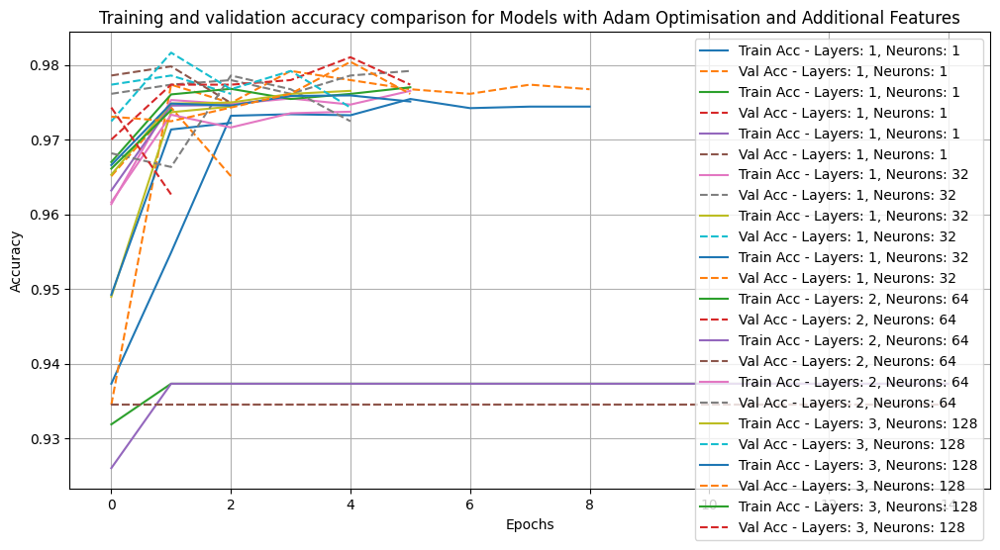

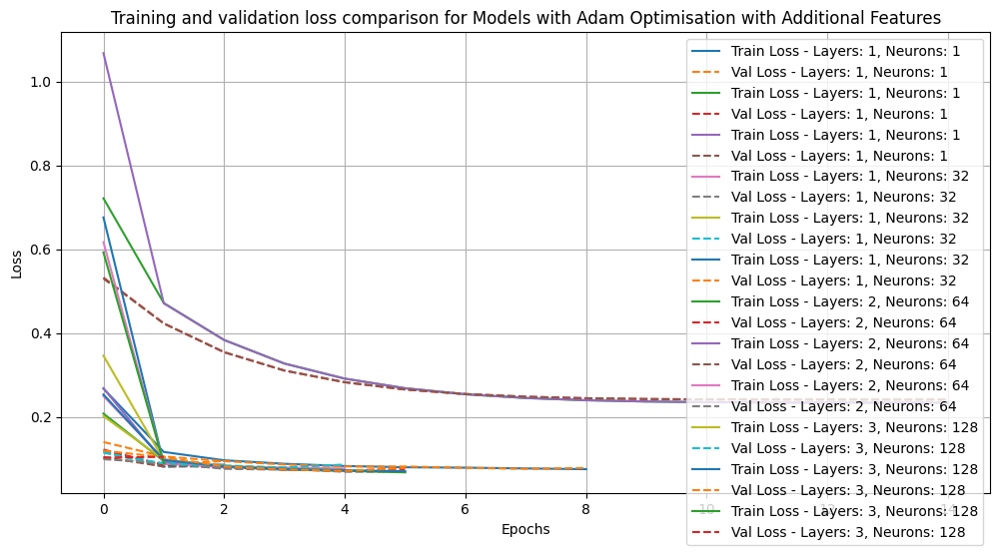

In [77]:
# Plot train/validation accuracy.
plt.figure(figsize=(12, 6))
for result in adam_results:
    config_str = f"Layers: {result['config']['num_hidden_layers']}, Neurons: {result['config']['num_neurons']}"
    plt.plot(result['history'].history['accuracy'], label=f"Train Acc - {config_str}")
    plt.plot(result['history'].history['val_accuracy'], linestyle='--', label=f"Val Acc - {config_str}")
plt.title('Training and validation accuracy comparison for Models with Adam Optimisation and Additional Features')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()
#plt.savefig("AddedFeatures_Acc_AdamMulticonfigs.jpg")
#files.download("AddedFeatures_Acc_AdamMulticonfigs.jpg")

# Plot train/validation loss.
plt.figure(figsize=(12, 6))
for result in adam_results:
    config_str = f"Layers: {result['config']['num_hidden_layers']}, Neurons: {result['config']['num_neurons']}"
    plt.plot(result['history'].history['loss'], label=f"Train Loss - {config_str}")
    plt.plot(result['history'].history['val_loss'], linestyle='--', label=f"Val Loss - {config_str}")
plt.title('Training and validation loss comparison for Models with Adam Optimisation with Additional Features')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()
#plt.savefig("AddedFeatures_Loss_AdamMulticonfigs.jpg")
#files.download("AddedFeatures_Loss_AdamMulticonfigs.jpg")

# Model Configurations with RMSProp Optimiser & Hyperparameter Tuning

{'optimiser': 'RMSProp', 'num_hidden_layers': 1, 'num_neurons': 1, 'regularization': 0.005}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9390 - loss: 0.3898 - val_accuracy: 0.9345 - val_loss: 0.1257
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9471 - loss: 0.1191 - val_accuracy: 0.9737 - val_loss: 0.1070
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9749 - loss: 0.0995 - val_accuracy: 0.9767 - val_loss: 0.0995
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9749 - loss: 0.0962 - val_accuracy: 0.9743 - val_loss: 0.0991
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9753 - loss: 0.0924 - val_accuracy: 0.9767 - val_loss: 0.0950
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9737 - loss: 0.0965 - val_accuracy: 0.9767 - val_loss: 0.0920
Epoch 7/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9768 - loss: 0.0912 - val_accuracy: 0.9731 - val_loss: 0.0939
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9770 - loss: 0.0892
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

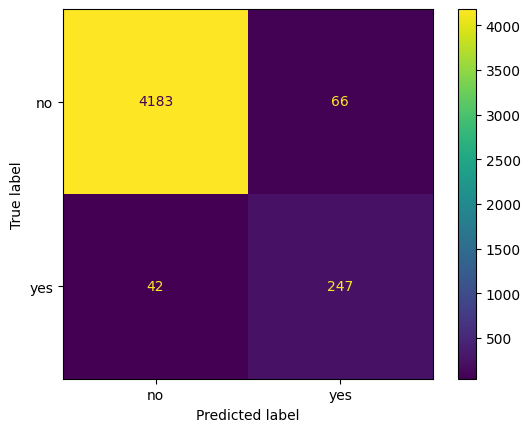

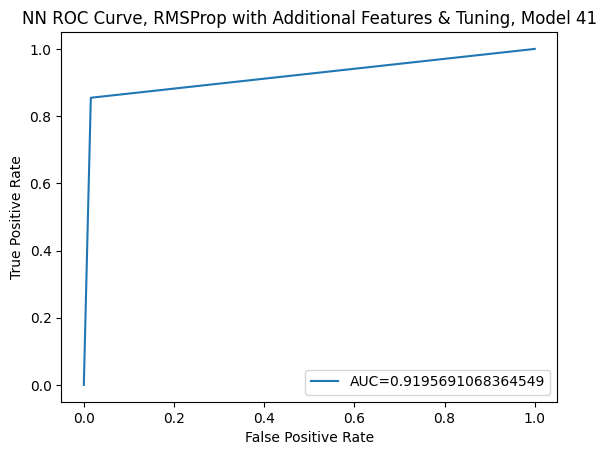

{'optimiser': 'RMSProp', 'num_hidden_layers': 1, 'num_neurons': 1, 'regularization': 0.01}
Epoch 1/50


<ipython-input-78-b2e729d49dce>:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  rmsprop_cmdf = pd.concat([rmsprop_cmdf, pd.DataFrame([new_row])])
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9394 - loss: 0.4660 - val_accuracy: 0.9645 - val_loss: 0.1286
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9724 - loss: 0.1164 - val_accuracy: 0.9676 - val_loss: 0.0991
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9740 - loss: 0.0953 - val_accuracy: 0.9792 - val_loss: 0.0966
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9730 - loss: 0.0937 - val_accuracy: 0.9737 - val_loss: 0.0937
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9738 - loss: 0.0907 - val_accuracy: 0.9755 - val_loss: 0.0928
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9740 - loss: 0.0905 - val_accuracy: 0.9749 - val_loss: 0.0955
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9742 - loss: 0.0894
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9738 - loss: 0.0861
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
RMSProp Optimiser:
Accuracy 0.9757602468047598
Preci

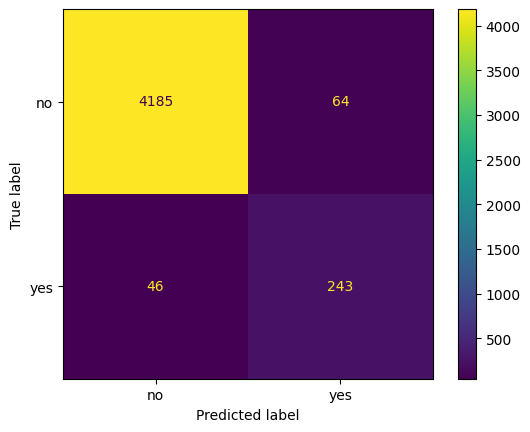

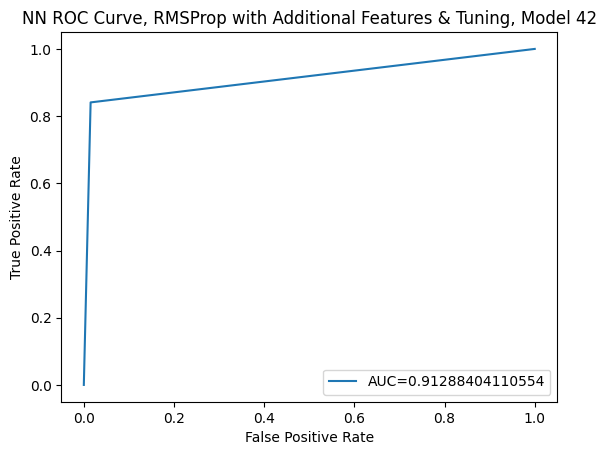

{'optimiser': 'RMSProp', 'num_hidden_layers': 1, 'num_neurons': 1, 'regularization': 0.05}


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9361 - loss: 1.3473 - val_accuracy: 0.9345 - val_loss: 0.1054
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9455 - loss: 0.1092 - val_accuracy: 0.9767 - val_loss: 0.0989
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9713 - loss: 0.0997 - val_accuracy: 0.9731 - val_loss: 0.1007
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9718 - loss: 0.1002
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9740 - loss: 0.0939
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
RMSProp Optimiser:
Accuracy 0.9711326575583957
Precision: 0.8062015503875969
Recall: 0.7197231833910035
F1 Score: 0.7605118829981719


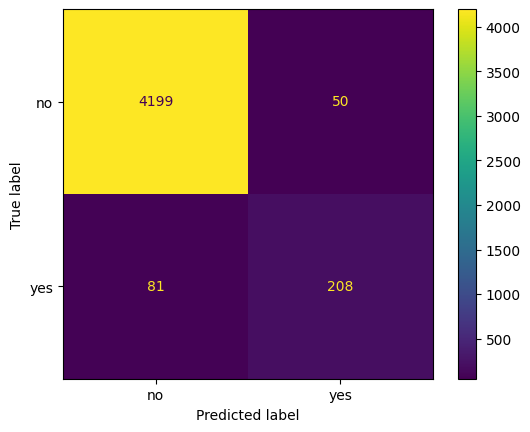

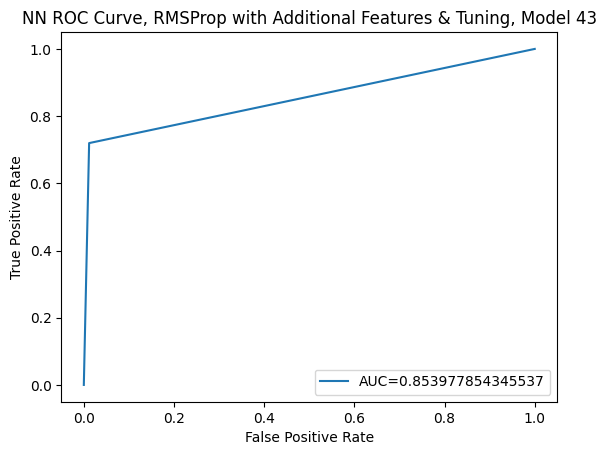

{'optimiser': 'RMSProp', 'num_hidden_layers': 1, 'num_neurons': 32, 'regularization': 0.005}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9486 - loss: 0.3366 - val_accuracy: 0.9767 - val_loss: 0.1039
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9762 - loss: 0.0968 - val_accuracy: 0.9761 - val_loss: 0.0905
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9767 - loss: 0.0833 - val_accuracy: 0.9774 - val_loss: 0.0851
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9756 - loss: 0.0875 - val_accuracy: 0.9755 - val_loss: 0.0844
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9764 - loss: 0.0788 - val_accuracy: 0.9774 - val_loss: 0.0794
Epoch 6/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9769 - loss: 0.0773 - val_accuracy: 0.9761 - val_loss: 0.0853
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9754 - loss: 0.0793
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9737 - loss: 0.0811
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
RMSProp Optimiser:
Accuracy 0.9755398854120758
Preci

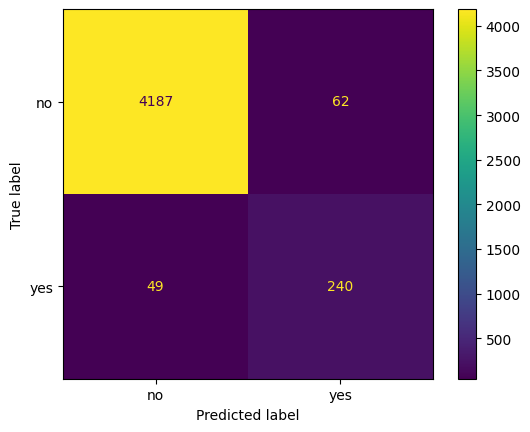

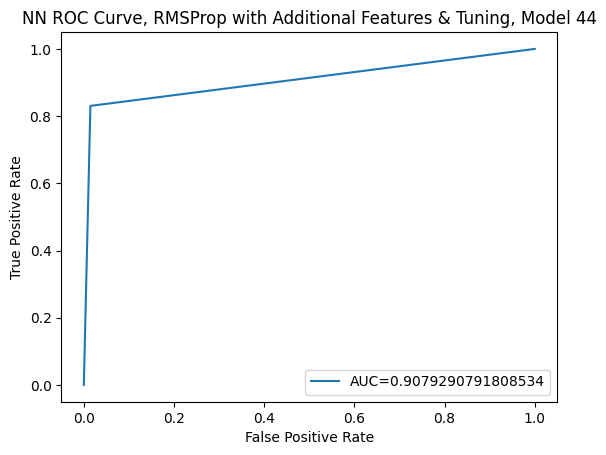

{'optimiser': 'RMSProp', 'num_hidden_layers': 1, 'num_neurons': 32, 'regularization': 0.01}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9558 - loss: 0.4463 - val_accuracy: 0.9767 - val_loss: 0.1047
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9742 - loss: 0.0989 - val_accuracy: 0.9774 - val_loss: 0.0886
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9752 - loss: 0.0864 - val_accuracy: 0.9755 - val_loss: 0.0885
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9777 - loss: 0.0773 - val_accuracy: 0.9774 - val_loss: 0.0837
Epoch 5/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9757 - loss: 0.0797 - val_accuracy: 0.9792 - val_loss: 0.0862
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9767 - loss: 0.0784
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9780 - loss: 0.0738
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
RMSProp Optimiser:
Accuracy 0.9790656676950198
Precision: 0.8415492957746479
Recall: 0.8269896193771626
F1 Score: 0.8342059336823735


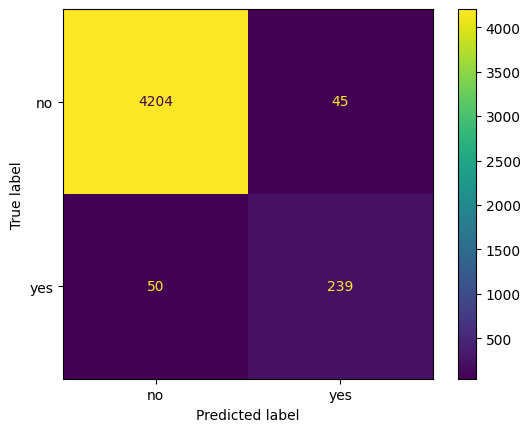

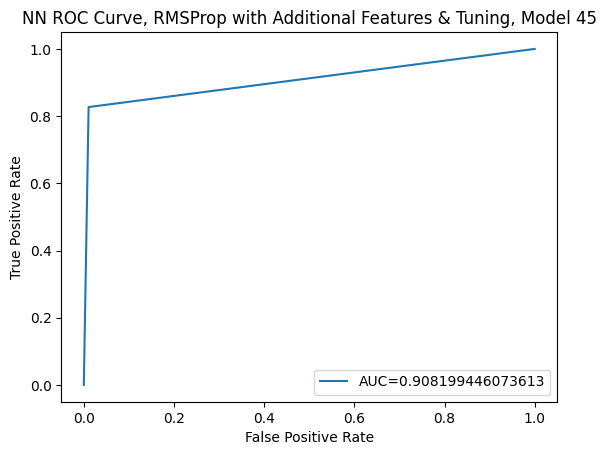

{'optimiser': 'RMSProp', 'num_hidden_layers': 1, 'num_neurons': 32, 'regularization': 0.05}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9425 - loss: 1.2676 - val_accuracy: 0.9725 - val_loss: 0.0951
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9738 - loss: 0.0876 - val_accuracy: 0.9737 - val_loss: 0.0845
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9724 - loss: 0.0860 - val_accuracy: 0.9767 - val_loss: 0.0827
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9757 - loss: 0.0793 - val_accuracy: 0.9700 - val_loss: 0.0935
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9736 - loss: 0.0835
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9736 - loss: 0.0789
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
RMSProp Optimiser:
Accuracy 0.9733362714852358
Precision: 0.8387096774193549
Recall: 0.7197231833910035
F1 Score: 0.7746741154562383


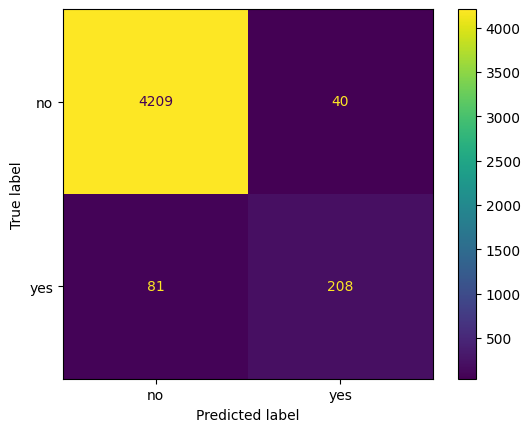

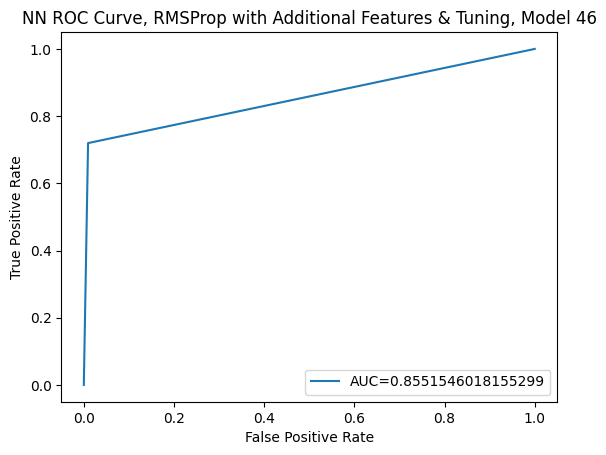

{'optimiser': 'RMSProp', 'num_hidden_layers': 2, 'num_neurons': 64, 'regularization': 0.005}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9496 - loss: 0.3166 - val_accuracy: 0.9743 - val_loss: 0.1111
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9756 - loss: 0.1007 - val_accuracy: 0.9767 - val_loss: 0.0895
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9751 - loss: 0.0899 - val_accuracy: 0.9792 - val_loss: 0.0855
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9790 - loss: 0.0794 - val_accuracy: 0.9767 - val_loss: 0.0924
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9789 - loss: 0.0784
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9747 - loss: 0.0812
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
RMSProp Optimiser:
Accuracy 0.9777434993389158
Precision: 0.8286713286713286
Recall: 0.8200692041522492
F1 Score: 0.8243478260869566


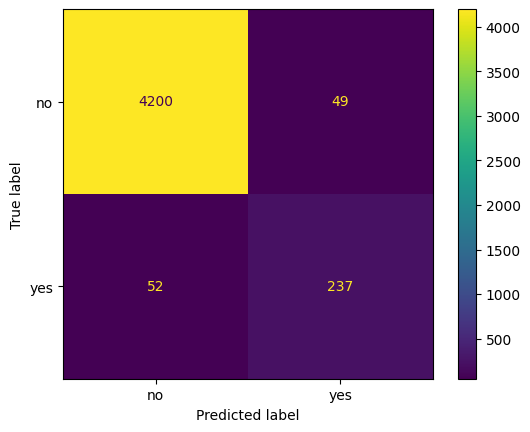

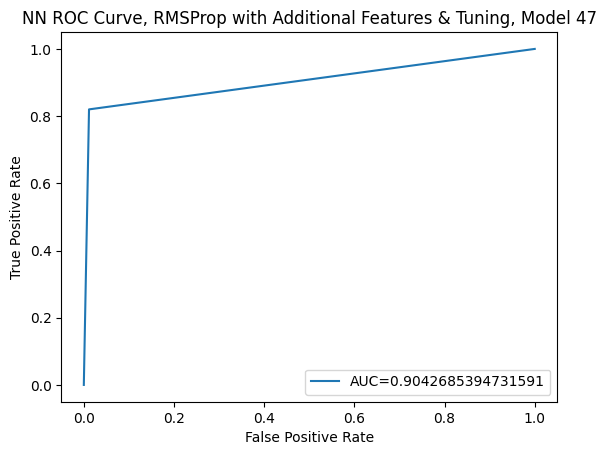

{'optimiser': 'RMSProp', 'num_hidden_layers': 2, 'num_neurons': 64, 'regularization': 0.01}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9571 - loss: 0.4267 - val_accuracy: 0.9706 - val_loss: 0.1093
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9739 - loss: 0.1040 - val_accuracy: 0.9761 - val_loss: 0.0930
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9749 - loss: 0.0863 - val_accuracy: 0.9792 - val_loss: 0.0814
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9739 - loss: 0.0852 - val_accuracy: 0.9774 - val_loss: 0.0878
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9758 - loss: 0.0846
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9752 - loss: 0.0860
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
RMSProp Optimiser:
Accuracy 0.9753195240193918
Precision: 0.8105263157894737
Recall: 0.7993079584775087
F1 Score: 0.8048780487804879


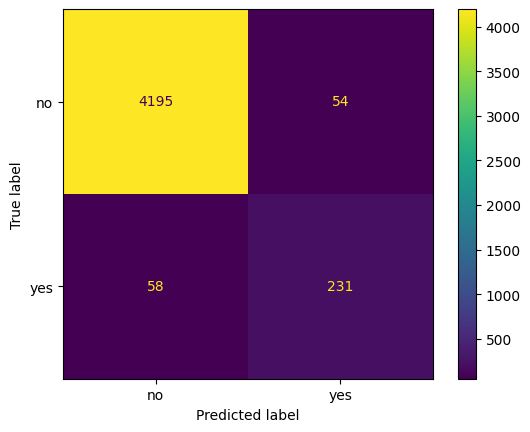

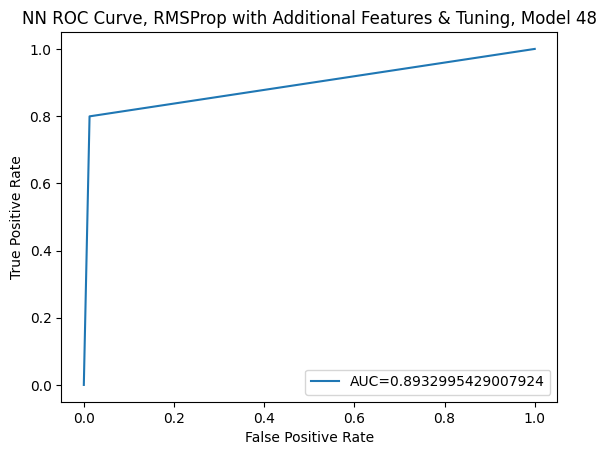

{'optimiser': 'RMSProp', 'num_hidden_layers': 2, 'num_neurons': 64, 'regularization': 0.05}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9580 - loss: 1.2008 - val_accuracy: 0.9731 - val_loss: 0.1000
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9732 - loss: 0.0885 - val_accuracy: 0.9725 - val_loss: 0.1014
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9730 - loss: 0.0929
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9746 - loss: 0.0900
142/142 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
RMSProp Optimiser:
Accuracy 0.9735566328779198
Precision: 0.8506224066390041
Recall: 0.7093425605536332
F1 Score: 0.7735849056603774


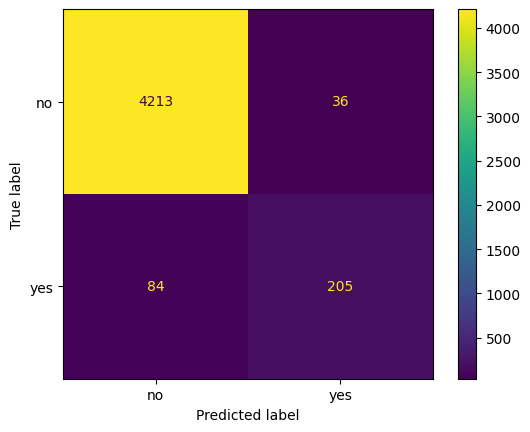

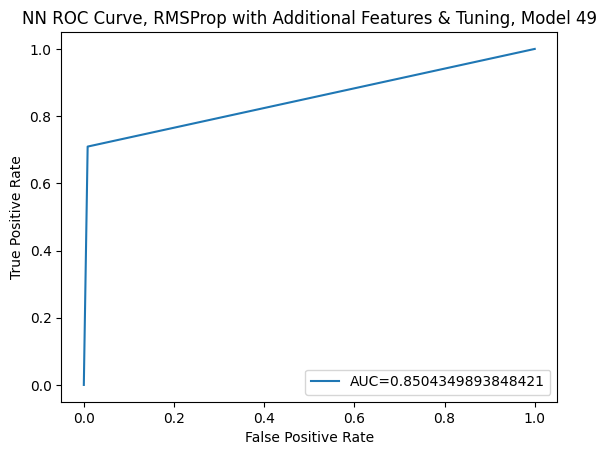

{'optimiser': 'RMSProp', 'num_hidden_layers': 3, 'num_neurons': 128, 'regularization': 0.005}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9553 - loss: 0.2952 - val_accuracy: 0.9767 - val_loss: 0.1152
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9744 - loss: 0.1017 - val_accuracy: 0.9700 - val_loss: 0.1103
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9777 - loss: 0.0836 - val_accuracy: 0.9755 - val_loss: 0.0851
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9751 - loss: 0.0870 - val_accuracy: 0.9786 - val_loss: 0.0909
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9762 - loss: 0.0810
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9759 - loss: 0.0808
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
RMSProp Optimiser:
Accuracy 0.9775231379462318
Precision: 0.8169491525423729
Recall: 0.8339100346020761
F1 Score: 0.8253424657534246


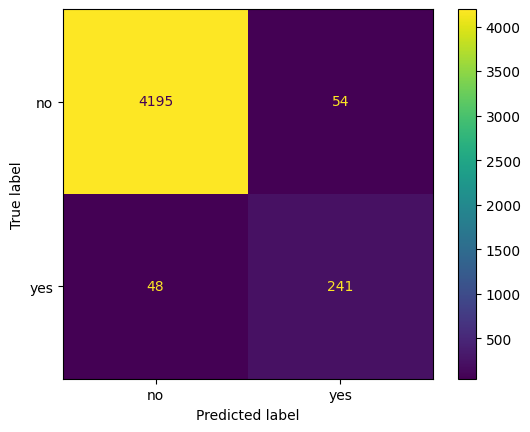

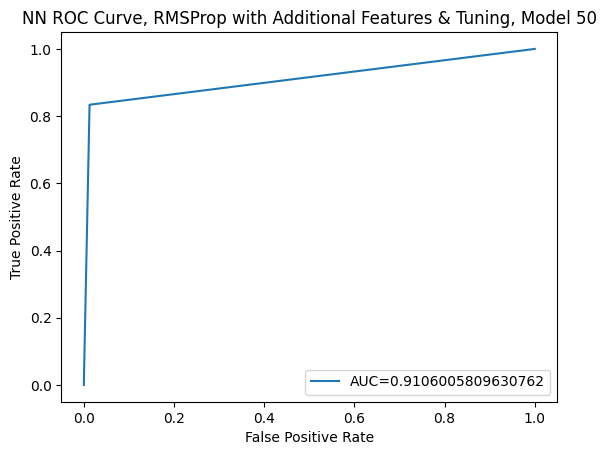

{'optimiser': 'RMSProp', 'num_hidden_layers': 3, 'num_neurons': 128, 'regularization': 0.01}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.9582 - loss: 0.4079 - val_accuracy: 0.9706 - val_loss: 0.1296
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9715 - loss: 0.1116 - val_accuracy: 0.9725 - val_loss: 0.0960
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9734 - loss: 0.0902 - val_accuracy: 0.9786 - val_loss: 0.0901
Epoch 4/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9769 - loss: 0.0857 - val_accuracy: 0.9737 - val_loss: 0.0911
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9780 - loss: 0.0811
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9742 - loss: 0.0863
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
RMSProp Optimiser:
Accuracy 0.9762009695901278
Precision: 0.8197879858657244
Recall: 0.8027681660899654
F1 Score: 0.8111888111888111


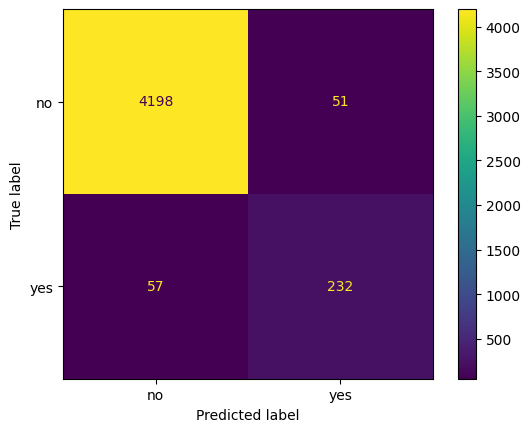

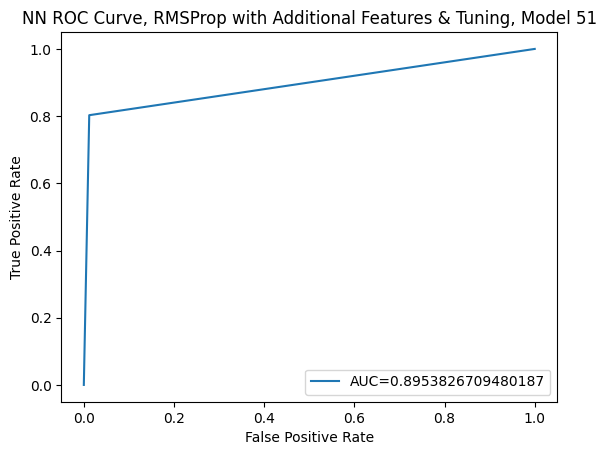

{'optimiser': 'RMSProp', 'num_hidden_layers': 3, 'num_neurons': 128, 'regularization': 0.05}
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9528 - loss: 1.1889 - val_accuracy: 0.9651 - val_loss: 0.1197
Epoch 2/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9727 - loss: 0.0980 - val_accuracy: 0.9731 - val_loss: 0.0920
Epoch 3/50
460/460 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9729 - loss: 0.0911 - val_accuracy: 0.9706 - val_loss: 0.0926
511/511 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9733 - loss: 0.0868
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9761 - loss: 0.0865
142/142 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
RMSProp Optimiser:
Accuracy 0.9753195240193918
Precision: 0.8672199170124482
Recall: 0.7231833910034602
F1 Score: 0.7886792452830189


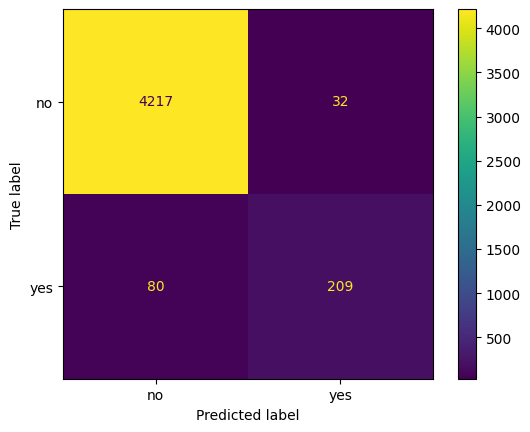

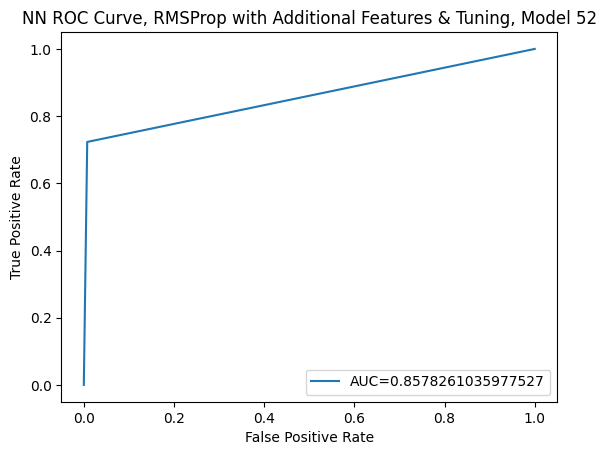

In [78]:
# Define model configurations.
rmsprop_model_configs = [
    {"optimiser":'RMSProp', "num_hidden_layers":1, "num_neurons": 1, "regularization":0.005},
    {"optimiser":'RMSProp', "num_hidden_layers":1, "num_neurons": 1, "regularization":0.01},
    {"optimiser":'RMSProp', "num_hidden_layers":1, "num_neurons": 1, "regularization":0.05},
    {"optimiser":'RMSProp', "num_hidden_layers":1, "num_neurons": 32, "regularization":0.005},
    {"optimiser":'RMSProp', "num_hidden_layers":1, "num_neurons": 32, "regularization":0.01},
    {"optimiser":'RMSProp', "num_hidden_layers":1, "num_neurons": 32, "regularization":0.05},
    {"optimiser":'RMSProp', "num_hidden_layers":2, "num_neurons": 64, "regularization":0.005},
    {"optimiser":'RMSProp', "num_hidden_layers":2, "num_neurons": 64, "regularization":0.01},
    {"optimiser":'RMSProp', "num_hidden_layers":2, "num_neurons": 64, "regularization":0.05},
    {"optimiser":'RMSProp', "num_hidden_layers":3, "num_neurons": 128, "regularization":0.005},
    {"optimiser":'RMSProp', "num_hidden_layers":3, "num_neurons": 128, "regularization":0.01},
    {"optimiser":'RMSProp', "num_hidden_layers":3, "num_neurons": 128, "regularization":0.05}
]

rmsprop_cmdf = pd.DataFrame(columns=['Optimiser', 'Accuracy', 'Precision', 'Recall', 'F1 Score'])
# Train and evaluate each model.
rmsprop_results = []
count = 41
for config in rmsprop_model_configs:
  print(config)
  model2 = create_model4(**config)
  early_stopping_callback = EarlyStopping(monitor='val_loss', patience=1,
                                            restore_best_weights=True)
  history = model2.fit(X2_train, y2_train, epochs=50, batch_size=32,
                        validation_split=0.1,  verbose=1,
                        callbacks=[early_stopping_callback])
  train_loss, train_accuracy = model2.evaluate(X2_train, y2_train, verbose=1)
  test_loss, test_accuracy = model2.evaluate(X2_test, y2_test, verbose=1)

  y_pred = (model2.predict(X2_test) > 0.5).astype(int)
  rmsprop_accuracy = accuracy_score(y2_test, y_pred)
  rmsprop_prec = precision_score(y2_test, y_pred)
  rmsprop_recall = recall_score(y2_test, y_pred)
  rmsprop_f1 = f1_score(y2_test, y_pred)
  print('RMSProp Optimiser:')
  print("Accuracy", rmsprop_accuracy)
  print('Precision:', rmsprop_prec)
  print('Recall:', rmsprop_recall)
  print('F1 Score:', rmsprop_f1)

  cm = confusion_matrix(y2_test, y_pred)
  cfmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["no","yes"])
  cfmd.plot()
  plt.show()
  fpr, tpr, _ = roc_curve(y2_test,  y_pred)
  auc = roc_auc_score(y2_test, y_pred)

  #create ROC curve
  plt.plot(fpr,tpr, label="AUC="+str(auc))
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')
  plt.title("NN ROC Curve, RMSProp with Additional Features & Tuning, Model "+str(count))
  plt.legend(loc=4)
  plt.show()
  new_row = {'Optimiser': 'RMSProp',
            'Accuracy': rmsprop_accuracy,
            'Precision': rmsprop_prec,
            'Recall': rmsprop_recall,
            'F1 Score': rmsprop_f1}
  rmsprop_cmdf = pd.concat([rmsprop_cmdf, pd.DataFrame([new_row])])
  rmsprop_cmdf = rmsprop_cmdf.reset_index(drop=True)

  rmsprop_results.append({
        "config": config,
        "train_loss": train_loss,
        "train_accuracy": train_accuracy,
        "test_loss": test_loss,
        "test_accuracy": test_accuracy,
        "history": history
  })
  count += 1

In [79]:
rmsprop_cmdf

,Optimiser,Accuracy,Precision,Recall,F1 Score
0,RMSProp,0.976201,0.789137,0.854671,0.820598
1,RMSProp,0.975760,0.791531,0.840830,0.815436
2,RMSProp,0.971133,0.806202,0.719723,0.760512
3,RMSProp,0.975540,0.794702,0.830450,0.812183
4,RMSProp,0.979066,0.841549,0.826990,0.834206
5,RMSProp,0.973336,0.838710,0.719723,0.774674
6,RMSProp,0.977743,0.828671,0.820069,0.824348
7,RMSProp,0.975320,0.810526,0.799308,0.804878
8,RMSProp,0.973557,0.850622,0.709343,0.773585
9,RMSProp,0.977523,0.816949,0.833910,0.825342


In [80]:
rmsprop_cmdf.to_latex()

'\\begin{tabular}{llrrrr}\n\\toprule\n & Optimiser & Accuracy & Precision & Recall & F1 Score \\\\\n\\midrule\n0 & RMSProp & 0.976201 & 0.789137 & 0.854671 & 0.820598 \\\\\n1 & RMSProp & 0.975760 & 0.791531 & 0.840830 & 0.815436 \\\\\n2 & RMSProp & 0.971133 & 0.806202 & 0.719723 & 0.760512 \\\\\n3 & RMSProp & 0.975540 & 0.794702 & 0.830450 & 0.812183 \\\\\n4 & RMSProp & 0.979066 & 0.841549 & 0.826990 & 0.834206 \\\\\n5 & RMSProp & 0.973336 & 0.838710 & 0.719723 & 0.774674 \\\\\n6 & RMSProp & 0.977743 & 0.828671 & 0.820069 & 0.824348 \\\\\n7 & RMSProp & 0.975320 & 0.810526 & 0.799308 & 0.804878 \\\\\n8 & RMSProp & 0.973557 & 0.850622 & 0.709343 & 0.773585 \\\\\n9 & RMSProp & 0.977523 & 0.816949 & 0.833910 & 0.825342 \\\\\n10 & RMSProp & 0.976201 & 0.819788 & 0.802768 & 0.811189 \\\\\n11 & RMSProp & 0.975320 & 0.867220 & 0.723183 & 0.788679 \\\\\n\\bottomrule\n\\end{tabular}\n'

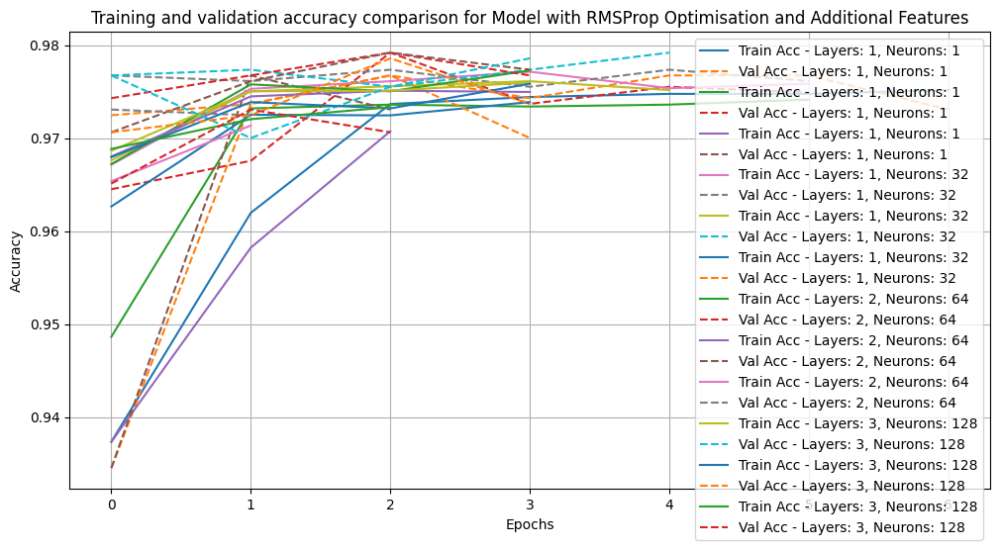

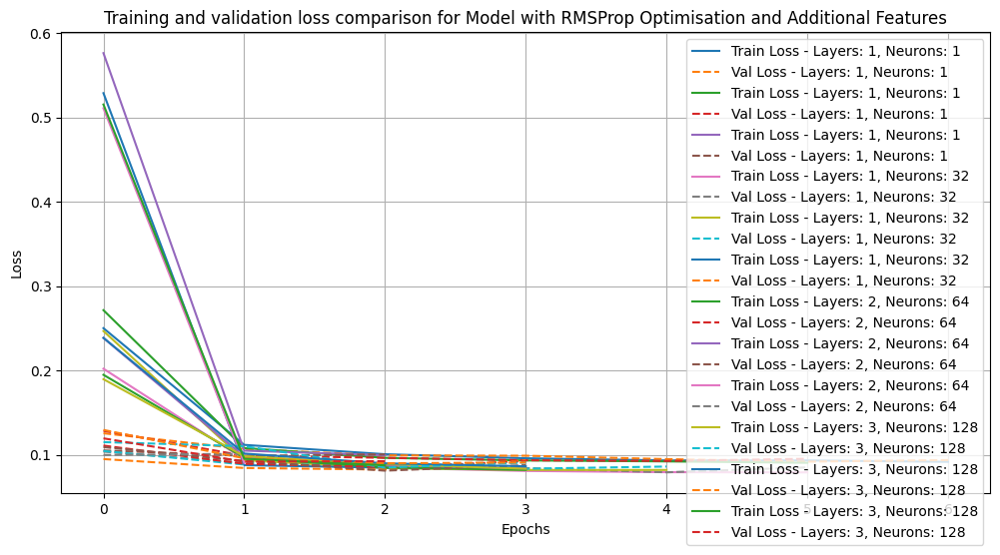

In [81]:
plt.figure(figsize=(12, 6))
for result in rmsprop_results:
    config_str = f"Layers: {result['config']['num_hidden_layers']}, Neurons: {result['config']['num_neurons']}"
    plt.plot(result['history'].history['accuracy'], label=f"Train Acc - {config_str}")
    plt.plot(result['history'].history['val_accuracy'], linestyle='--', label=f"Val Acc - {config_str}")
plt.title('Training and validation accuracy comparison for Model with RMSProp Optimisation and Additional Features')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()
#plt.savefig("AddedFeatures_Acc_RMSPropMulticonfigs.jpg")
#files.download("AddedFeatures_Acc_RMSPropMulticonfigs.jpg")

# Plot train/validation loss.
plt.figure(figsize=(12, 6))
for result in rmsprop_results:
    config_str = f"Layers: {result['config']['num_hidden_layers']}, Neurons: {result['config']['num_neurons']}"
    plt.plot(result['history'].history['loss'], label=f"Train Loss - {config_str}")
    plt.plot(result['history'].history['val_loss'], linestyle='--', label=f"Val Loss - {config_str}")
plt.title('Training and validation loss comparison for Model with RMSProp Optimisation and Additional Features')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()
#plt.savefig("AddedFeatures_Loss_RMSPropMulticonfigs.jpg")
#files.download("AddedFeatures_Loss_RMSPropMulticonfigs.jpg")

# Modelling with XGBoost Algorithm
## 1. Data Set with Initially Dropped Features

In this section, we apply the XGBoost model, with data set having the features removed according to the original guidelines. We carry out our modelling with and without hyperparameter tuning.

The dataframe FEdf contains the features after performing the necessary (binary and one-hot) encoding of the categorical features.


### 1a. XGBoost without Hyperparameter Tuning

In [51]:
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn import metrics
from sklearn.metrics import (roc_auc_score, accuracy_score,
                              classification_report, precision_score,
                              confusion_matrix, ConfusionMatrixDisplay)
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
import shap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [40]:
# Separate the target feature 'DropOut'
y = FEdf['DropOut']
X = FEdf.drop('DropOut', axis=1)

In [41]:
y.value_counts()

,count
DropOut,
0,21242
1,1444


Clearly there is a mismatch between the 0 and 1 values. So, we'll need to take startified samples for training and test values.

In [42]:
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y,
                                                    test_size=0.2,
                                                    random_state=42, stratify=y)
print(X_train_full.shape)
print(X_test.shape)

(18148, 67)
(4538, 67)


Note that we do not apply scaling for training data with XGBoost algorithm.

XGBoost Model Accuracy:  0.9689290436315557
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4249
           1       0.78      0.72      0.75       289

    accuracy                           0.97      4538
   macro avg       0.88      0.85      0.86      4538
weighted avg       0.97      0.97      0.97      4538



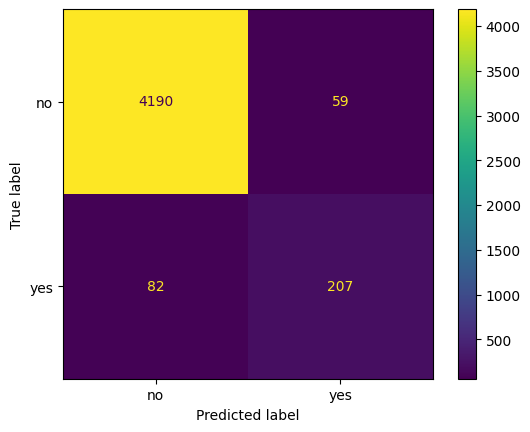

In [43]:
xg_model = xgb.XGBClassifier(random_state=42)
xg_model.fit(X_train_full, y_train_full)

# Model evaluation
predictions = xg_model.predict(X_test)
print("XGBoost Model Accuracy: ", accuracy_score(y_test, predictions))
print(classification_report(y_test, predictions))


cm = confusion_matrix(y_test, predictions)
cfmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["no","yes"])
cfmd.plot()
plt.show()


In [44]:
cmdf = pd.DataFrame(cm, columns=['Predicted No', 'Predicted Yes'], index=['Actual No', 'Actual Yes'])
cmdf

,Predicted No,Predicted Yes
Actual No,4190,59
Actual Yes,82,207


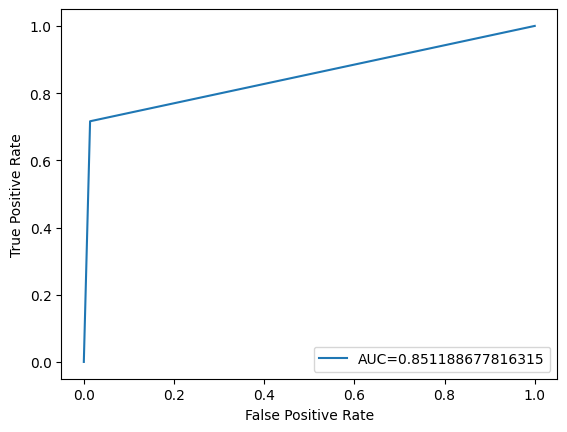

In [46]:
fpr, tpr, _ = metrics.roc_curve(y_test,  predictions)
auc = metrics.roc_auc_score(y_test, predictions)

#create ROC curve
plt.plot(fpr,tpr, label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc=4)
plt.show()

The AUC score of $0.85$ and accuracy of $97\%$ suggests that this XGBoost model, with no hyperparamteric tuning, is quite good.

### 1b. Training XGBoost with Hyperparameter tuning - Use of Learning Rate, Maximum Depth and No of Estimators

XGBoost Model Accuracy:  0.9713530189510797
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4249
           1       0.79      0.75      0.77       289

    accuracy                           0.97      4538
   macro avg       0.89      0.87      0.88      4538
weighted avg       0.97      0.97      0.97      4538



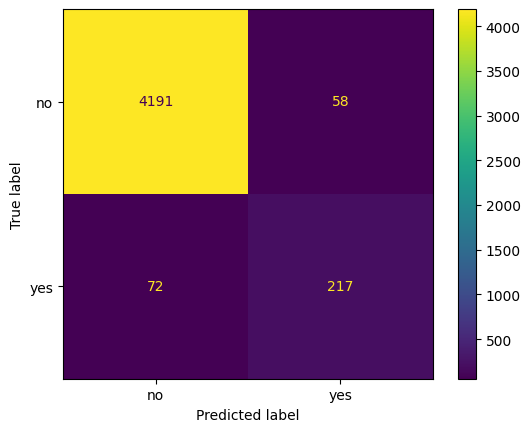

In [55]:
# The hyperparameter n_estimators = 100 is default
xg_model = xgb.XGBClassifier(random_state=42, n_estimators=100, max_depth=3,
                             learning_rate=0.5)
xg_model.fit(X_train_full, y_train_full)

# Model evaluation
predictions = xg_model.predict(X_test)
print("XGBoost Model Accuracy: ", accuracy_score(y_test, predictions))
print(classification_report(y_test, predictions))


cm = confusion_matrix(y_test, predictions)
cfmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["no","yes"])
cfmd.plot()
plt.show()

We chose 27 different combinations from different values of the three hyperparameter values n_estimators, max_depth ans learning_rate and collected the for these models performance metrics.

1: n_estimators: 100, max_depth: 3, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9750991626267078
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      4249
           1       0.83      0.76      0.80       289

    accuracy                           0.98      4538
   macro avg       0.91      0.88      0.89      4538
weighted avg       0.97      0.98      0.97      4538



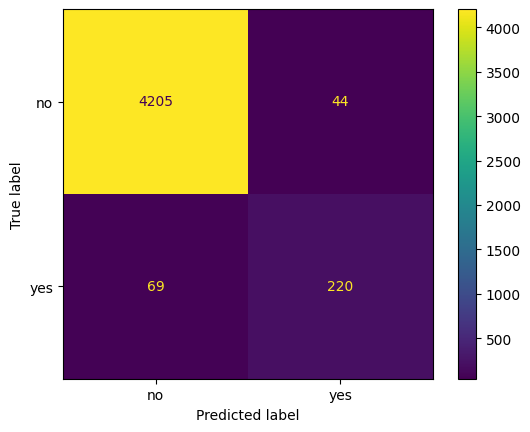

2: n_estimators: 100, max_depth: 3, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9733362714852358
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      4249
           1       0.80      0.77      0.79       289

    accuracy                           0.97      4538
   macro avg       0.89      0.88      0.89      4538
weighted avg       0.97      0.97      0.97      4538



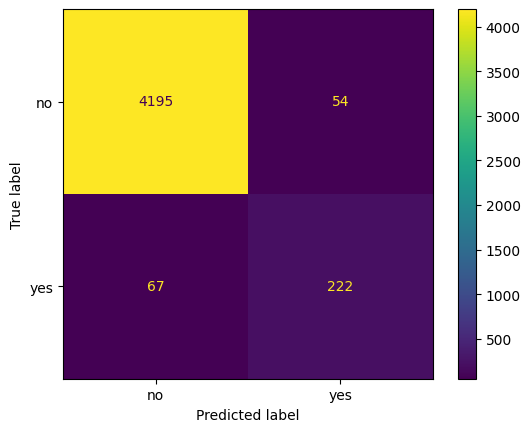

3: n_estimators: 100, max_depth: 3, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9713530189510797
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4249
           1       0.79      0.75      0.77       289

    accuracy                           0.97      4538
   macro avg       0.89      0.87      0.88      4538
weighted avg       0.97      0.97      0.97      4538



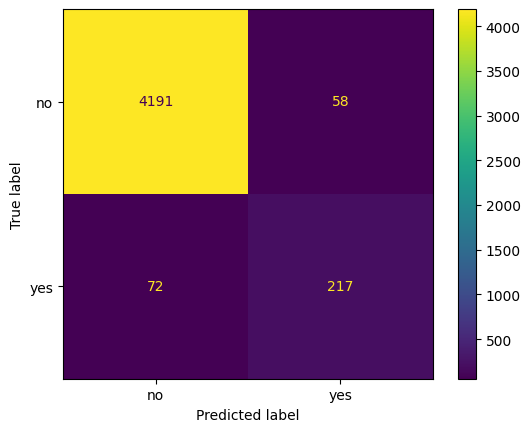

4: n_estimators: 100, max_depth: 4, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9737769942706038
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      4249
           1       0.82      0.75      0.78       289

    accuracy                           0.97      4538
   macro avg       0.90      0.87      0.89      4538
weighted avg       0.97      0.97      0.97      4538



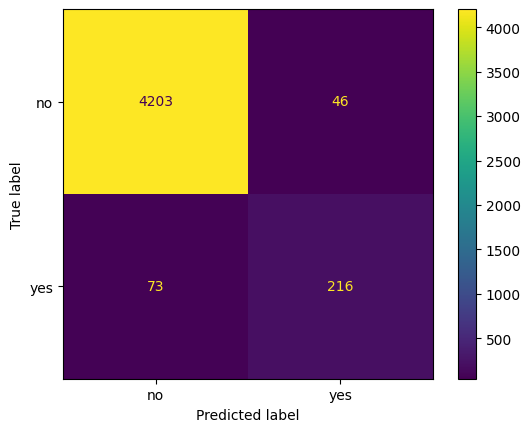

5: n_estimators: 100, max_depth: 4, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9726751873071838
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      4249
           1       0.80      0.75      0.78       289

    accuracy                           0.97      4538
   macro avg       0.89      0.87      0.88      4538
weighted avg       0.97      0.97      0.97      4538



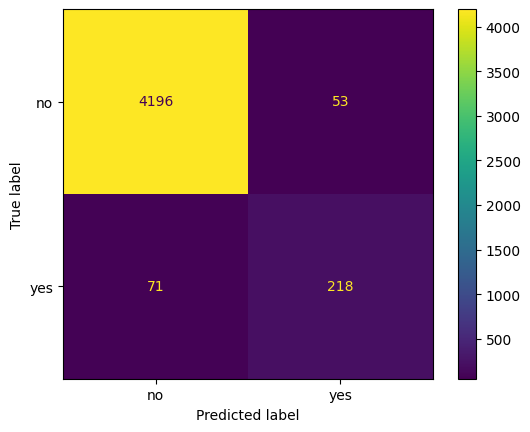

6: n_estimators: 100, max_depth: 4, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9693697664169237
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4249
           1       0.78      0.73      0.75       289

    accuracy                           0.97      4538
   macro avg       0.88      0.86      0.87      4538
weighted avg       0.97      0.97      0.97      4538



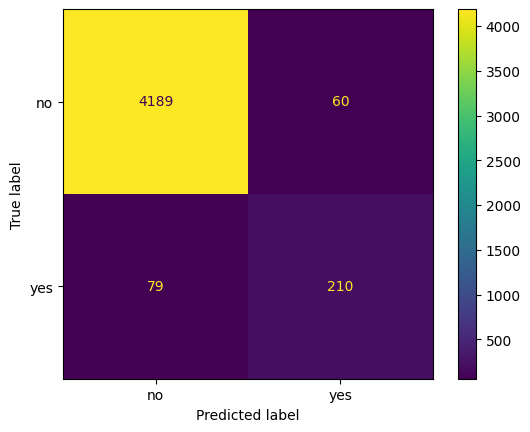

7: n_estimators: 100, max_depth: 5, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9737769942706038
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      4249
           1       0.82      0.76      0.79       289

    accuracy                           0.97      4538
   macro avg       0.90      0.87      0.89      4538
weighted avg       0.97      0.97      0.97      4538



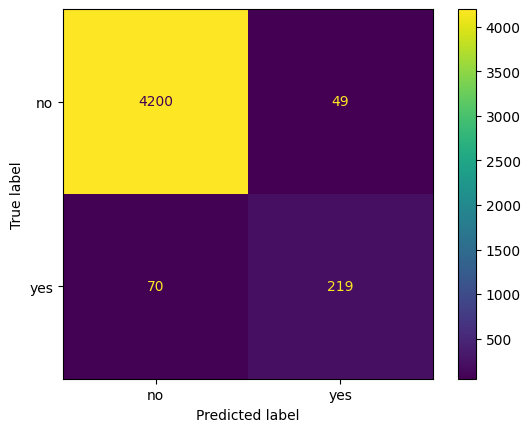

8: n_estimators: 100, max_depth: 5, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9700308505949757
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4249
           1       0.79      0.72      0.75       289

    accuracy                           0.97      4538
   macro avg       0.88      0.86      0.87      4538
weighted avg       0.97      0.97      0.97      4538



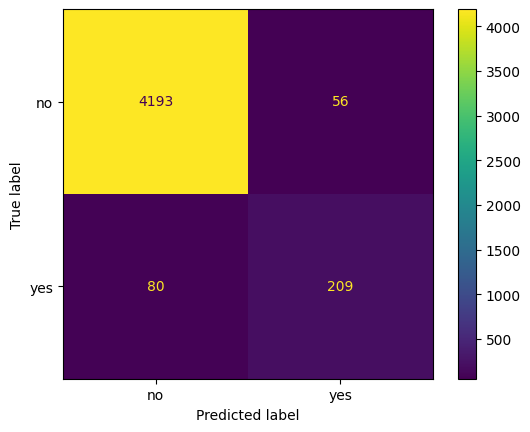

9: n_estimators: 100, max_depth: 5, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9684883208461877
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4249
           1       0.77      0.72      0.74       289

    accuracy                           0.97      4538
   macro avg       0.88      0.85      0.86      4538
weighted avg       0.97      0.97      0.97      4538



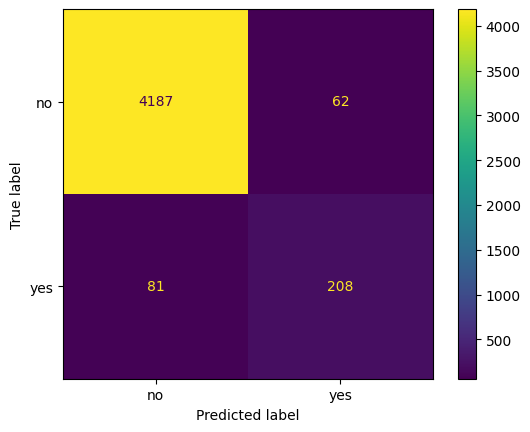

10: n_estimators: 200, max_depth: 3, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9737769942706038
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      4249
           1       0.81      0.76      0.79       289

    accuracy                           0.97      4538
   macro avg       0.90      0.88      0.89      4538
weighted avg       0.97      0.97      0.97      4538



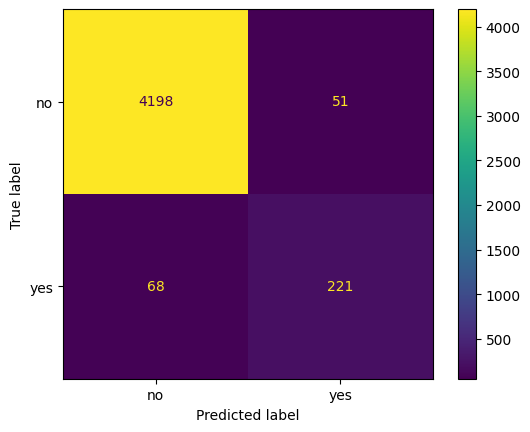

11: n_estimators: 200, max_depth: 3, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9706919347730277
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4249
           1       0.79      0.73      0.76       289

    accuracy                           0.97      4538
   macro avg       0.89      0.86      0.87      4538
weighted avg       0.97      0.97      0.97      4538



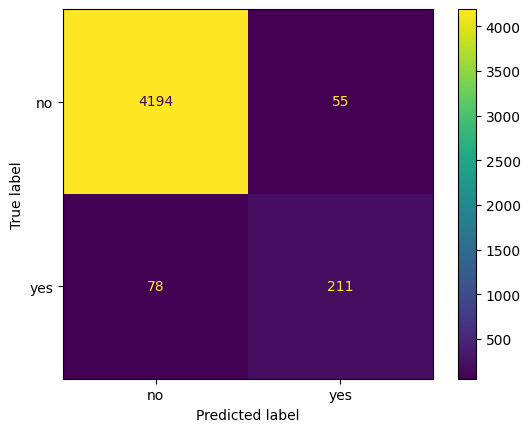

12: n_estimators: 200, max_depth: 3, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9687086822388717
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4249
           1       0.77      0.72      0.75       289

    accuracy                           0.97      4538
   macro avg       0.88      0.85      0.86      4538
weighted avg       0.97      0.97      0.97      4538



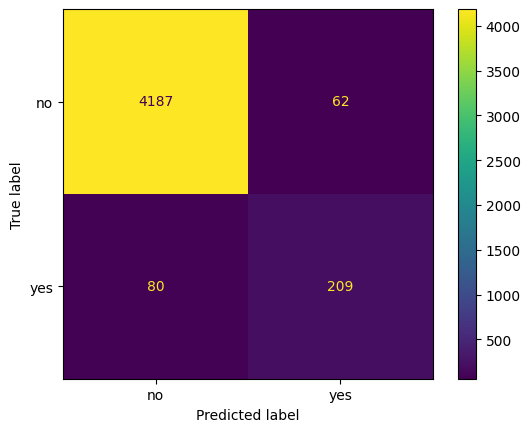

13: n_estimators: 200, max_depth: 4, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9728955486998678
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      4249
           1       0.81      0.75      0.78       289

    accuracy                           0.97      4538
   macro avg       0.90      0.87      0.88      4538
weighted avg       0.97      0.97      0.97      4538



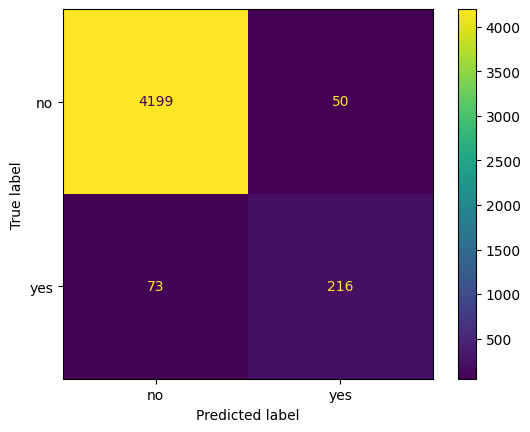

14: n_estimators: 200, max_depth: 4, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9702512119876597
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4249
           1       0.78      0.74      0.76       289

    accuracy                           0.97      4538
   macro avg       0.88      0.86      0.87      4538
weighted avg       0.97      0.97      0.97      4538



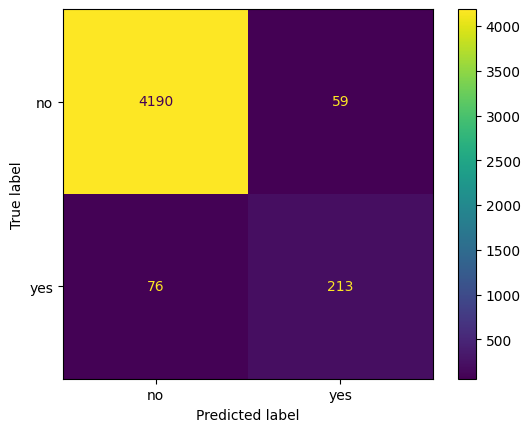

15: n_estimators: 200, max_depth: 4, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9684883208461877
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      4249
           1       0.76      0.73      0.75       289

    accuracy                           0.97      4538
   macro avg       0.87      0.86      0.87      4538
weighted avg       0.97      0.97      0.97      4538



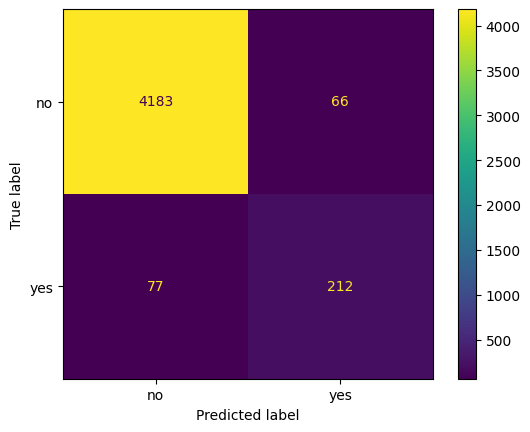

16: n_estimators: 200, max_depth: 5, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9706919347730277
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4249
           1       0.79      0.73      0.76       289

    accuracy                           0.97      4538
   macro avg       0.89      0.86      0.87      4538
weighted avg       0.97      0.97      0.97      4538



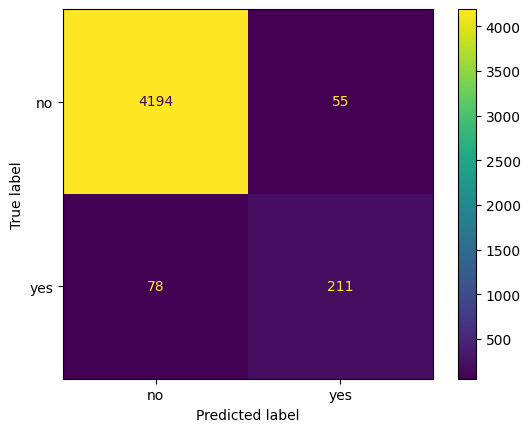

17: n_estimators: 200, max_depth: 5, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9682679594535037
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      4249
           1       0.76      0.73      0.74       289

    accuracy                           0.97      4538
   macro avg       0.87      0.86      0.86      4538
weighted avg       0.97      0.97      0.97      4538



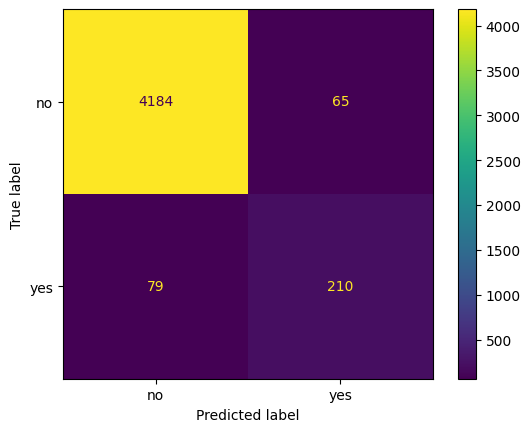

18: n_estimators: 200, max_depth: 5, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9667254297047158
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      4249
           1       0.76      0.70      0.73       289

    accuracy                           0.97      4538
   macro avg       0.87      0.84      0.86      4538
weighted avg       0.97      0.97      0.97      4538



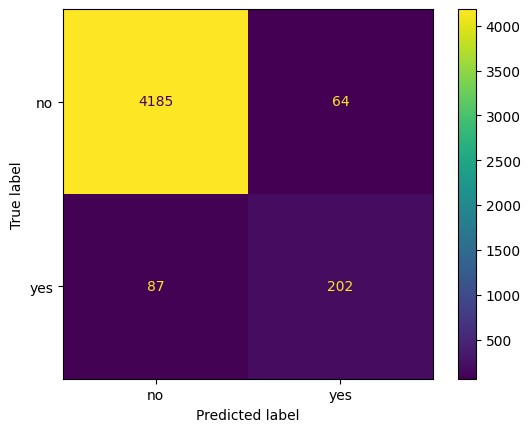

19: n_estimators: 300, max_depth: 3, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9717937417364477
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4249
           1       0.80      0.75      0.77       289

    accuracy                           0.97      4538
   macro avg       0.89      0.87      0.88      4538
weighted avg       0.97      0.97      0.97      4538



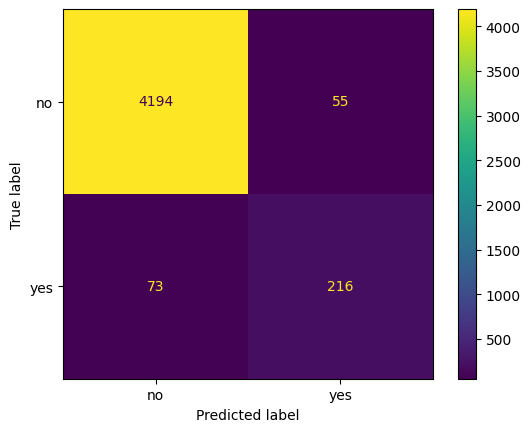

20: n_estimators: 300, max_depth: 3, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9693697664169237
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4249
           1       0.78      0.72      0.75       289

    accuracy                           0.97      4538
   macro avg       0.88      0.85      0.87      4538
weighted avg       0.97      0.97      0.97      4538



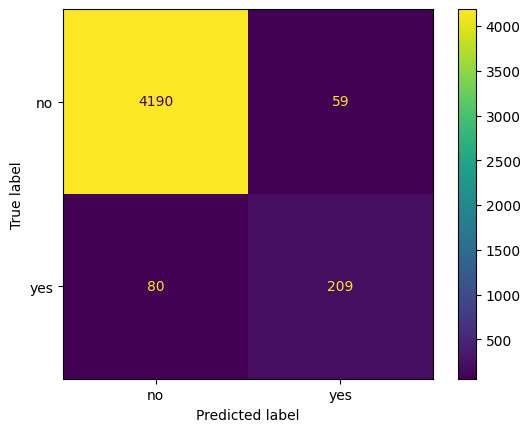

21: n_estimators: 300, max_depth: 3, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9682679594535037
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      4249
           1       0.76      0.73      0.74       289

    accuracy                           0.97      4538
   macro avg       0.87      0.86      0.86      4538
weighted avg       0.97      0.97      0.97      4538



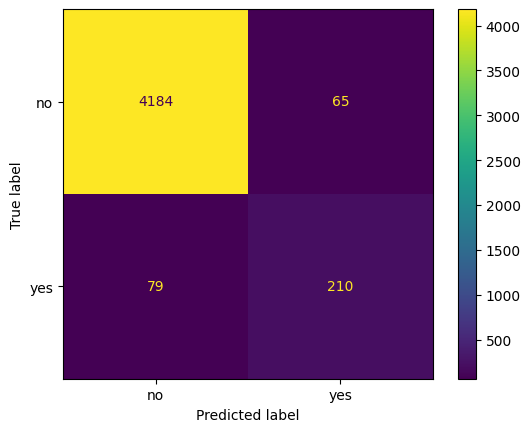

22: n_estimators: 300, max_depth: 4, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9720141031291317
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      4249
           1       0.80      0.75      0.77       289

    accuracy                           0.97      4538
   macro avg       0.89      0.87      0.88      4538
weighted avg       0.97      0.97      0.97      4538



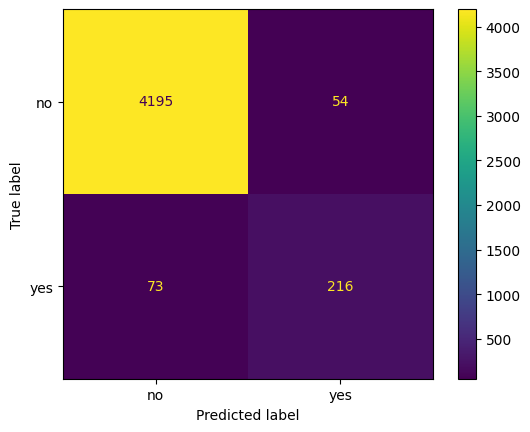

23: n_estimators: 300, max_depth: 4, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9687086822388717
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4249
           1       0.77      0.72      0.75       289

    accuracy                           0.97      4538
   macro avg       0.88      0.85      0.86      4538
weighted avg       0.97      0.97      0.97      4538



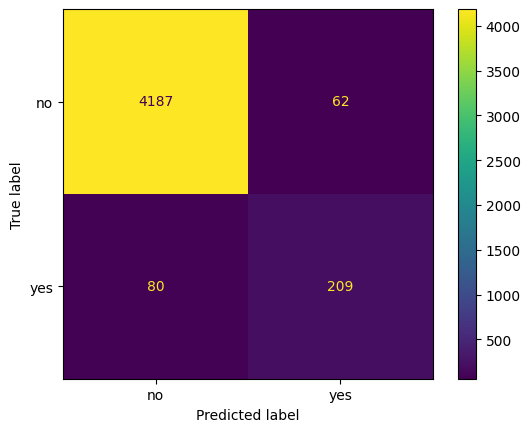

24: n_estimators: 300, max_depth: 4, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9680475980608197
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      4249
           1       0.76      0.73      0.74       289

    accuracy                           0.97      4538
   macro avg       0.87      0.86      0.86      4538
weighted avg       0.97      0.97      0.97      4538



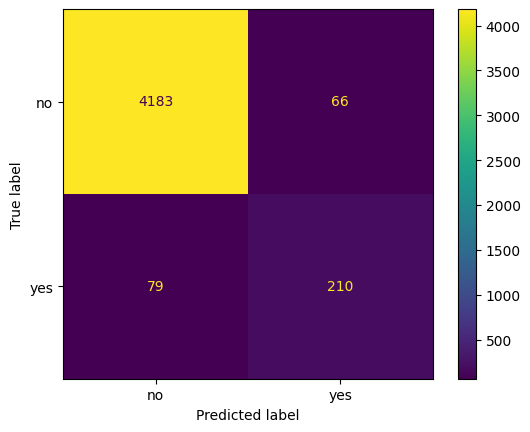

25: n_estimators: 300, max_depth: 5, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9702512119876597
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4249
           1       0.79      0.73      0.76       289

    accuracy                           0.97      4538
   macro avg       0.89      0.86      0.87      4538
weighted avg       0.97      0.97      0.97      4538



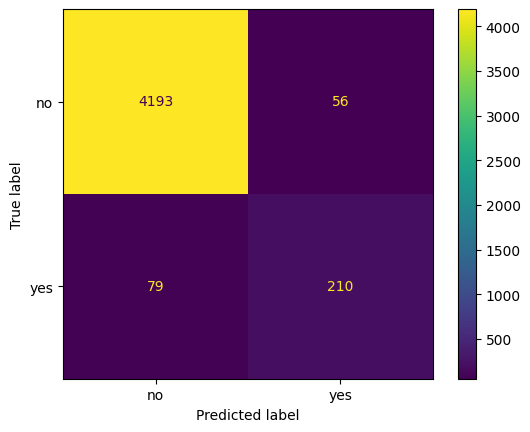

26: n_estimators: 300, max_depth: 5, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9689290436315557
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      4249
           1       0.77      0.74      0.75       289

    accuracy                           0.97      4538
   macro avg       0.87      0.86      0.87      4538
weighted avg       0.97      0.97      0.97      4538



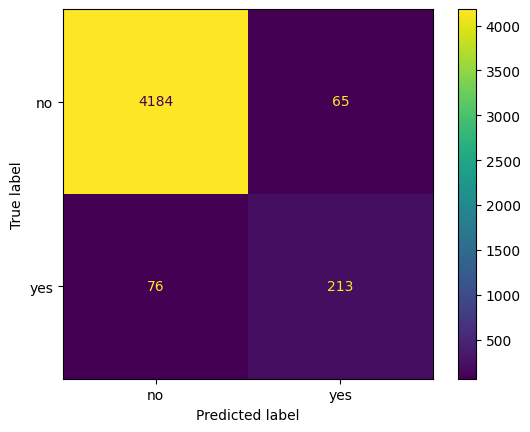

27: n_estimators: 300, max_depth: 5, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9658439841339798
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      4249
           1       0.75      0.70      0.72       289

    accuracy                           0.97      4538
   macro avg       0.86      0.84      0.85      4538
weighted avg       0.96      0.97      0.97      4538



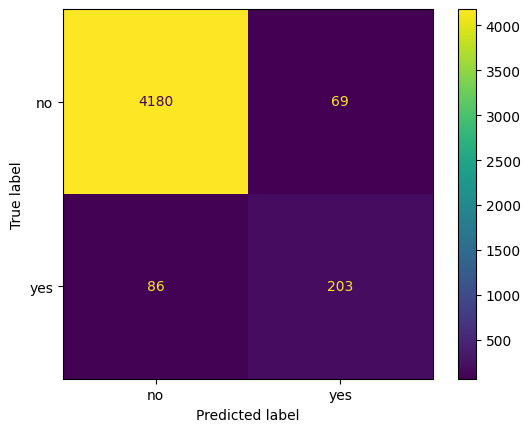

In [43]:
# For various values of hyperparameters:
estList = [100, 200, 300]
maxDepthList = [3, 4, 5]
lrList = [0.1, 0.25, 0.5]
count = 1
for e in estList:
  for d in maxDepthList:
    for lr in lrList:
      print(str(count) + ": n_estimators: " + str(e) + ", max_depth: " + str(d) +
            ", Learning Rate: " + str(lr))
      xg_model = xgb.XGBClassifier(random_state=42, n_estimators=e, max_depth=d,
                             learning_rate=lr)
      xg_model.fit(X_train_full, y_train_full)

      # Model evaluation
      predictions = xg_model.predict(X_test)
      print("XGBoost Model Accuracy: ", accuracy_score(y_test, predictions))
      print(classification_report(y_test, predictions))
      cm = confusion_matrix(y_test, predictions)
      cfmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["no","yes"])
      cfmd.plot()
      plt.show()

      fpr, tpr, _ = metrics.roc_curve(y_test,  predictions)
      auc = metrics.roc_auc_score(y_test, predictions)

      #create ROC curve
      plt.plot(fpr,tpr, label="AUC="+str(auc))
      plt.ylabel('True Positive Rate')
      plt.xlabel('False Positive Rate')
      plt.legend(loc=4)
      plt.show()
      count += 1

## 2. Data Set for XGBoost with Additional Features
### 2a. Training XGBoost WITHOUT Hyperparameter Tuning

We'll use the AddFEdf DataFrame, with binary and one-hot encoding carried out, and having additional features as set out by the project guidance in rubric.

In [52]:
# Separate the target feature 'DropOut'
y2 = AddFEdf['DropOut']
X2 = AddFEdf.drop('DropOut', axis=1)
y2.value_counts()

,count
DropOut,
0,21242
1,1444


In [53]:
X2_train_full, X2_test, y2_train_full, y2_test = train_test_split(X2, y2,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    stratify=y2)
print(X2_train_full.shape)
print(X2_test.shape)

(18148, 69)
(4538, 69)


XGBoost Model Accuracy:  0.9814896430145439
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.87      0.83      0.85       289

    accuracy                           0.98      4538
   macro avg       0.93      0.91      0.92      4538
weighted avg       0.98      0.98      0.98      4538



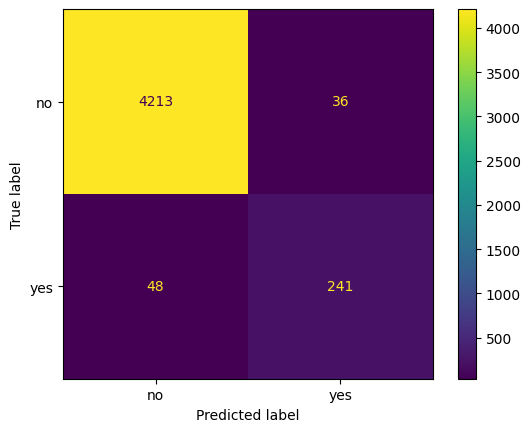

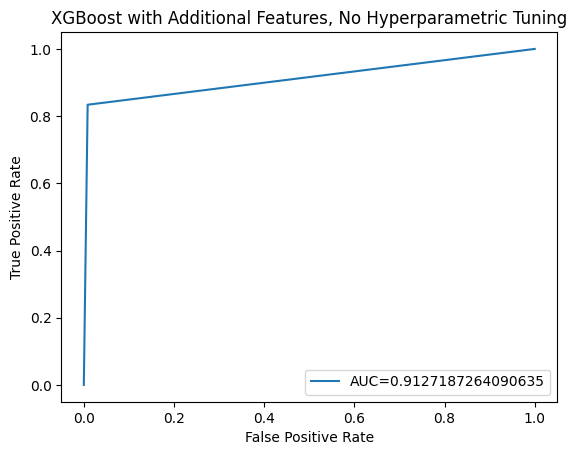

In [63]:
xg_model = xgb.XGBClassifier(random_state=42)
xg_model.fit(X2_train_full, y2_train_full)

# Model evaluation
predictions = xg_model.predict(X2_test)
print("XGBoost Model Accuracy: ", accuracy_score(y2_test, predictions))
print(classification_report(y2_test, predictions))


cm = confusion_matrix(y2_test, predictions)
cfmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["no","yes"])
cfmd.plot()
plt.show()
fpr, tpr, _ = metrics.roc_curve(y2_test,  predictions)
auc = metrics.roc_auc_score(y2_test, predictions)

#create ROC curve
plt.plot(fpr,tpr, label="AUC="+str(auc))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title("XGBoost with Additional Features, No Hyperparametric Tuning")
plt.legend(loc=4)
plt.show()

# Feature Importance

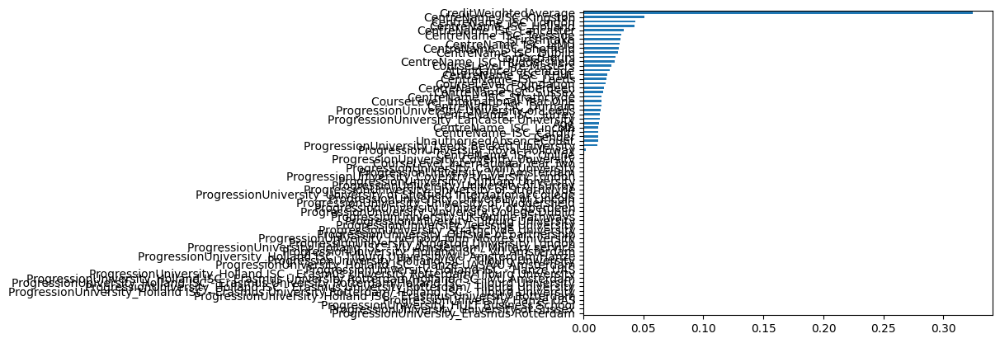

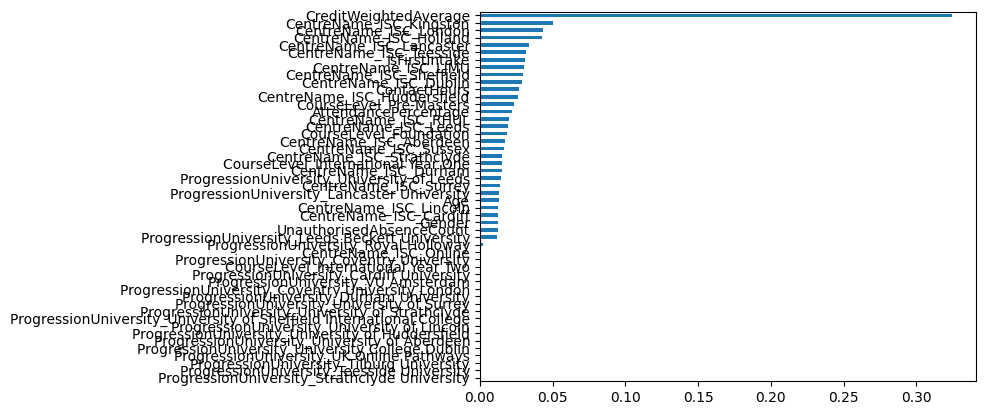

In [59]:
feature_importance = pd.Series(xg_model.feature_importances_, index=X2_train_full.columns).sort_values()

feature_importance.plot.barh()
plt.show()

feature_importance.iloc[-50:].plot.barh()
plt.show()

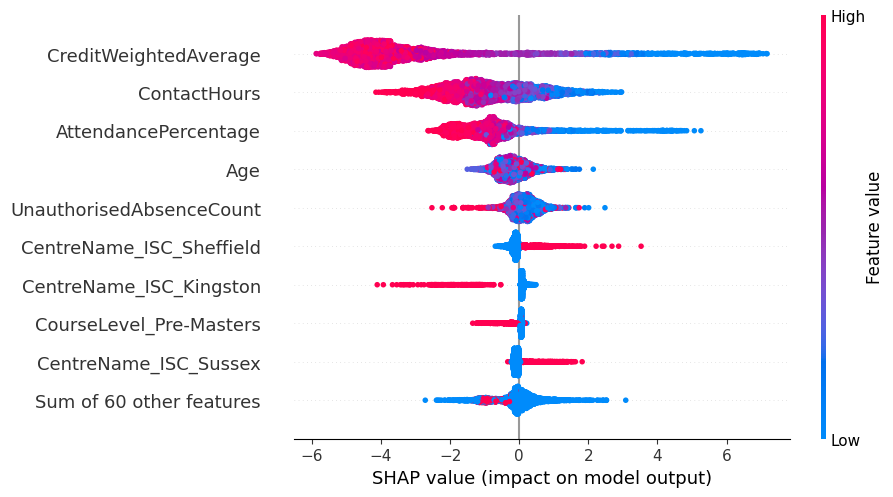

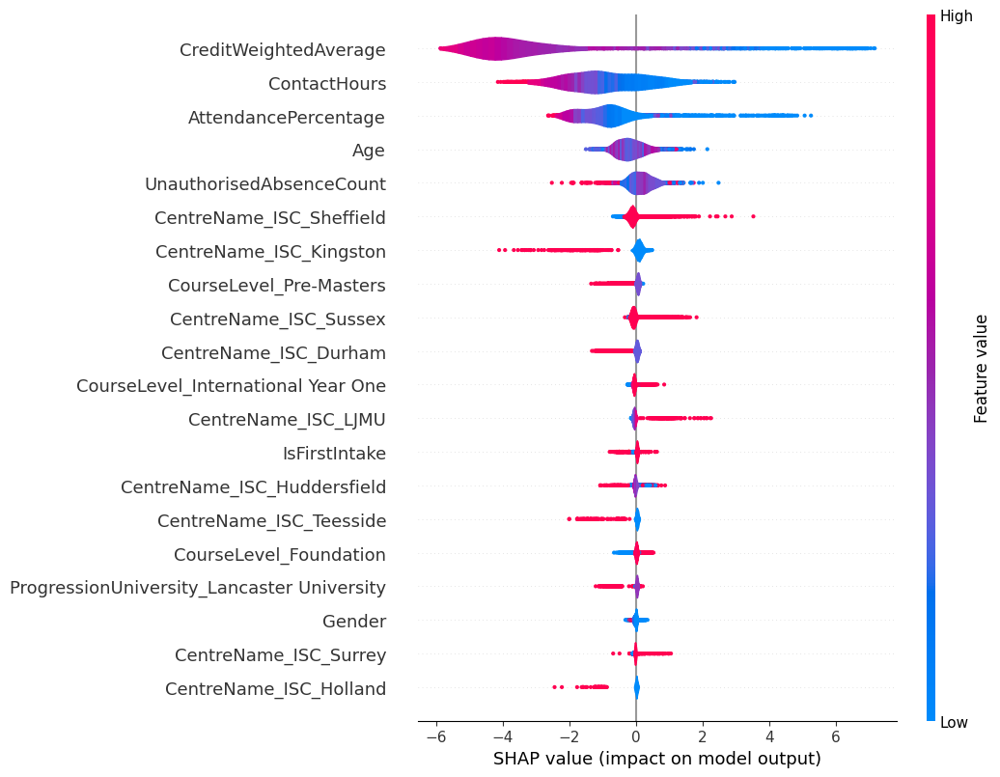

In [60]:
import shap
shap.initjs()

shap_ex = shap.TreeExplainer(xg_model)
vals = shap_ex(X2_test)
vals_df = pd.DataFrame(vals.values, columns=X2_test.columns, index=X2_test.index)
vals_df
shap.plots.beeswarm(vals)
shap.plots.violin(vals)

## 2b. Training Data with Additional Features (XGBoost with Hyperparameter Tuning)

1: n_estimators: 100, max_depth: 3, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9799471132657558
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.86      0.82      0.84       289

    accuracy                           0.98      4538
   macro avg       0.92      0.91      0.91      4538
weighted avg       0.98      0.98      0.98      4538



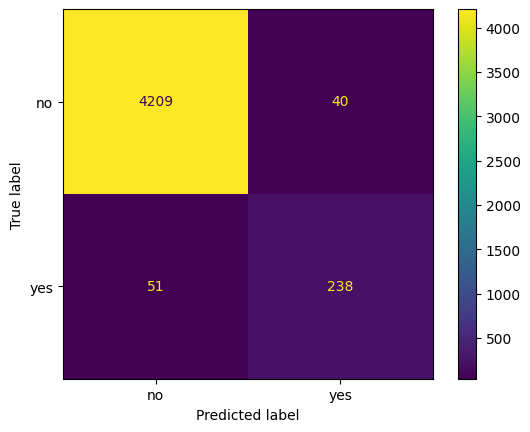

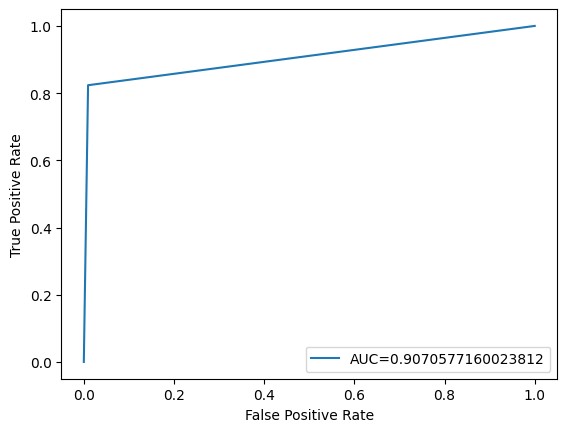

2: n_estimators: 100, max_depth: 3, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9812692816218599
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.86      0.84      0.85       289

    accuracy                           0.98      4538
   macro avg       0.93      0.91      0.92      4538
weighted avg       0.98      0.98      0.98      4538



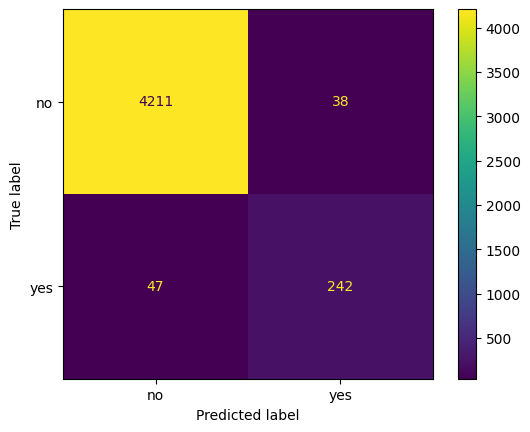

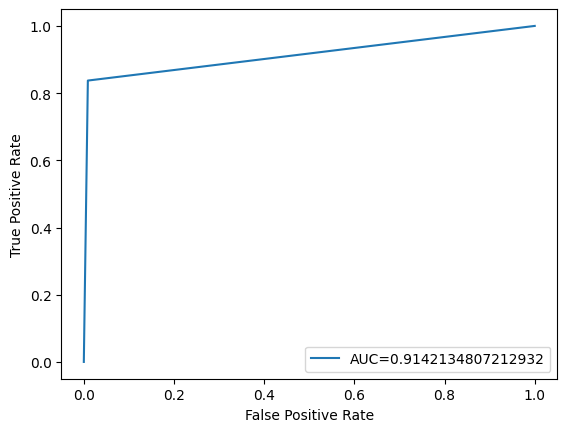

3: n_estimators: 100, max_depth: 3, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9801674746584399
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.85      0.83      0.84       289

    accuracy                           0.98      4538
   macro avg       0.92      0.91      0.92      4538
weighted avg       0.98      0.98      0.98      4538



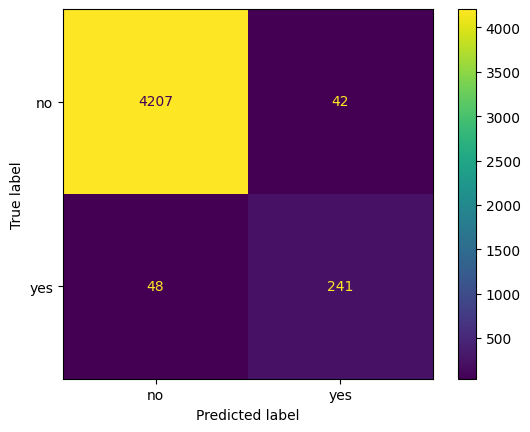

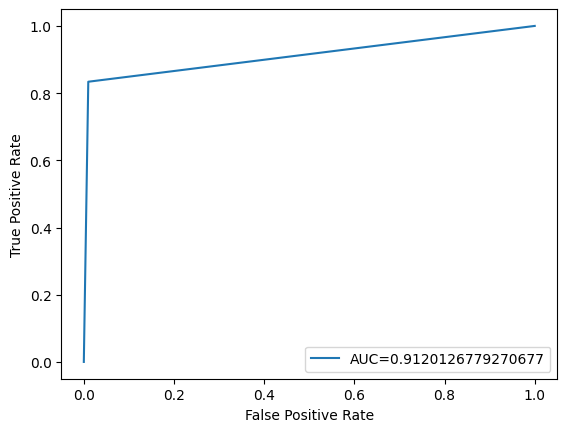

4: n_estimators: 100, max_depth: 4, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9808285588364919
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.86      0.84      0.85       289

    accuracy                           0.98      4538
   macro avg       0.92      0.91      0.92      4538
weighted avg       0.98      0.98      0.98      4538



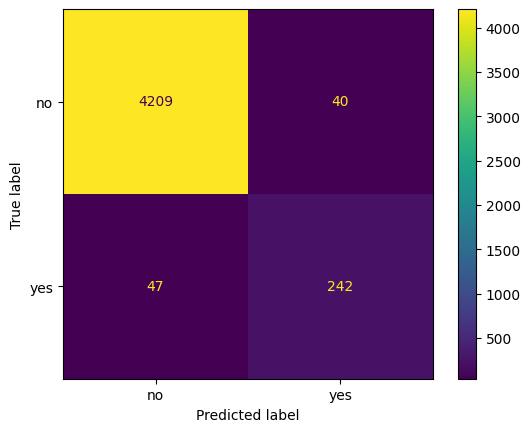

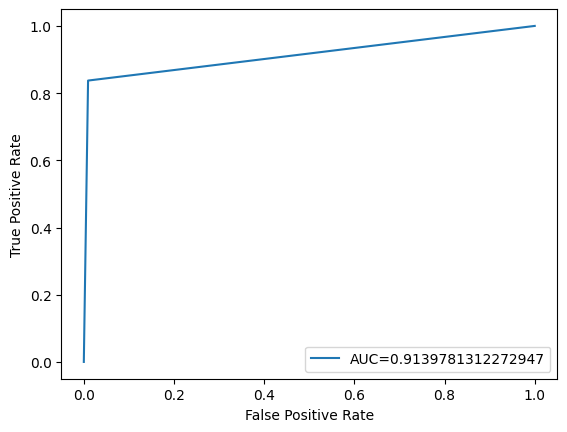

5: n_estimators: 100, max_depth: 4, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9819303657999119
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.87      0.84      0.86       289

    accuracy                           0.98      4538
   macro avg       0.93      0.92      0.92      4538
weighted avg       0.98      0.98      0.98      4538



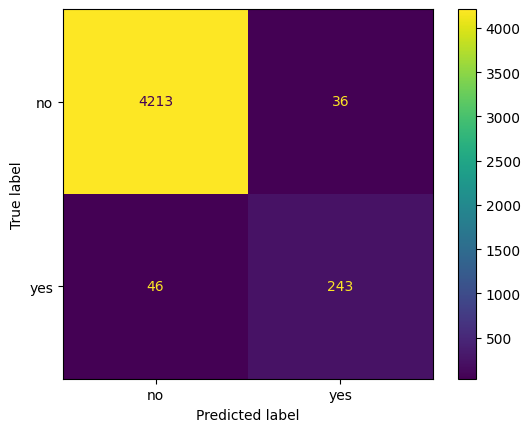

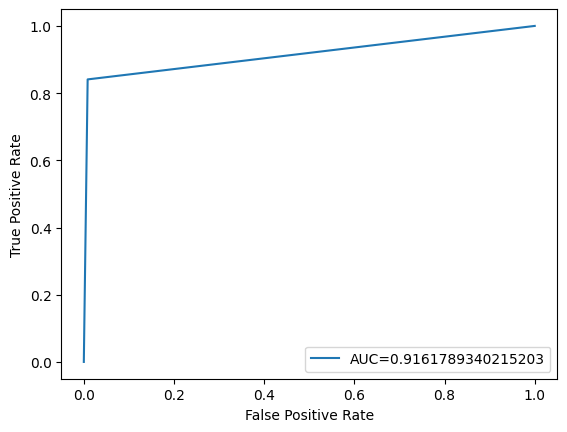

6: n_estimators: 100, max_depth: 4, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9801674746584399
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.87      0.81      0.84       289

    accuracy                           0.98      4538
   macro avg       0.93      0.90      0.91      4538
weighted avg       0.98      0.98      0.98      4538



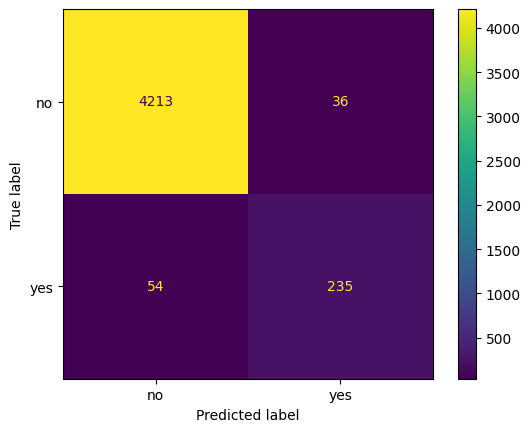

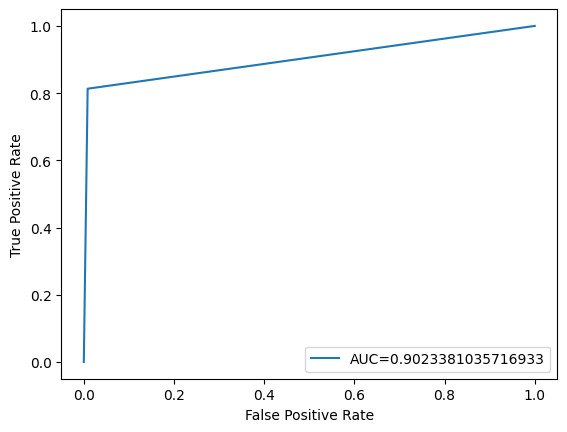

7: n_estimators: 100, max_depth: 5, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9806081974438079
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.85      0.84      0.85       289

    accuracy                           0.98      4538
   macro avg       0.92      0.92      0.92      4538
weighted avg       0.98      0.98      0.98      4538



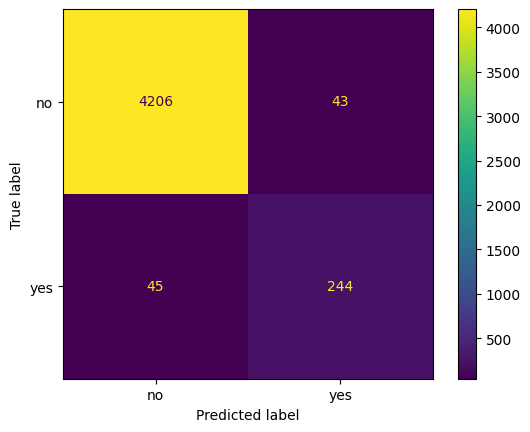

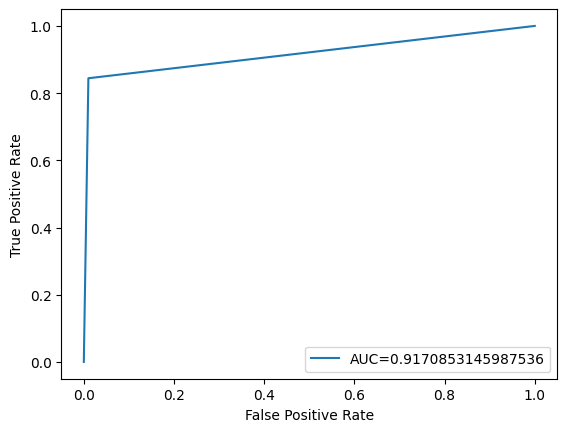

8: n_estimators: 100, max_depth: 5, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9788453063023358
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.85      0.82      0.83       289

    accuracy                           0.98      4538
   macro avg       0.92      0.90      0.91      4538
weighted avg       0.98      0.98      0.98      4538



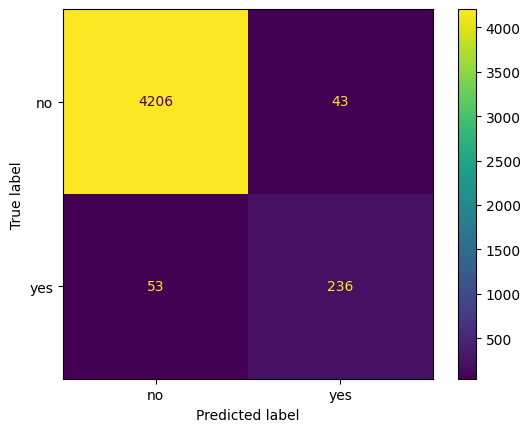

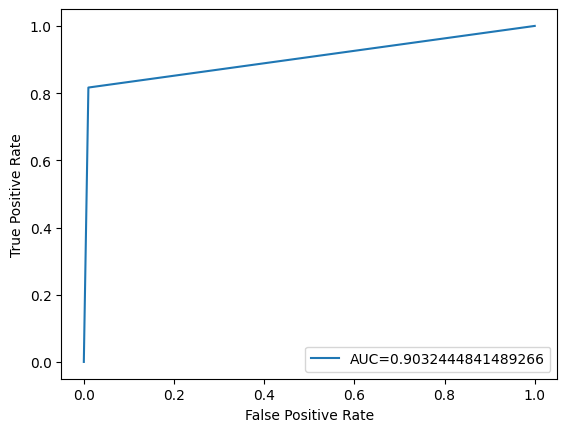

9: n_estimators: 100, max_depth: 5, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9799471132657558
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.86      0.81      0.84       289

    accuracy                           0.98      4538
   macro avg       0.93      0.90      0.91      4538
weighted avg       0.98      0.98      0.98      4538



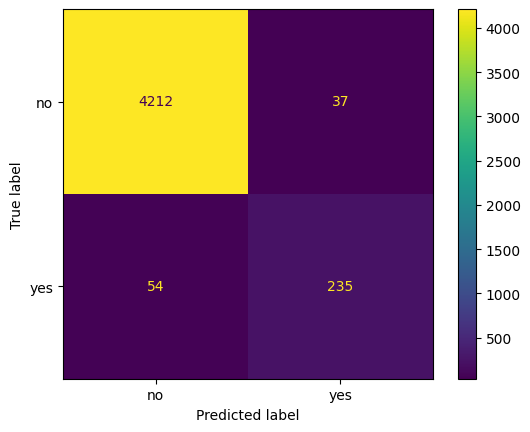

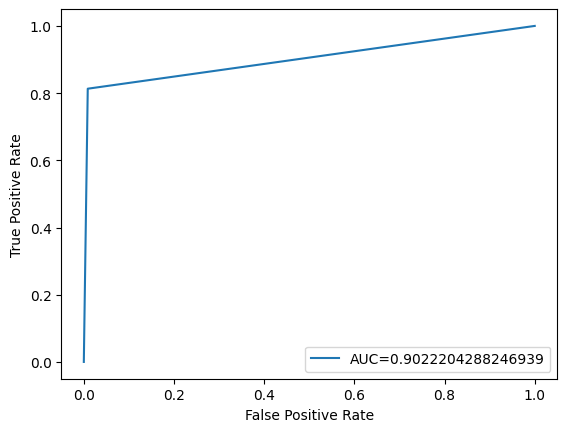

10: n_estimators: 200, max_depth: 3, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9817100044072279
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.86      0.85      0.86       289

    accuracy                           0.98      4538
   macro avg       0.93      0.92      0.92      4538
weighted avg       0.98      0.98      0.98      4538



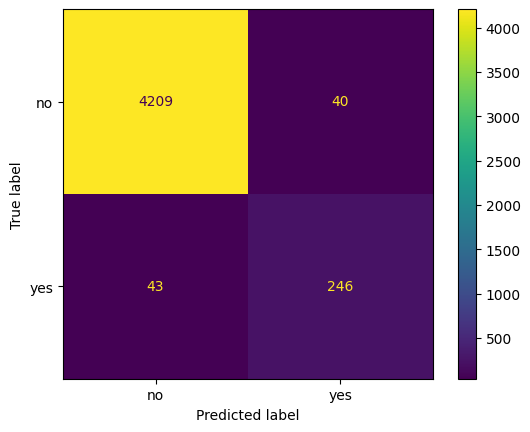

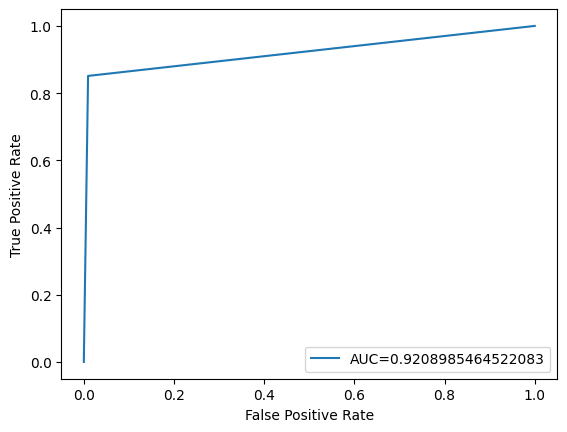

11: n_estimators: 200, max_depth: 3, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9808285588364919
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.86      0.84      0.85       289

    accuracy                           0.98      4538
   macro avg       0.92      0.92      0.92      4538
weighted avg       0.98      0.98      0.98      4538



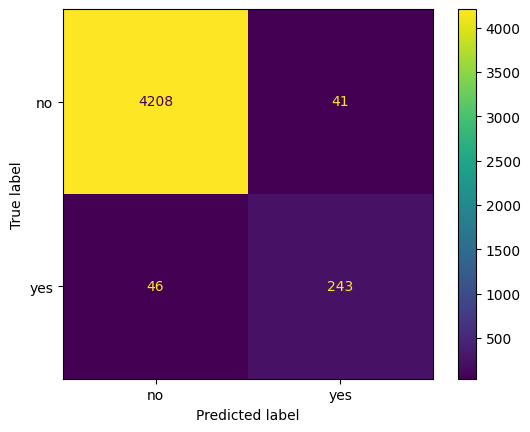

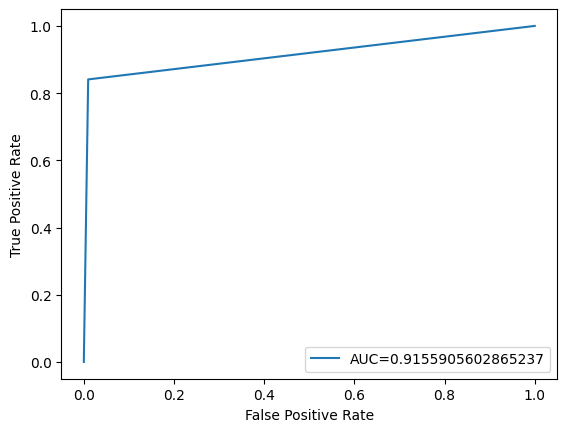

12: n_estimators: 200, max_depth: 3, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9795063904803878
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.85      0.82      0.84       289

    accuracy                           0.98      4538
   macro avg       0.92      0.91      0.91      4538
weighted avg       0.98      0.98      0.98      4538



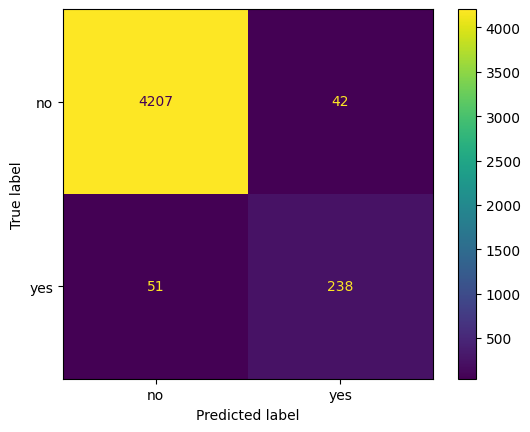

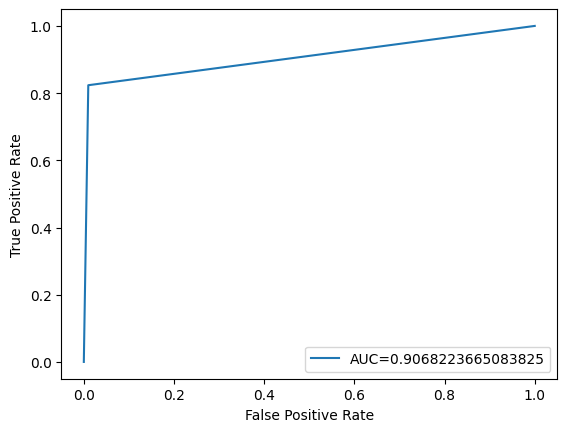

13: n_estimators: 200, max_depth: 4, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9821507271925959
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.87      0.85      0.86       289

    accuracy                           0.98      4538
   macro avg       0.93      0.92      0.92      4538
weighted avg       0.98      0.98      0.98      4538



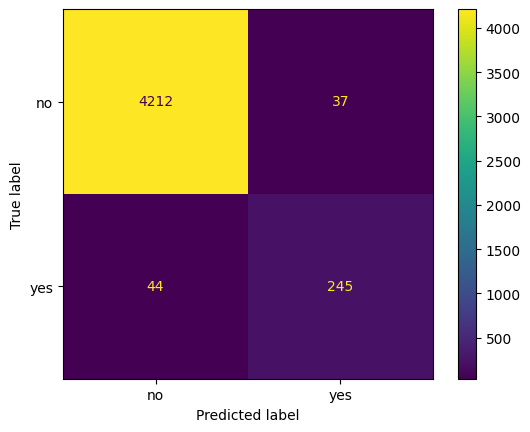

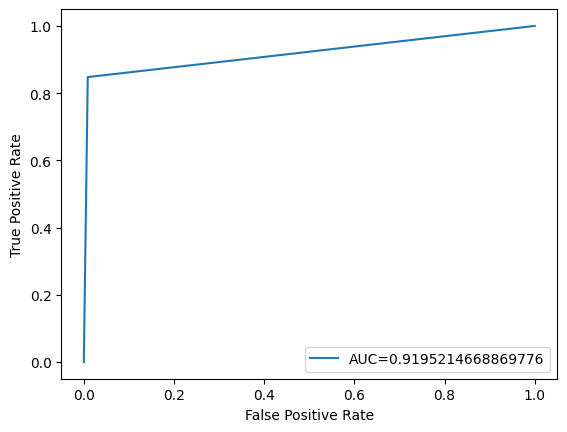

14: n_estimators: 200, max_depth: 4, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9799471132657558
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.85      0.83      0.84       289

    accuracy                           0.98      4538
   macro avg       0.92      0.91      0.91      4538
weighted avg       0.98      0.98      0.98      4538



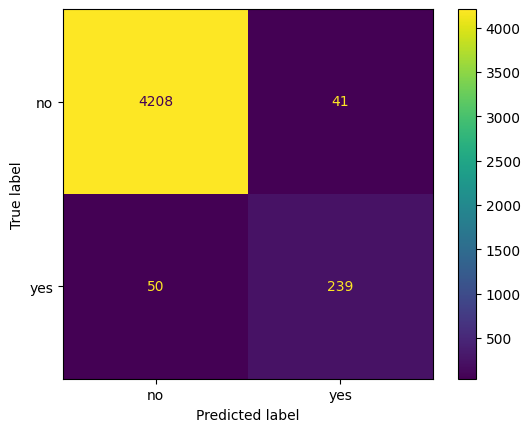

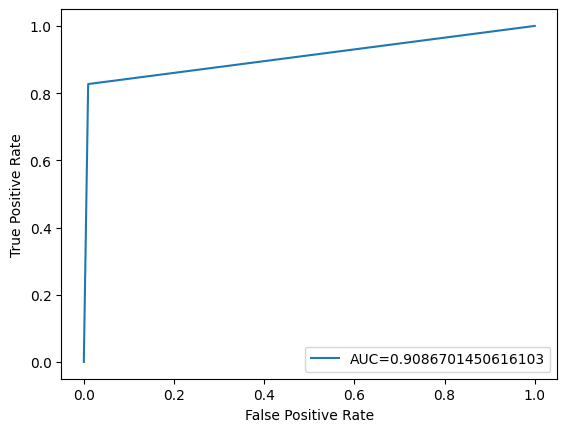

15: n_estimators: 200, max_depth: 4, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9801674746584399
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.86      0.83      0.84       289

    accuracy                           0.98      4538
   macro avg       0.92      0.91      0.92      4538
weighted avg       0.98      0.98      0.98      4538



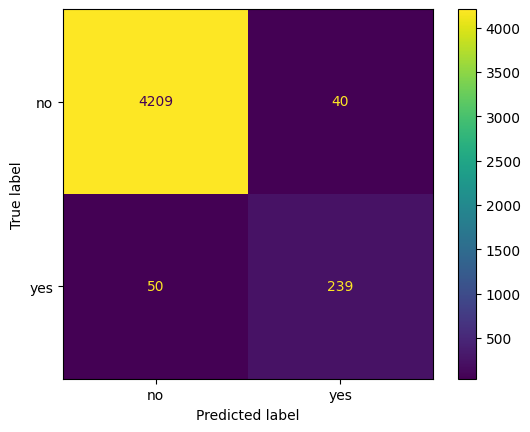

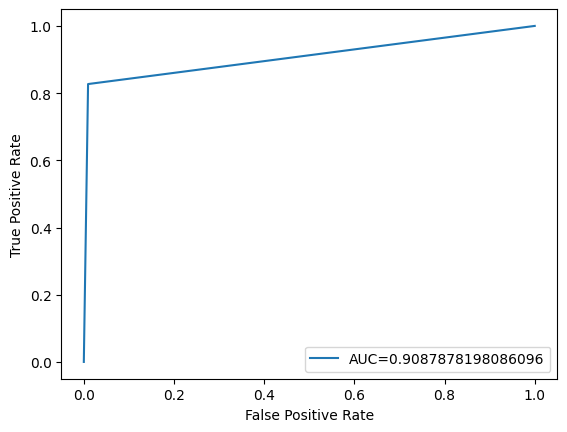

16: n_estimators: 200, max_depth: 5, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9803878360511239
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.85      0.84      0.84       289

    accuracy                           0.98      4538
   macro avg       0.92      0.91      0.92      4538
weighted avg       0.98      0.98      0.98      4538



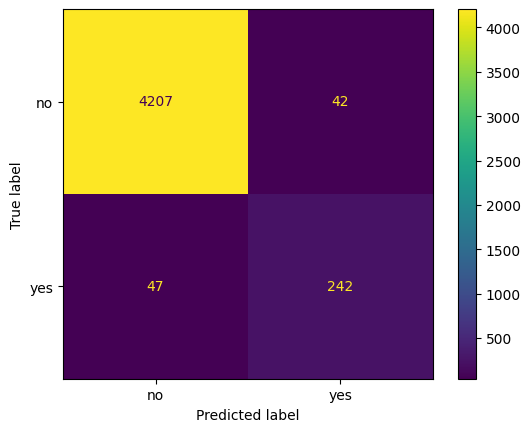

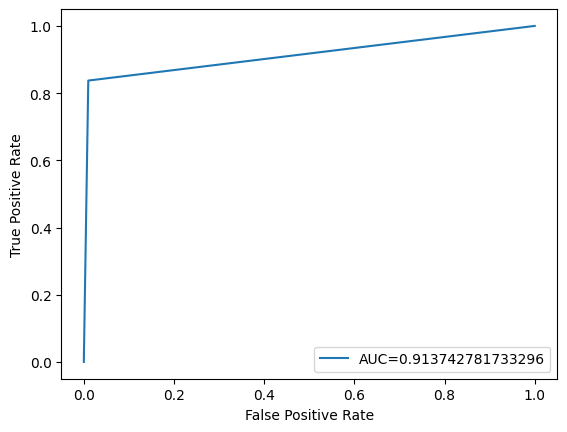

17: n_estimators: 200, max_depth: 5, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9797267518730718
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.86      0.82      0.84       289

    accuracy                           0.98      4538
   macro avg       0.92      0.91      0.91      4538
weighted avg       0.98      0.98      0.98      4538



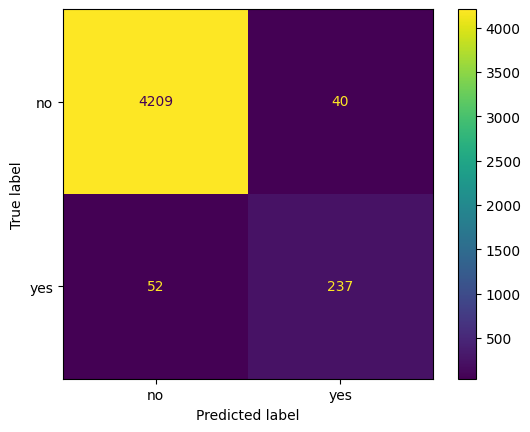

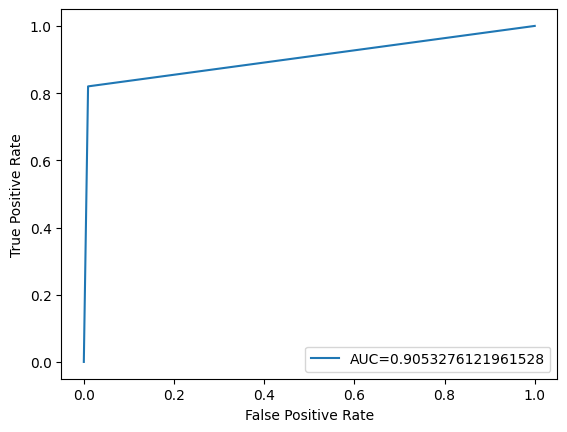

18: n_estimators: 200, max_depth: 5, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9795063904803878
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.86      0.82      0.84       289

    accuracy                           0.98      4538
   macro avg       0.92      0.90      0.91      4538
weighted avg       0.98      0.98      0.98      4538



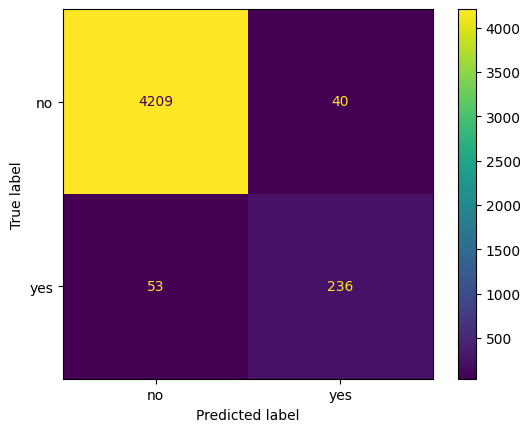

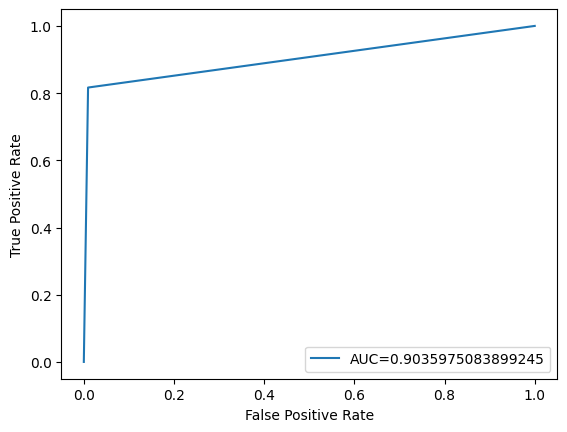

19: n_estimators: 300, max_depth: 3, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9825914499779639
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.87      0.85      0.86       289

    accuracy                           0.98      4538
   macro avg       0.93      0.92      0.93      4538
weighted avg       0.98      0.98      0.98      4538



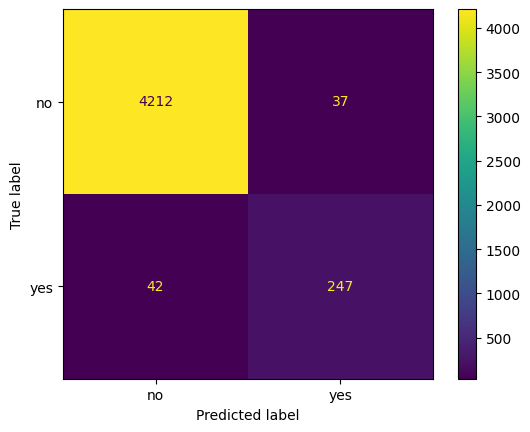

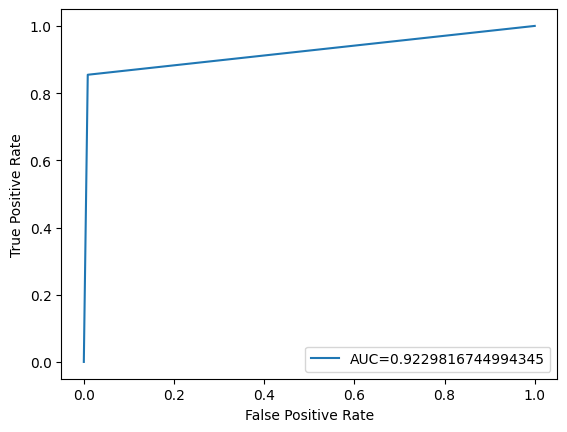

20: n_estimators: 300, max_depth: 3, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9801674746584399
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.85      0.83      0.84       289

    accuracy                           0.98      4538
   macro avg       0.92      0.91      0.92      4538
weighted avg       0.98      0.98      0.98      4538



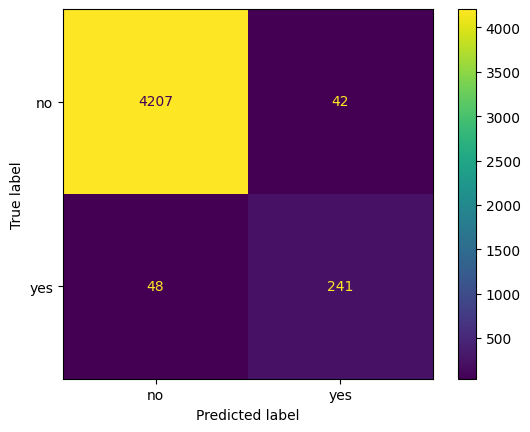

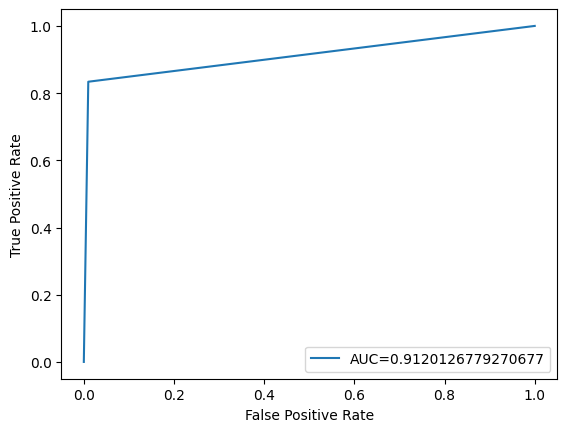

21: n_estimators: 300, max_depth: 3, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9803878360511239
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.85      0.84      0.84       289

    accuracy                           0.98      4538
   macro avg       0.92      0.91      0.92      4538
weighted avg       0.98      0.98      0.98      4538



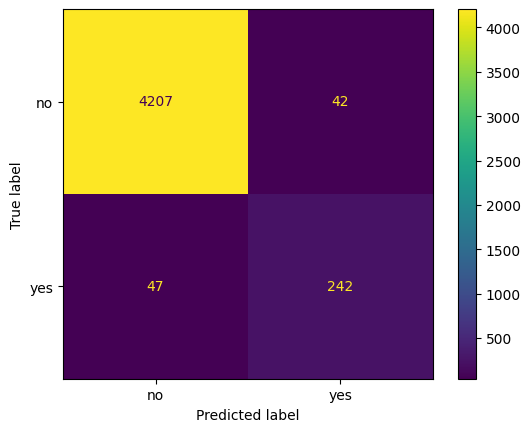

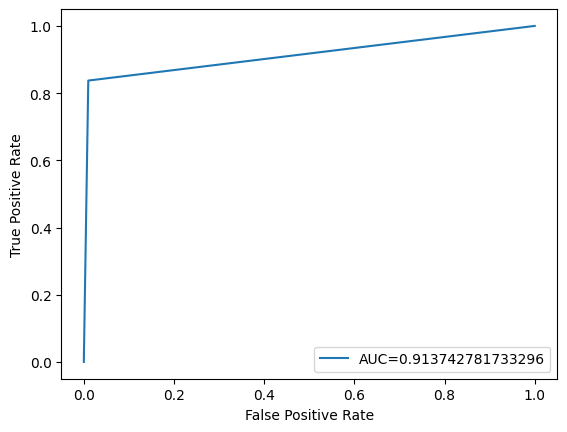

22: n_estimators: 300, max_depth: 4, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9819303657999119
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.87      0.84      0.86       289

    accuracy                           0.98      4538
   macro avg       0.93      0.92      0.92      4538
weighted avg       0.98      0.98      0.98      4538



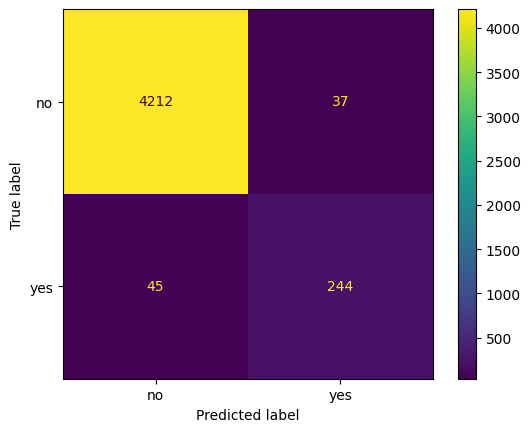

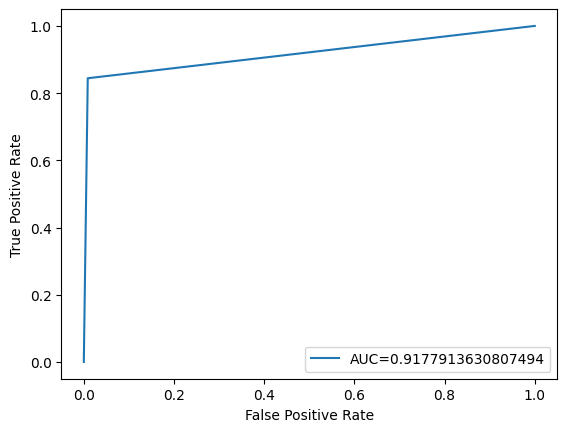

23: n_estimators: 300, max_depth: 4, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9808285588364919
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.86      0.83      0.85       289

    accuracy                           0.98      4538
   macro avg       0.92      0.91      0.92      4538
weighted avg       0.98      0.98      0.98      4538



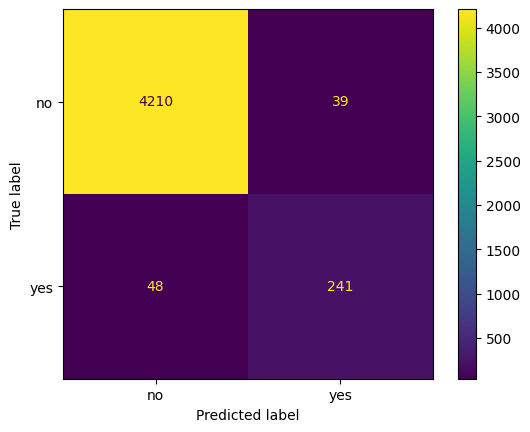

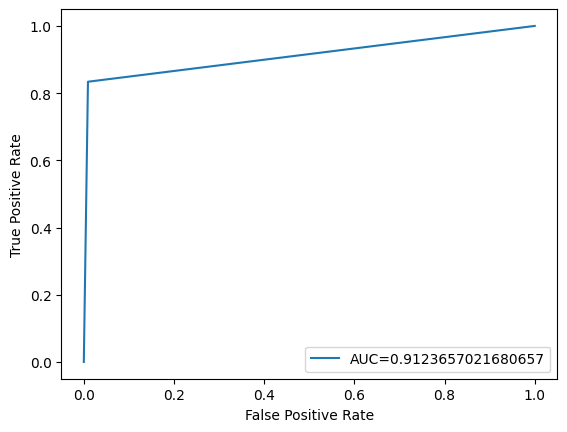

24: n_estimators: 300, max_depth: 4, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9799471132657558
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.86      0.82      0.84       289

    accuracy                           0.98      4538
   macro avg       0.92      0.91      0.91      4538
weighted avg       0.98      0.98      0.98      4538



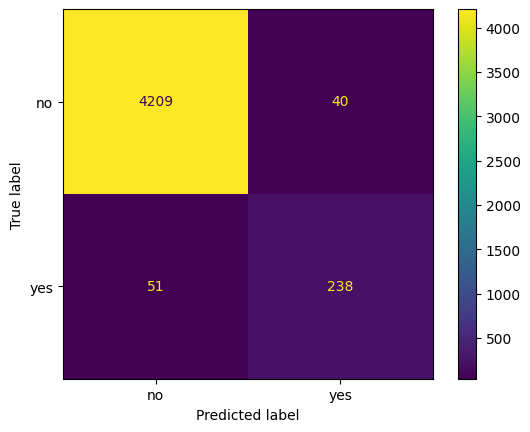

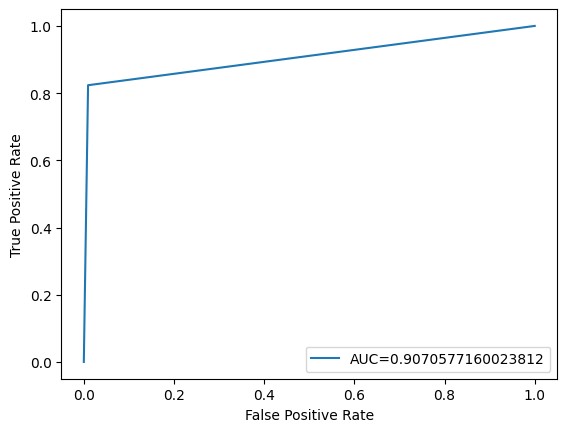

25: n_estimators: 300, max_depth: 5, Learning Rate: 0.1
XGBoost Model Accuracy:  0.9801674746584399
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.86      0.82      0.84       289

    accuracy                           0.98      4538
   macro avg       0.92      0.91      0.91      4538
weighted avg       0.98      0.98      0.98      4538



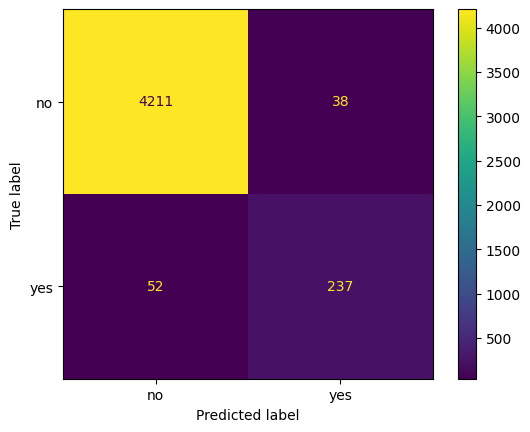

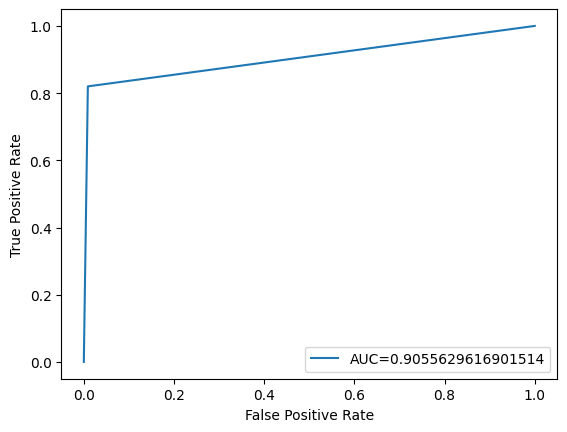

26: n_estimators: 300, max_depth: 5, Learning Rate: 0.25
XGBoost Model Accuracy:  0.9799471132657558
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.85      0.83      0.84       289

    accuracy                           0.98      4538
   macro avg       0.92      0.91      0.91      4538
weighted avg       0.98      0.98      0.98      4538



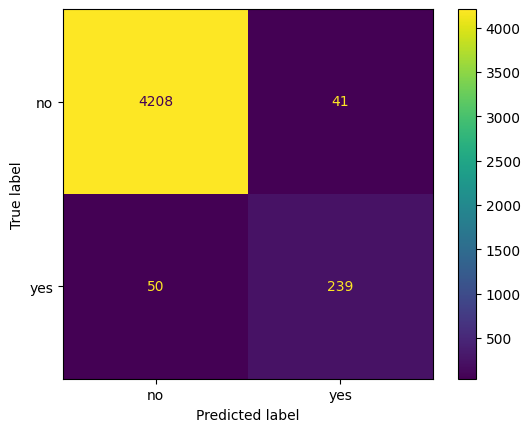

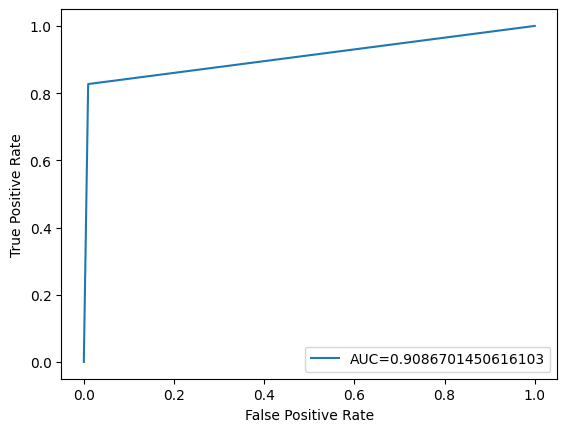

27: n_estimators: 300, max_depth: 5, Learning Rate: 0.5
XGBoost Model Accuracy:  0.9797267518730718
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4249
           1       0.86      0.82      0.84       289

    accuracy                           0.98      4538
   macro avg       0.92      0.91      0.91      4538
weighted avg       0.98      0.98      0.98      4538



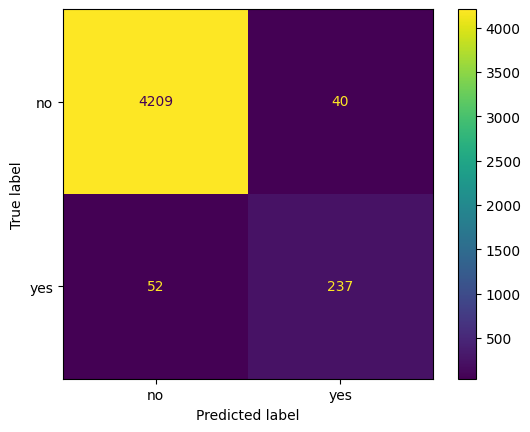

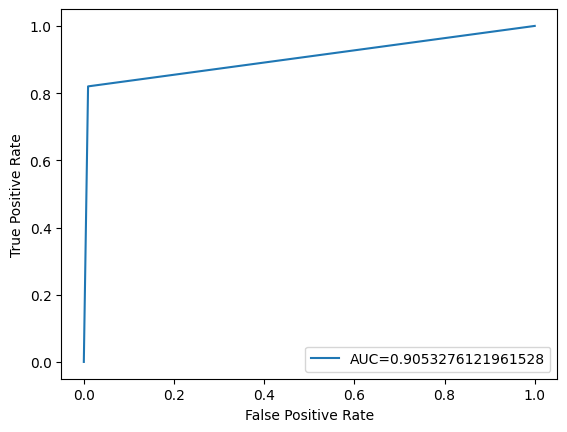

In [62]:
# For various combinations of hyperparameters:
estList = [100, 200, 300]
maxDepthList = [3, 4, 5]
lrList = [0.1, 0.25, 0.5]
count = 1
for e in estList:
  for d in maxDepthList:
    for lr in lrList:
      print(str(count) + ": n_estimators: " + str(e) + ", max_depth: " + str(d) +
            ", Learning Rate: " + str(lr))
      xg_model = xgb.XGBClassifier(random_state=42, n_estimators=e, max_depth=d,
                             learning_rate=lr)
      xg_model.fit(X2_train_full, y2_train_full)

      # Model evaluation
      predictions = xg_model.predict(X2_test)
      print("XGBoost Model Accuracy: ", accuracy_score(y2_test, predictions))
      print(classification_report(y2_test, predictions))
      cm = confusion_matrix(y2_test, predictions)
      cfmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["no","yes"])
      cfmd.plot()
      plt.show()

      fpr, tpr, _ = metrics.roc_curve(y2_test,  predictions)
      auc = metrics.roc_auc_score(y2_test, predictions)
      #create ROC curve
      plt.plot(fpr,tpr, label="AUC="+str(auc))
      plt.ylabel('True Positive Rate')
      plt.xlabel('False Positive Rate')
      plt.legend(loc=4)
      plt.show()
      count += 1

# Feature Importance

In [ ]:
feature_importance = pd.Series(xg_model.feature_importances_, index=X2_train.columns).sort_values()

feature_importance.plot.barh()
plt.show()

feature_importance.iloc[-10:].plot.barh()
plt.show()

In [ ]:
import shap
shap.initjs()

shap_ex = shap.TreeExplainer(xg_model)
vals = shap_ex(X2_test)
vals_df = pd.DataFrame(vals.values, columns=X2_test.columns, index=X2_test.index)
vals_df
shap.plots.beeswarm(vals)
shap.plots.violin(vals)